# Objetivo del proceso a realizar				
## Objetivos del desafío 1			
- Efectuar una limpieza del dataset provisto. Particularmente, deberá diseñar estrategias para lidiar con los datos perdidos en ciertas variables.		
- Realizar un análisis descriptivo de las principales variables.		
- Crear nuevas columnas a partir de las características dadas que puedan tener valor predictivo.		

<a id="indice"></a> 
## Índice de la notebook

[1) Imports](#1)

[2) Análisis general del dataset](#2)

[3) Análisis de duplicados](#3)

[4) Análisis de columnas](#4)

[5) Análisis inicial de la distribución de los datos](#5)

[6) Análisis de consistencia y calidad de los datos](#6)

[7) Análisis EDA](#7)

[8) Análisis y operación sobre datos faltantes](#8)

<a id="1"></a> 
### 1) Imports

[Ir a índice](#indice)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import re
%matplotlib inline

pd.set_option('display.float_format', lambda x: '%.3f' % x) # Evita la notacion cientifica
pd.set_option('display.max_columns', 500) # Ancho de cantidad de columnas
# pd.set_option('display.max_colwidth', None) #Ancho de lo que tiene dentro la columna

In [2]:
path = '~/Desktop/Data/properatti.csv'
data = pd.read_csv(path, sep = ",", index_col='Unnamed: 0')

In [3]:
df = data.copy()

<a id="2"></a> 
### 2) Analisis General del Data Set
[Ir a índice](#indice)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 121220 entries, 0 to 121219
Data columns (total 25 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   operation                   121220 non-null  object 
 1   property_type               121220 non-null  object 
 2   place_name                  121197 non-null  object 
 3   place_with_parent_names     121220 non-null  object 
 4   country_name                121220 non-null  object 
 5   state_name                  121220 non-null  object 
 6   geonames_id                 102503 non-null  float64
 7   lat-lon                     69670 non-null   object 
 8   lat                         69670 non-null   float64
 9   lon                         69670 non-null   float64
 10  price                       100810 non-null  float64
 11  currency                    100809 non-null  object 
 12  price_aprox_local_currency  100810 non-null  float64
 13  price_aprox_us

Revisamos el porcentaje de nulos

In [5]:
df.isnull().sum()/df.shape[0]*100

operation                     0.000
property_type                 0.000
place_name                    0.019
place_with_parent_names       0.000
country_name                  0.000
state_name                    0.000
geonames_id                  15.441
lat-lon                      42.526
lat                          42.526
lon                          42.526
price                        16.837
currency                     16.838
price_aprox_local_currency   16.837
price_aprox_usd              16.837
surface_total_in_m2          32.443
surface_covered_in_m2        16.422
price_usd_per_m2             43.395
price_per_m2                 27.687
floor                        93.484
rooms                        60.906
expenses                     88.235
properati_url                 0.000
description                   0.002
title                         0.000
image_thumbnail               2.567
dtype: float64

Transformamos a category las variables currency state_name country_name place_with_parent_names place_name property_type operation.

Transformamos a string las variables title description properati_url


In [6]:
df.iloc[:,1:6]=df.iloc[:,1:6].astype('category')
df.iloc[:,22:25]=df.iloc[:,22:25].astype(str)
df['currency']=df.currency.astype('category')

In [7]:
df.dtypes

operation                       object
property_type                 category
place_name                    category
place_with_parent_names       category
country_name                  category
state_name                    category
geonames_id                    float64
lat-lon                         object
lat                            float64
lon                            float64
price                          float64
currency                      category
price_aprox_local_currency     float64
price_aprox_usd                float64
surface_total_in_m2            float64
surface_covered_in_m2          float64
price_usd_per_m2               float64
price_per_m2                   float64
floor                          float64
rooms                          float64
expenses                       float64
properati_url                   object
description                     object
title                           object
image_thumbnail                 object
dtype: object

<a id="3"></a> 
### 3) Analisis de duplicados
[Ir a índice](#indice)

Vamos a ver si tenemos inmuebles duplicados en nuetro dataset.

Definimos que tenemos un duplicado si coinciden las filas "price", "place_name", "title", "surface_total_in_m2"

In [8]:
df.duplicated(['price','place_name','title','surface_total_in_m2']).any()

True

Nos muestra que tenemos duplicados, vamos a estudiarlos

In [9]:
duplicados_mask=df.duplicated(['price','place_name','title','surface_total_in_m2'], keep=False)


df[duplicados_mask].sort_values(['price','place_name','title','surface_total_in_m2'])[:20]


,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
47708,sell,apartment,Florida,|Argentina|Bs.As. G.B.A. Zona Norte|Vicente Ló...,Argentina,Bs.As. G.B.A. Zona Norte,3433908.000,"-34.535975,-58.478594",-34.536,-58.479,20000.000,USD,352890.000,20000.000,NaN,20.000,NaN,1000.000,NaN,3.000,NaN,http://www.properati.com.ar/198vn_venta_depart...,Corredor Responsable: Lucrecia Saulle - CSI 55...,VENTA COCHERA PLANTA BAJA DESC. VICENTE LOPEZ,https://thumbs4.properati.com/4/WOilGm5UnJ1yY0...
47715,sell,apartment,Florida,|Argentina|Bs.As. G.B.A. Zona Norte|Vicente Ló...,Argentina,Bs.As. G.B.A. Zona Norte,3433908.000,"-34.535975,-58.478594",-34.536,-58.479,20000.000,USD,352890.000,20000.000,NaN,20.000,NaN,1000.000,NaN,3.000,NaN,http://www.properati.com.ar/198vw_venta_depart...,Corredor Responsable: Lucrecia Saulle - CSI 55...,VENTA COCHERA PLANTA BAJA DESC. VICENTE LOPEZ,https://thumbs4.properati.com/4/RXmmPdghDy85Jc...
47717,sell,apartment,Florida,|Argentina|Bs.As. G.B.A. Zona Norte|Vicente Ló...,Argentina,Bs.As. G.B.A. Zona Norte,3433908.000,"-34.535975,-58.478594",-34.536,-58.479,20000.000,USD,352890.000,20000.000,NaN,20.000,NaN,1000.000,NaN,3.000,NaN,http://www.properati.com.ar/198vy_venta_depart...,Corredor Responsable: Lucrecia Saulle - CSI 55...,VENTA COCHERA PLANTA BAJA DESC. VICENTE LOPEZ,https://thumbs4.properati.com/4/RXmmPdghDy85Jc...
28938,sell,apartment,San Telmo,|Argentina|Capital Federal|San Telmo|,Argentina,Capital Federal,3428113.000,"-34.6234536,-58.3764477",-34.623,-58.376,22400.000,USD,395236.800,22400.000,13.000,0.000,1723.077,NaN,NaN,NaN,1800.000,http://www.properati.com.ar/17xm3_venta_depart...,"Departamento de 2 ambientes, con bajo mesada, ...",Departamento - San Telmo,https://thumbs4.properati.com/4/mvGoVviheZmfXv...
88036,sell,apartment,San Telmo,|Argentina|Capital Federal|San Telmo|,Argentina,Capital Federal,3428113.000,"-34.6234817427,-58.3764730084",-34.623,-58.376,22400.000,USD,395236.800,22400.000,13.000,NaN,1723.077,NaN,NaN,NaN,1800.000,http://www.properati.com.ar/1b6q5_venta_depart...,"Departamento de 2 ambientes, con bajo mesada, ...",Departamento - San Telmo,https://thumbs4.properati.com/0/MNoZTpXQpRO_rP...
48580,sell,house,Barrio Alto Camet,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,NaN,"-37.9541351,-57.5374449",-37.954,-57.537,27000.000,USD,476401.500,27000.000,310.000,30.000,87.097,900.000,NaN,2.000,NaN,http://www.properati.com.ar/19ado_venta_casa_b...,Dueño vende casa de 2 ambientes (1 dormitorio)...,Casa venta,https://thumbs4.properati.com/2/IVRHc8WDSxe45O...
48581,sell,house,Barrio Alto Camet,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,NaN,"-37.9541351,-57.5374449",-37.954,-57.537,27000.000,USD,476401.500,27000.000,310.000,30.000,87.097,900.000,NaN,2.000,NaN,http://www.properati.com.ar/19adp_venta_casa_b...,Dueño vende casa de 2 ambientes (1 dormitorio)...,Casa venta,https://thumbs4.properati.com/2/IVRHc8WDSxe45O...
48588,sell,house,Barrio Alto Camet,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,NaN,"-38.416097,-63.616672",-38.416,-63.617,27000.000,USD,476401.500,27000.000,310.000,30.000,87.097,900.000,NaN,2.000,NaN,http://www.properati.com.ar/19ae1_venta_casa_b...,Dueño vende casa de 2 ambientes (1 dormitorio)...,Casa venta,https://thumbs4.properati.com/3/eHvASCTC2qj_Ev...
94684,sell,store,Lanús,|Argentina|Bs.As. G.B.A. Zona Sur|Lanús|Lanús|,Argentina,Bs.As. G.B.A. Zona Sur,NaN,NaN,NaN,NaN,27000.000,USD,476401.500,27000.000,19.000,1.000,1421.053,27000.000,NaN,NaN,NaN,http://www.properati.com.ar/1bfyn_venta_local_...,Local Comercial de 3 x 6.50.-Gastos de escritu...,Local en Lanús Oeste,https://thumbs4.properati

Luego de observar el dataframe de duplicados, podemos comprobar que efectivamente lo son, asi que procedemos a dropearlos.

In [10]:
df = df.drop_duplicates(['price','place_name','title','surface_total_in_m2'])


Verificamos que todas las propiedades provistas estan para la venta, y ninguna en renta, con lo cual la columna 'operation' no nos aporta mucha informacion.

In [11]:
df.operation.unique()

array(['sell'], dtype=object)

Vamos a revisar los valores estadisticos de las variables numericas de nuestro Data set

In [12]:
cols=['price','price_aprox_local_currency','price_aprox_usd','surface_total_in_m2','surface_covered_in_m2','price_usd_per_m2','price_per_m2']
df[cols].describe()

,price,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2
count,94699.000,94699.000,94699.000,74106.000,91858.000,64887.000,82363.000
mean,465578.488,4287216.602,242977.506,242.941,137.460,2141.952,6772.532
std,2307937.712,7044238.337,399231.394,1739.620,759.461,2744.342,28822.614
min,0.000,0.000,0.000,0.000,0.000,0.600,1.510
25%,110000.000,1588005.000,90000.000,51.000,46.000,1200.000,1534.942
50%,185000.000,2579925.850,146217.000,88.000,77.000,1795.455,2200.000
75%,420000.000,4764015.000,270000.000,214.000,157.000,2481.481,3333.333
max,650000000.000,821271104.300,46545445.000,200000.000,187000.000,206333.333,3999999.960


Aca podemos observar algunos valores extraños en el data set:

* El valor minimo de superficie total, es 0.

* El valor minimo de venta es 0.

* El valor maximo de superficie llega a 20 hectareas


<a id="4"></a> 
### 4) Analisis de columnas
[Ir a índice](#indice)

**Analisis Descriptivo de las principales variables:**

Podemos separar a nuestras variables en 3 grandes grupos por su tipo:

Variables georeferenciales:

* geonames_id                  
* lat-lon                       
* lat                           
* lon                           

Variables relacionadas con el precio del inmueble: 

* price_per_m2: Es nuestra variable objetivo, es la que vamos a querer predecir en la siguiente etapa del trabajo, nos representa el precio por metro cuadrado del inmueble.VARIABLE CONTINUA

* price_usd_per_m2: Esta variable nos indica el valor en dolares por metro cuadrado del inmueble publicado.VARIABLE CONTINUA

* price: Esta variable nos indica el precio del inmueble expresado en la moneda "currency".VARIABLE CONTINUA

* currency: Esta variable nos indica la moneda en la que se publico el inmueble, puede valer (usd,ars,uyu,pen).VARIABLE CATEGORICA

Variables relacionadas con el tamaño del inmueble:

* surface_total_in_m2: Esta variable nos indica los metros cuadrados totales de la propiedad publicada.VARIABLE CONTINUA

* surface_covered_in_m2: Esta variable nos indica los metros cuadrados cubiertos de la propiedad publicada.VARIABLE CONTINUA

Variables que nos dan informacion sobre el lugar donde se encuentra la propiedad

* property_type: Nos indica el tipo de propiedad publicada (ph, apartment, house, store).VARIABLE CATEGORICA

* place_name: Nos indica el barrio(si es dentro de CABA) o localidad, de donde esta la propiedad publicada.VARIABLE CATEGORICA

* state_name: Nos indica la provincia en donde se encuentra la propiedad publicada.VARIABLE CATEGORICA

* place_with_parent_names: Es una combinacion de place_name y state_name, en algunos casos, con algunos datos mas sobre la ubicacion, como el partido. place_with_parent_names = |country_name|state_name|place_name|.VARIABLE CATEGORICA

Variables relacionadas con caracteristicas del inmueble:

* floor: Numero de piso en donde esta ubicado el inmueble(en caso de corresponder).VARIABLE CUALITATIVA ORDINAL

* rooms: Esta variable nos indica la cantidad de ambientes que posee el inmueble.VARIABLE CATEGORICA

* expenses: Valor de las expensas del inmueble (en caso de corresponder).VARIABLE CONTINUA

* description: Una breve descripcion sobre la propiedad en venta.

<a id="5"></a> 
### 5) Análisis inicial de la distribución de los datos
[Ir a índice](#indice)

In [13]:
#Para evitar problemas con los strings, convertimos todo el df en minuscula y eliminamos los ".".
df = df.applymap(lambda x: x.lower() if type(x) is str else x)

df = df.replace('\.',"",regex=True)


Droppeamos valores ilogicos, por ejemplo que un valor de superficie total sea menor que el de superficie cubierta, que alguna de las superficies valga 0, o que el precio de venta sea 0

In [14]:
sup_total_incorrecta = np.logical_or(df['surface_total_in_m2'] < df['surface_covered_in_m2'], df['surface_total_in_m2']==0)

df_sup_total_incorrecta=df[sup_total_incorrecta]
df_sup_total_incorrecta.shape

(1398, 25)

In [15]:
df.drop(index=df_sup_total_incorrecta.index, inplace=True)

In [16]:
df[sup_total_incorrecta]

<ipython-input-16-b1fafb12e45e>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df[sup_total_incorrecta]


,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail


In [17]:
precio_incorrecto = df[df.price == 0]
precio_incorrecto

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
9761,sell,house,córdoba,|argentina|córdoba|,argentina,córdoba,3860255.000,"45458426,-7567893099",4.546,-75.679,0.000,NaN,0.000,0.000,NaN,NaN,NaN,NaN,2.000,3.000,NaN,http://wwwproperaticomar/165i3_venta_casa_cord...,casa en venta de 2 dorm en armenia,se vende casa en el barrio el limonar,https://thumbs4properaticom/2/2hubkpzv0rywdaaj...


In [18]:
df.drop(index = precio_incorrecto.index ,inplace= True)

Dropeamos propiedades falsas

In [19]:
patron_falsas = re.compile(r'estas(\s)?propiedades(\s)?son(\s)?falsas')

encuentra_falsas = df.description.apply(lambda x: re.search(patron_falsas,str(x)))
falsas_mask=encuentra_falsas.notnull()
index_maldad=encuentra_falsas[falsas_mask].index

df = df.drop(index_maldad)

Dropeamos departamentos que tengan mas de 750 m2 (limite tomado a partir de publicaciones de zonaprop), y los que tengan menos de 18 m2(minimo permitido)

In [20]:
departamentos_fueradeumbral = \
df[np.logical_and(df.property_type=='apartment',np.logical_or(df.surface_total_in_m2>750, df.surface_total_in_m2<18))].index

In [21]:
df = df.drop(index =departamentos_fueradeumbral)

Dropeamos inmuebles que sean ventas de pozo, o para inversion, inmuebles que aun no fueron construidos, y por eso tienen un precio "promocionado"

In [22]:
patron_pozo = re.compile(r'pozo|inversion|financiacion|pre-venta|en(\s)?construccion|entrega|cuotas|emprendimiento|a(\s)?desarrollarse|proyecto')

encuentra_pozo = df.description.apply(lambda x: re.search(patron_pozo,str(x)))
                                      
pozo_mask=encuentra_pozo.notnull()

pozo = encuentra_pozo[pozo_mask].apply(lambda x: x.group())
print(df.shape)
df = df.drop(index = pozo.index)
print(df.shape)

patron_pozo = re.compile(r'pozo|inversion|financiacion|pre-venta|en(\s)?construccion|entrega|cuotas|emprendimiento|a(\s)?desarrollarse|proyecto')

encuentra_pozo = df.title.apply(lambda x: re.search(patron_pozo,str(x)))
                                      
pozo_mask=encuentra_pozo.notnull()

pozo = encuentra_pozo[pozo_mask].apply(lambda x: x.group())
print(df.shape)
df = df.drop(index = pozo.index)
print(df.shape)

(107839, 25)
(87535, 25)
(87535, 25)
(86869, 25)


In [23]:
df[df.place_name=='capital federal'].title[:5]

108    casa 180m² con 2 plantas en navarro, julián 29...
110    casa 744m² con 2 plantas en del valle iberluce...
115    casa 720m² con plantas en palma, diego 1800, a...
119    casa 200m² con cochera en barbosa, gerónimo 14...
121    casa 340m² con cochera en palma, diego 1300, a...
Name: title, dtype: object

In [24]:
place_names=list(df[df.state_name=='capitalfederal'].place_name.unique())

In [25]:
df["PLACE NAME"]=df.place_name

df_capitalfederal_mal_cargado = df[df.place_name=='capital federal']

for place in place_names:
    patron_placenames = re.compile(str(place))
    encuentra_names = df_capitalfederal_mal_cargado.description.apply(lambda x: re.search(patron_placenames,str(x)))
    encuentra_names_mask = encuentra_names.notnull()
    names = encuentra_names[encuentra_names_mask].apply(lambda x: x.group())
    df.loc[names.index,'PLACE NAME']=names
    
for place in place_names:
    patron_placenames = re.compile(str(place))
    encuentra_names = df_capitalfederal_mal_cargado.title.apply(lambda x: re.search(patron_placenames,str(x)))
    encuentra_names_mask = encuentra_names.notnull()
    names = encuentra_names[encuentra_names_mask].apply(lambda x: x.group())
    df.loc[names.index,'PLACE NAME']=names


Eliminamos los pocos registros que no tenian informacion sobre su ubicacion y estaban mal ingresados.

In [26]:
df_mal_ingresados = df[df["PLACE NAME"]=='capital federal']
df_mal_ingresados.shape[0]
df_mal_ingresados_index = df_mal_ingresados.index

In [27]:
df = df.drop(df_mal_ingresados_index)

Revisamos para capital federal los valores.

Separamos las columnas que consideramos tengan alguna relacion con el precio_per_m2 o nos puedan brindar informacion util 

In [28]:
cols_utiles_sin_price=['property_type','PLACE NAME','place_with_parent_names','state_name','currency'\
            ,'price_aprox_local_currency','price_aprox_usd','surface_total_in_m2','surface_covered_in_m2'\
            ,'price_usd_per_m2','price_per_m2','floor','rooms','expenses','description']

In [29]:
groupby_property_type=df.groupby('property_type')[cols_utiles_sin_price].median()
groupby_property_type

,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses
property_type,,,,,,,,,
apartment,2117340.000,120000.000,61.000,55.000,2146.552,2537.037,3.000,2.000,1800.000
house,4146457.500,235000.000,283.000,180.000,1038.462,1506.024,2.000,4.000,4800.000
ph,2117340.000,120000.000,98.000,75.000,1306.818,1703.203,2.000,3.000,500.000
store,3617122.500,205000.000,167.500,120.000,1555.556,1931.034,1.000,1.000,1111.000


Dado que 'price', depende del valor de currency, si esta en usd o en ars, vamos a calcularlos por separados, para no crear un bias.

In [30]:
groupby_property_type_price_usd=df[df.currency=='usd'].groupby('property_type')['price'].median()
groupby_property_type_price_ars=df[df.currency=='ars'].groupby('property_type')['price'].median()

groupby_property_type['price_usd']=groupby_property_type_price_usd
groupby_property_type['price_ars']=groupby_property_type_price_ars
groupby_property_type['cant de propiedades']=df.groupby('property_type')['operation'].count()

groupby_property_type

,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,price_usd,price_ars,cant de propiedades
property_type,,,,,,,,,,,,
apartment,2117340.000,120000.000,61.000,55.000,2146.552,2537.037,3.000,2.000,1800.000,129000.000,1360500.000,43916
house,4146457.500,235000.000,283.000,180.000,1038.462,1506.024,2.000,4.000,4800.000,250000.000,1400000.000,33732
ph,2117340.000,120000.000,98.000,75.000,1306.818,1703.203,2.000,3.000,500.000,123000.000,1020000.000,4934
store,3617122.500,205000.000,167.500,120.000,1555.556,1931.034,1.000,1.000,1111.000,230000.000,900000.000,3384


In [31]:
df_toplot=groupby_property_type.reset_index()

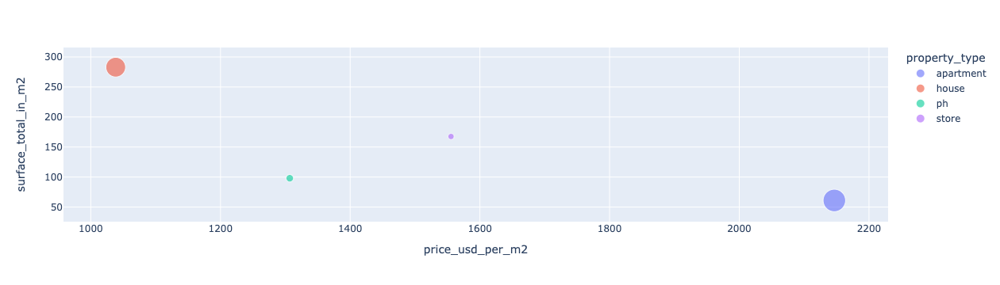

In [32]:
fig = px.scatter(data_frame = df_toplot, x = "price_usd_per_m2", y = "surface_total_in_m2",
                 size = "cant de propiedades", color = "property_type", opacity = 0.6)
fig.show()


Al agrupar las propiedades por su tipo, podemos realizar las siguientes observaciones:

*  Las casas son las propiedades que tienen el precio mas bajo en relacion a sus metros cuadrados.

*  Los departamentos son las propiedades que mayor valor por metro cuadrado tienen.

*  La mayoria de los inmuebles publicados son departamentos, seguidos por las casas.

In [33]:
groupby_provincia_price_usd=df[df.currency=='usd'].groupby('state_name')['price'].median()
groupby_provincia_price_ars=df[df.currency=='ars'].groupby('state_name')['price'].median()

groupby_provincia=df.groupby('state_name')[cols_utiles_sin_price].median()

groupby_provincia['price_usd']=groupby_provincia_price_usd
groupby_provincia['price_ars']=groupby_provincia_price_ars
groupby_provincia['cant de propiedades']=df.groupby('state_name')[cols_utiles_sin_price].count().property_type


groupby_provincia=groupby_provincia.sort_values('cant de propiedades',ascending=False)
groupby_provincia


,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,price_usd,price_ars,cant de propiedades
state_name,,,,,,,,,,,,
capital federal,2911342.500,165000.000,71.000,63.000,2407.550,2675.000,4.000,3.000,2116.000,166000.000,1708708.500,20904
bsas gba zona norte,4234680.000,240000.000,192.000,139.000,1583.333,1928.571,3.000,3.000,4000.000,245000.000,2283400.000,18962
bsas gba zona sur,2521399.050,142900.000,132.000,102.000,1409.091,1592.920,3.000,3.000,1500.000,145000.000,1020000.000,10853
córdoba,1830701.560,103754.800,90.000,100.000,1153.846,2754.717,1.000,3.000,1400.000,165000.000,1350000.000,8654
buenos aires costa atlántica,1764450.000,100000.000,75.000,69.000,1578.947,1702.128,4.000,3.000,1500.000,100000.000,1770000.000,8558
bsas gba zona oeste,2117340.000,120000.000,173.000,94.000,1125.000,1545.455,3.000,3.000,800.000,120000.000,750000.000,7428
santa fe,1499782.500,85000.000,70.000,62.000,1518.557,14000.000,3.000,3.000,800.000,129000.000,1300000.000,4968
buenos aires interior,2293785.000,130000.000,249.500,120.000,748.891,1375.000,3.000,4.000,1200.000,150000.000,1100000.000,1797
río negro,2823120.000,160000.000,175.000,125.000,1400.000,2441.667,4.000,4.000,600.000,180000.000,1100000.000,566


In [34]:
groupby_provincia_toplot=groupby_provincia.reset_index()

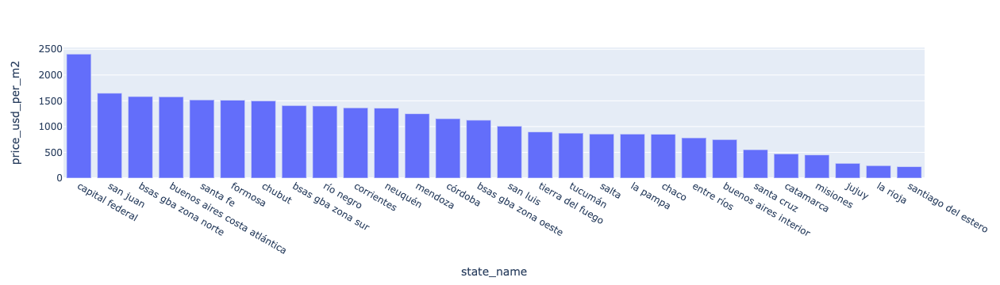

In [35]:
fig = px.bar(groupby_provincia_toplot, x="state_name", y="price_usd_per_m2",  barmode='stack')

fig.update_layout(
    hoverlabel=dict(
        bgcolor="white", 
        font_size=16, 
        font_family="Rockwell"
    )
)

fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'}) #Ordena manera decreciente


fig.show()

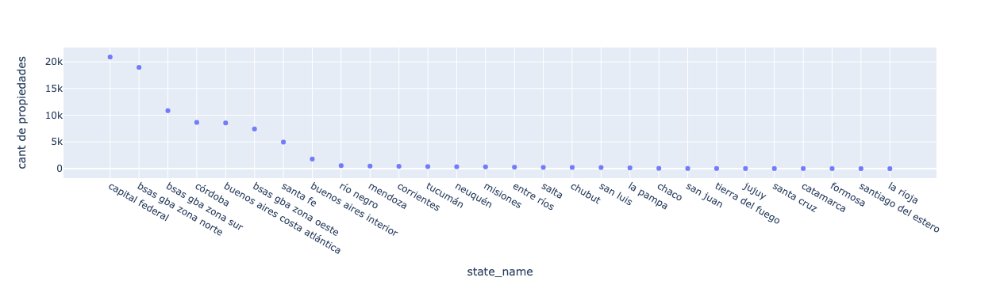

In [36]:
fig = px.scatter(data_frame = groupby_provincia_toplot, y = "cant de propiedades", x = "state_name"
                  ,opacity = 0.9)
fig.show()

Al agrupar las propiedades por provincia, podemos realizar las siguientes observaciones:

*  Las propiedades que se encuentran en capital federal, son las que tienen un precio por metro cuadrado en usd mas alto.

*  La mayor cantidad de propiedades en venta, se encuentran en capital federal, salvo que juntemos todas las subdivisiones de      provincia de buenos aires, en ese caso, seria la Provincia de Buenos Aires, la que ofrece mayor cantidad.


<a id="6"></a> 
### 6) Analisis de consistencia y calidad de los datos
[Ir a índice](#indice)

## place_with_parent_names

place_with_parent_names = |country_name|state_name|place_name|, con lo cual, no nos da informacion extra, y es mas facil utilizar para los groupby sus columnas "hijas", con lo cual, la utilizaremos para completar "place_name" y "Provincia, que tiene algunos nulos y luego la descartaremos.


Vamos a comprobar si podemos completar place_name, con place_with_parent_names. Para esto, vamos a eliminar las filas donde haya NaN en place_name y comparar si es igual al anteultimo elemento de place_with_parent_names, al aplicarle un split(el ultimo es el pipe).

In [37]:
place_name_tester=df.place_with_parent_names.apply(lambda x: x.split('|')[-2])
place_name_tester

0           mataderos
1            la plata
2           mataderos
3             liniers
4              centro
             ...     
121213       martínez
121214     san isidro
121215       belgrano
121216         beccar
121218    plaza colón
Name: place_with_parent_names, Length: 85966, dtype: object

In [38]:
place_name_null_mask = df.place_name.isnull()

In [39]:
(place_name_tester[~place_name_null_mask]==df.place_name[~place_name_null_mask]).all()

True

Comprobamos que podemos imputar el valor de place_name , a partir de la columna place_with_parent_names, asi que vamos a imputarlo, creando una nueva columna, que utilice la informacion de los registros anteriores

In [40]:
df.loc[place_name_null_mask,'PLACE NAME']=place_name_tester

df['PLACE NAME'].isnull().sum()

0

Nota: Esto ocurre para todos los casos salvo para cuando la propiedad esta radicada en mar del plata

In [41]:
df_mardelplata_centro=df[np.logical_and(df.state_name!='capital federal', df['PLACE NAME']=='centro')]

df.loc[df_mardelplata_centro.index,'PLACE NAME'] = 'mar del plata'

In [42]:
patron_microcentro = re.compile(r'centro')

encontra_microcentro = df['PLACE NAME'].apply(lambda x: re.match(patron_microcentro,str(x)))

encontra_microcentro_mask = encontra_microcentro.notnull()

index_microcentro=encontra_microcentro[encontra_microcentro_mask].index

df.loc[index_microcentro,'PLACE NAME']='centro/microcentro'

Si bien no hay valores np.NaN, podemos ver que hay una categoria 'nan', que nos quedo, son pocos valores, y todos corresponden a la misma ubicacion "fernandez", que hace referencia a San Isidro, Av Juan Fernandez.

In [43]:
df[df['PLACE NAME']=='nan']

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME


In [44]:
fila_fernandez = df[df['PLACE NAME']=='nan'].index
df.loc[fila_fernandez,'PLACE NAME']='san isidro'

In [45]:
fernandez_index=df[np.logical_and(df['PLACE NAME']=='san isidro', df.place_name=='capital federal')].index

df.loc[fernandez_index,'place_name'] = 'san isidro'


## surface_covered_in_m2

Vamos a imputar los valores NaN de surface_covered_in_m2, con informacion que encontremos el la variable description y ponerlos en una nueva columna que llamaremos SUPERFICIE CUBIERTA EN M2

Vamos a imputar valores de surface_covered_in_m2, a partir de datos obtenidos de la columna description

Para lo que es superficie cubierta, utilizamos un criterio para acotar de 404.9m2 maximo(quantile 90), para lo que serian casos como grandes depositos y 65m2, como minimo(quantile 10)

In [46]:
df['SUPERFICIE CUBIERTA EN M2']=df.surface_covered_in_m2

surface_covered_in_m2_null_mask=df.surface_covered_in_m2.isna()
patron_superficie_cubierta = re.compile(r'(cub(:)?\d+(m²|m2))|((cubierta|cub)(de)?(\d+))((m²|m2))|\d+(m²|m2)(cub)')

encuentra_superficie_cubierta = df.loc[surface_covered_in_m2_null_mask,'description'].apply(lambda x: re.search(patron_superficie_cubierta,str(x)))

encuentra_superficie_cubierta_mask=encuentra_superficie_cubierta.notnull()

superficie_cubierta=encuentra_superficie_cubierta[encuentra_superficie_cubierta_mask].apply(lambda x: x.group())

patron_limpiame_sup_cubierta = re.compile(r'\d+')
limpiame_sup_cubierta = superficie_cubierta.apply(lambda x: re.search(patron_limpiame_sup_cubierta,str(x)))

superficie_cubierta_str=limpiame_sup_cubierta.apply(lambda x: x.group())

superficie_cubierta_int = superficie_cubierta_str.astype(int)

superficie_cubierta_int_acotado_mask = np.logical_and(superficie_cubierta_int < superficie_cubierta_int.quantile(0.9),superficie_cubierta_int > superficie_cubierta_int.quantile(0.1))

superficie_cubierta_int_acotado=superficie_cubierta_int[superficie_cubierta_int_acotado_mask]

In [47]:
df.loc[surface_covered_in_m2_null_mask,'SUPERFICIE CUBIERTA EN M2'] = superficie_cubierta_int_acotado

## surface_total_in_m2

Vamos a completar valores a partir de datos que aparecen en description, creando una nueva columna llamada SUPERFICIE TOTAL EN M2

Utilizamos como criterio para acotar, el valor maximo de superficie total de 700m2(q3), y como minimo 44m2

Elegimos acotar los valores obtenidos con Regex, para no generar un bias, a partir de datos erroneos que haya tomado el patron.

In [48]:
df['SUPERFICIE TOTAL EN M2']=df.surface_total_in_m2

surface_total_in_m2_null_mask=df.surface_total_in_m2.isna()

patron_superficie_total = re.compile(r'(sup(\s)?cub(:)?(\s)?\d+(m²|m2|mts2))|((cubierta|cub)(\s)?(de)?(\s)?(\d+))((m²|m2|mts2))|\d+(\s)?(m²|m2|mts2)(\s)?(cub)|\d+\d+?(m²|m2|mts2)')

encuentra_superficie_total = df.loc[surface_total_in_m2_null_mask,'description'].apply(lambda x: re.search(patron_superficie_total,str(x)))

encuentra_superficie_total_mask=encuentra_superficie_total.notnull()

superficie_total_y_cubierta=encuentra_superficie_total[encuentra_superficie_total_mask].apply(lambda x: x.group())

patron_cubierta = re.compile(r'cub')

valores_sup_cubierta=superficie_total_y_cubierta.apply(lambda x:re.search(patron_cubierta,str(x)))

superficie_total=superficie_total_y_cubierta[valores_sup_cubierta.isnull()]


superficie_total_sin_m2=(superficie_total.replace('(m²|m2|mts2)','', regex=True))

superficie_total_int = superficie_total_sin_m2.astype(int)
superficie_total_int_acotado_mask = np.logical_and(superficie_total_int < superficie_total_int.quantile(0.8), superficie_total_int > superficie_total_int.quantile(0.2))

superficie_total_int_acotado=superficie_total_int[superficie_total_int_acotado_mask]



In [49]:
df.loc[surface_total_in_m2_null_mask,'SUPERFICIE TOTAL EN M2'] = superficie_total_int_acotado


## Price

El precio price_usd_per_m2, coincide con price/surface_covered_in_m2, cuando currency ==usd, para esto nos vamos a crear una nueva columna llamada PRECIO USD POR M2

In [50]:
df_dolares = df[df.currency=='usd']

df['PRECIO USD POR M2']=df_dolares[['price','surface_total_in_m2']].apply(lambda x: 0 if x.surface_total_in_m2 == 0 else x.price/x.surface_total_in_m2, axis=1)


In [51]:
df[['PRECIO USD POR M2','price_usd_per_m2']].sample(10)

,PRECIO USD POR M2,price_usd_per_m2
75601,NaN,NaN
88177,2360.000,2360.000
87205,1750.000,1750.000
30352,NaN,NaN
115247,NaN,NaN
73424,NaN,NaN
60439,337.972,337.972
25082,1333.333,1333.333
33421,NaN,NaN
53333,625.000,625.000


In [52]:
df['PRECIO USD POR M2'].notnull().sum()

45046

In [53]:
df['price_usd_per_m2'].notnull().sum()

49158

Como PRECIO USD POR M2 es igual que price_usd_per_m2, vamos a imputar los valores que podamos de PRECIO USD POR M2 con price_usd_per_m2

In [54]:
PRECIO_USD_POR_M2_null = df['PRECIO USD POR M2'].isna()

df.loc[PRECIO_USD_POR_M2_null,'PRECIO USD POR M2'] = df.loc[PRECIO_USD_POR_M2_null,'price_usd_per_m2']

#### Los precios estan en distintas monedas.

In [55]:
df.currency.value_counts()

usd    67135
ars     7031
uyu        1
Name: currency, dtype: int64

##### Primero, vamos a estudiar los casos donde currency vale pen y uyu

In [56]:
df_currency_uyu=df[df.currency=='uyu']
df_currency_uyu.description.values

array(['casa con calefacción central, mendoza, san roque, por $ 650000000'],
      dtype=object)

In [57]:
df_currency_uyu

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2
107390,sell,house,san roque,|argentina|mendoza|san roque|,argentina,mendoza,3836586.000,NaN,NaN,NaN,650000000.000,uyu,405477284.730,22980378.290,NaN,NaN,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/1by0s_venta_casa_san-...,"casa con calefacción central, mendoza, san roq...",casa - san vicente,https://thumbs4properaticom/2/pa0rbudkrk6ggvfy...,san roque,NaN,NaN,NaN


In [58]:
#Dado que el valor esta en otra moneda y nos parece una suma ilogica el precio, vamos a dropearlo
df = df.drop(index = df_currency_uyu.index)


In [59]:
df[df.currency=='pen'].description.values

array([], dtype=object)

La descripcion que podemos encontrar, es un poco confusa sobre los precios que usariamos para imputar, ya que por ejemplo no nos queda claro en que tipo de moneda esta, por lo que optamos por dropear esta fila.

In [60]:
df[df.currency=='pen']

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2


In [61]:
df.drop(index = df[df.currency=='pen'].index, inplace=True)
df.reset_index(drop=True,inplace=True)

#### **Ahora vamos a comprobar si columnas como 'price_aprox_local_currency' ,'price_aprox_usd' ,'place_with_parent_names' ,tienen alguna utilidad para nosotros, o la informacion que nos dan, las tenemos contenidas en otras columnas**

## 'price_aprox_local_currency', 'price_aprox_usd',

In [62]:
df[['price_aprox_local_currency','price_aprox_usd','price','currency']].sample(5)

,price_aprox_local_currency,price_aprox_usd,price,currency
52553,1411560.000,80000.000,80000.000,usd
46059,NaN,NaN,NaN,NaN
19081,2558452.500,145000.000,145000.000,usd
77325,1323337.500,75000.000,75000.000,usd
32344,4675792.500,265000.000,265000.000,usd


Observando el dataset, vemos que price_aprox_local_currency(ars), se aproxima al valor de price, cuando currency esta en 'ars'

Tambien vemos que price_aprox_usd, coincide con el valor de price, cuando currency esta en 'usd'.


In [63]:
ars_mask = df.currency == 'ars'

df_ars=df[ars_mask]

rel = df_ars.price/df_ars.price_aprox_local_currency
relacion = rel.mean()
relacion

1.009915671255779

*Observamos que la relacion entre price y price_aprox_local_currency, es "relacion"*


Nuestro objetivo, es obtener informacion nueva de price_aprox_local_currency y price_aprox_usd, para completar PRICE USD POR M2, price, price_per_m2

Veamos primero si nos son utiles estas columnas para lo que queremos hacer.

In [64]:
notnull_price_aprox_local_currency=df.price_aprox_local_currency.notnull()
notnull_price_aprox_usd=df.price_aprox_usd.notnull()
price_ars_usd = np.logical_or((df.currency == 'usd'),(df.currency == 'ars'))
null_price_ars_usd=df.price[price_ars_usd].isnull()


price_local_o_price_usd=np.logical_or(notnull_price_aprox_local_currency,notnull_price_aprox_usd)

null_price_notnull_price_local_o_price_usd=np.logical_and(price_local_o_price_usd,null_price_ars_usd)

null_price_notnull_price_local_o_price_usd.any()

False

Por lo tanto, comprobamos que **NO HAY** ningun valor no nulo en price_aprox_usd o price_aprox_local_currency, que podamos utilizar para imputar price, con currency 'ars' o 'usd'

Vamos a imputar los valores NaN de Price, con informacion que encontremos el la variable description y ponerlos en una nueva columna que llamaremos PRICE, dependiendo si son usd o pesos, tambien completaremos una nueva columna que llamaremos CURRENCY

#### Price en usd

Vamos a tomar como criterio de valor maximo de price en usd 265.000(q3), y un valor minimo de 95000(q1)

Dado que vamos a trabajar con Regex, vamos a eliminar los espacios del df, para simplificar los patrones de busqueda 

In [65]:
df = df.replace(" ","", regex=True)

In [66]:
df['PRICE']=df.price
df['CURRENCY']=df.currency

price_null_mask = df.price.isnull()

patron_price_usd = re.compile(r'u\$d\d+')

encuentra_price_usd = df.loc[price_null_mask,'title'].apply(lambda x: re.search(patron_price_usd,str(x)))
encuentra_price_usd_mask=encuentra_price_usd.notnull()

price_usd_str = encuentra_price_usd.loc[encuentra_price_usd_mask].apply(lambda x: x.group())

price_usd_clean = price_usd_str.apply(lambda x: x.split('u$d')[1])

price_usd_int = price_usd_clean.astype(int)

price_usd_int_acotado_mask = \
np.logical_and(price_usd_int < price_usd_int.quantile(0.75), price_usd_int > price_usd_int.quantile(0.25))

price_usd_int_acotado=price_usd_int[price_usd_int_acotado_mask]

df.loc[price_usd_int_acotado.index,'PRICE']=price_usd_int_acotado
df.loc[price_usd_int_acotado.index,'CURRENCY']='usd'


#### Price en ars

In [67]:
price_null_mask = df.price.isnull()

patron_price_ars = re.compile(r'\$\d+')

encuentra_price_ars = df.loc[price_null_mask,'title'].apply(lambda x: re.search(patron_price_ars,str(x)))
encuentra_price_ars_mask=encuentra_price_ars.notnull()

price_ars_str = encuentra_price_ars.loc[encuentra_price_ars_mask].apply(lambda x: x.group())


price_ars_clean = price_ars_str.apply(lambda x: x.split('$')[1])

price_ars_int = price_ars_clean.astype(int)

price_ars_int_acotado_mask = \
np.logical_and(price_ars_int < price_ars_int.quantile(0.75), price_ars_int > price_ars_int.quantile(0.25))

price_ars_int_acotado=price_ars_int[price_ars_int_acotado_mask]

df.loc[price_ars_int_acotado.index,'PRICE']=price_ars_int_acotado
df.loc[price_ars_int_acotado.index,'CURRENCY']='ars'


Ahora vamos a crear una nueva columna que se llame PRECIO USD, que sera el precio en usd del inmueble

In [68]:
df_usd = df[df['CURRENCY']=='usd']

df['PRECIO USD'] = df[['PRECIO USD POR M2','SUPERFICIE TOTAL EN M2']].apply(lambda x: x['PRECIO USD POR M2']*x['SUPERFICIE TOTAL EN M2'], axis=1)

df.loc[df_usd.index,'PRECIO USD'] = df.PRICE

## Duplex / Triplex

Creamos una nueva categoria de propiedades, los duplex.

In [69]:
df['TIPO DE PROPIEDAD']=df.property_type


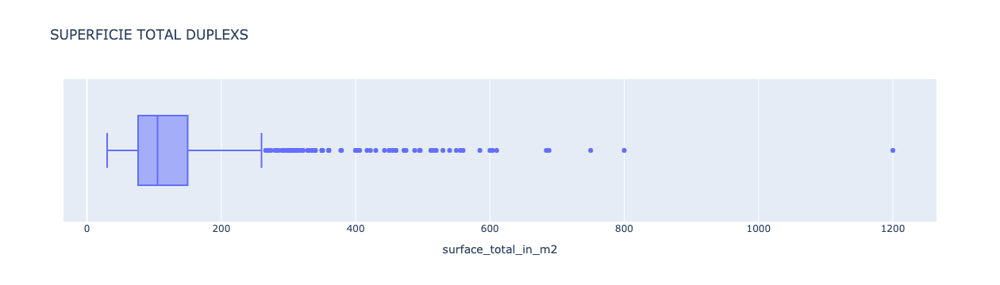

In [70]:
patron_duplex = re.compile(r'duplex|triplex|dúplex')

encuentra_duplex = df.title.apply(lambda x: re.search(patron_duplex, str(x)))


encuentra_duplex_mask = encuentra_duplex.notnull()

px.box(df[encuentra_duplex_mask], x='surface_total_in_m2', title= 'SUPERFICIE TOTAL DUPLEXS')

In [71]:
df[encuentra_duplex_mask].shape

(2392, 33)

In [72]:

df.loc[encuentra_duplex_mask,'TIPO DE PROPIEDAD']='duplex/triplex'

### Piso / Penthouses

In [73]:
df_apartamento=df[df.property_type=='apartment']

patron_piso = re.compile(r'piso|semipiso')

depto_sup_mayor_200m2 = df[np.logical_and(np.logical_or(df.surface_total_in_m2>200, df.surface_covered_in_m2>200), df.property_type=='apartment')]

encuentra_piso = depto_sup_mayor_200m2.title.apply(lambda x: re.search(patron_piso, str(x)))


encuentra_piso_mask = encuentra_piso.notnull()

piso=encuentra_piso[encuentra_piso_mask].apply(lambda x: x.group())

patron_penthouse = re.compile(r'penthouse')

encuentra_pent = df[df.property_type=='apartment'].description.apply(lambda x: re.search(patron_penthouse, str(x)))

encuentra_pent_mask = encuentra_pent.notnull()

pent_index = df_apartamento.loc[encuentra_pent_mask].index
piso_index = piso.index

df.loc[pent_index,'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[piso_index,'TIPO DE PROPIEDAD']='piso/penthouse'


In [74]:
df_apartamento=df[df.property_type=='apartment']

patron_piso = re.compile(r'piso|semipiso')

depto_sup_mayor_200m2 = df[np.logical_and(np.logical_or(df.surface_total_in_m2>200, df.surface_covered_in_m2>200), df.property_type=='apartment')]

encuentra_piso = depto_sup_mayor_200m2.description.apply(lambda x: re.search(patron_piso, str(x)))


encuentra_piso_mask = encuentra_piso.notnull()

piso=encuentra_piso[encuentra_piso_mask].apply(lambda x: x.group())

patron_penthouse = re.compile(r'penthouse')

encuentra_pent = df[df.property_type=='apartment'].title.apply(lambda x: re.search(patron_penthouse, str(x)))

encuentra_pent_mask = encuentra_pent.notnull()

pent_index = df_apartamento.loc[encuentra_pent_mask].index
piso_index = piso.index

df.loc[pent_index,'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[piso_index,'TIPO DE PROPIEDAD']='piso/penthouse'

<a id="7"></a> 
### 7) Analisis EDA
[Ir a índice](#indice)

#### Outliers

Vamos a graficar algunas variables numericas a ver como esta distribuida nuestra data

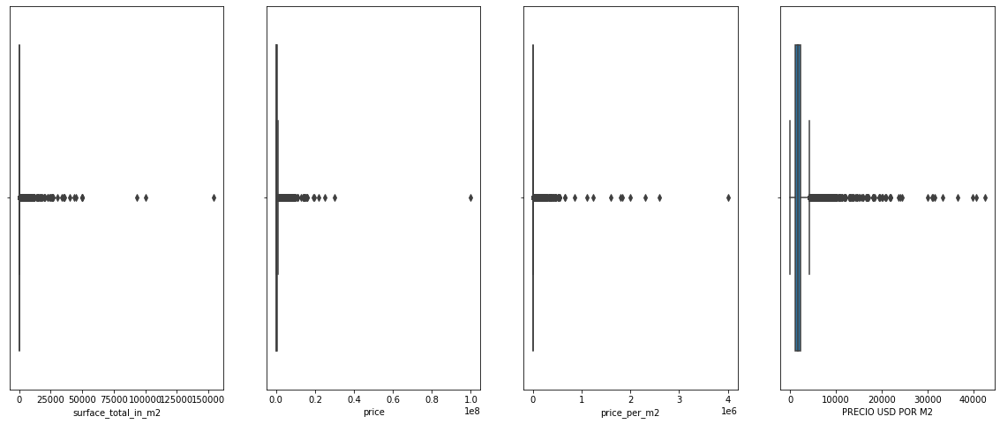

In [75]:
fig,ax = plt.subplots(ncols=4, figsize=(20,8))

sns.boxplot(data=df, x='surface_total_in_m2', ax=ax[0]) 
sns.boxplot(data=df, x='price', ax=ax[1]) 
sns.boxplot(data=df, x='price_per_m2', ax=ax[2]) 
sns.boxplot(data=df, x='PRECIO USD POR M2', ax=ax[3])

plt.show()

Dado que los ultimos 2 graficos son consecuencia de los primeros dos, vamos a trabajar con ellos.

## surface_total_in_m2

## Apartment

Vamos a buscar outliers a partir de place_name en departamentos de capital federal

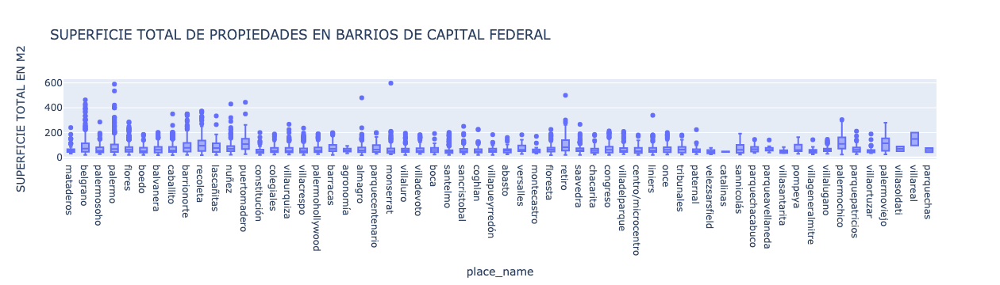

In [76]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='apartment')],\
             y = "SUPERFICIE TOTAL EN M2", x='place_name', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL')
fig.show()


### mataderos - Apartment

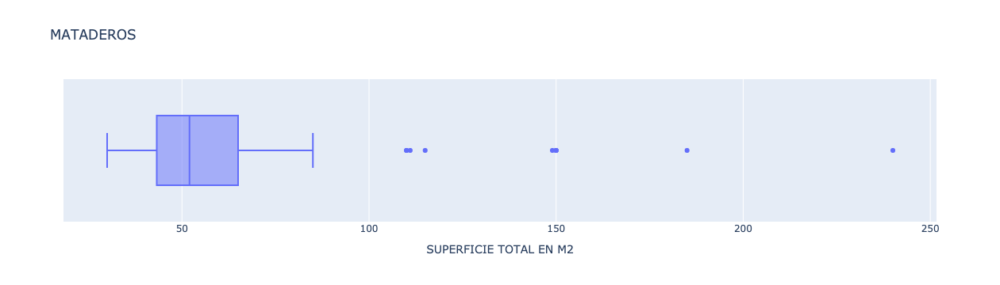

In [77]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='mataderos',df['TIPO DE PROPIEDAD']=='apartment')],\
             x = "SUPERFICIE TOTAL EN M2", title='MATADEROS')
fig.show()

In [78]:
df_apartamentos = df[df['TIPO DE PROPIEDAD']=='apartment']


mataderos_index=df_apartamentos[df_apartamentos['PLACE NAME']=='mataderos'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:7].index
df_apartamentos[df_apartamentos['PLACE NAME']=='mataderos'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:7]


,SUPERFICIE TOTAL EN M2,title,description
19543,240.000,avevapern5800,publicadoporcirculoinmobiliariasuratravesinmomap
57563,185.000,departamentotipoph,"departamentotipoph,estáenlaplantaalta1erpiso,e..."
75266,150.000,departamento-mataderos,exclusivospisos4ambientesdecategoría!!dos(2)co...
40045,150.000,casa4ambientes-mataderos,"excelentechalet,compuestodepatioyporchedeingre..."
44075,150.000,"3ambconterraza,parrillaysotano(estado100impeca...",codigo:114-577ubicadoen:araujo-publicadopor:in...
60510,149.000,"departamento4ambientescondep2balcones,todoalex...",departamentode4ambientesalfrente2balconesdoble...
74199,115.000,departamento-mataderos,ventadedepartamentoph3ambientescongarageenmata...


In [79]:
df.loc[mataderos_index[3],'TIPO DE PROPIEDAD']='house'

In [80]:
df.loc[mataderos_index[1],'TIPO DE PROPIEDAD']='ph'

In [81]:
df.loc[mataderos_index[6],'TIPO DE PROPIEDAD']='ph'

### belgrano - Apartment

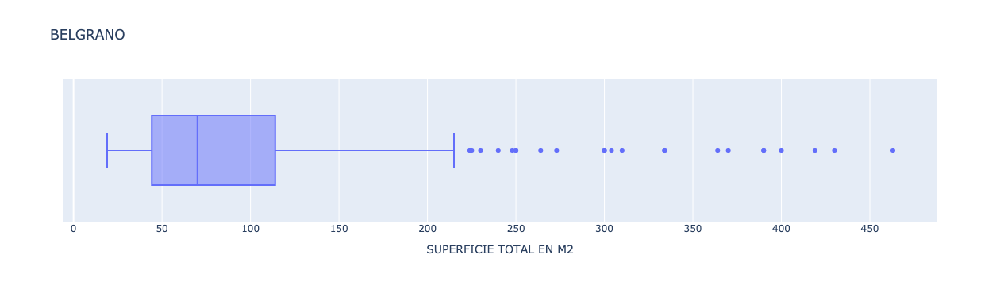

In [82]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='belgrano',df['TIPO DE PROPIEDAD']=='apartment')], x = "SUPERFICIE TOTAL EN M2", title='BELGRANO')
fig.show()

In [83]:
belgrano_index = df_apartamentos[df_apartamentos['PLACE NAME']=='belgrano']\
.sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title']][:18].index

df_apartamentos[df_apartamentos['PLACE NAME']=='belgrano'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:18]


,SUPERFICIE TOTAL EN M2,title,description
618,463.000,departamentoenventa,"ventadedepartamento4dormitoriosenbelgrano,capi..."
41997,430.000,departamentoenventa,"excelentedepartamentoenventa/forumalcorta,cata..."
36360,419.000,belgrano/laimprenta7ambaptoprofdepcochera,corredorresponsable:arielchampanier-cucicba433...
24974,400.000,belgranoexcelentedepartamentoenventade8ambientes,excelentedepartamentoenventaentorredecategoría...
70434,390.000,4suitesescritorioyplayroombalconterrazaypileta...,espectaculardepartamentotipocasaconbalcónterra...
70211,390.000,departamentoenbelgrano,ventadepartamento6ambientesbelgranotorreaisens...
70294,370.000,3defebreroyzabala-torredemaximacategoriaconame...,torredemáximacategoríagranlivingconsalidaabalc...
85838,364.000,departamento-belgranoc,avisolegal:lasdescripcionesarquitectónicasyfun...
37586,334.000,departamentoventa,"enbelgrano,sobreluismcampos,entreollerosyfeder..."
38496,334.000,muylindodepartamentocon200mts²dejardínson334m2...,"enbelgrano,sobreluismcampos,entreollerosyfeder..."


In [84]:
df.loc[belgrano_index[0],'TIPO DE PROPIEDAD']='duplex/triplex'

### palermo soho - Apartment

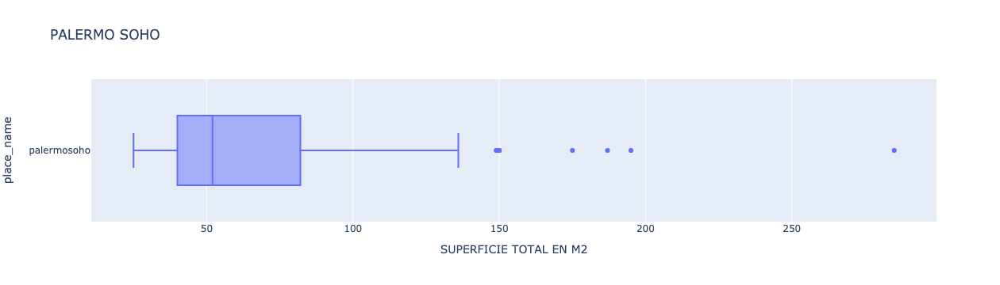

In [85]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='palermosoho',df['TIPO DE PROPIEDAD']=='apartment')],\
             x = "SUPERFICIE TOTAL EN M2", y='place_name', title='PALERMO SOHO')
fig.show()

In [86]:
palermosoho_index = df_apartamentos[df_apartamentos['PLACE NAME']=='palermosoho'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title']][:6].index

df_apartamentos[df_apartamentos['PLACE NAME']=='palermosoho'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:6]


,SUPERFICIE TOTAL EN M2,title,description
78073,285.000,departamentoventa,hermosadptodedosambientesmuyeconómico
76746,195.000,"departamentoenventaenpalermosoho,capitalfederal",codigo:1237-76ubicadoen:paraguay4700-publicado...
7526,187.000,semipisoenjuncalentreugartecheyrepublicaarabes...,excelentesemipisoalfrenteconluzdemañanaenmuyes...
41346,175.000,excelentedeptoentorreconterrazasparrillavista3...,excelentepisoentorrefullamenitiesvista360grado...
63264,150.000,paraguay4700,latorresohoiiestáconstruidasobreunaampliafracc...
10429,150.000,departamentoenpalermosohocongranbalcónterraza,codigo:3016-wp0141ubicadoen:malabia12219nopiso...


In [87]:
df.loc[palermosoho_index[2],'TIPO DE PROPIEDAD']='piso/penthouse'

## Palermo - Apartment

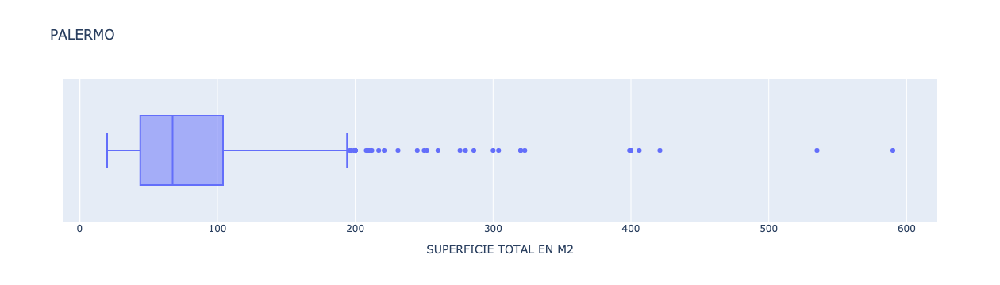

In [88]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='palermo',df['TIPO DE PROPIEDAD']=='apartment')],\
             x = "SUPERFICIE TOTAL EN M2", title='PALERMO')
fig.show()

In [89]:
palermo_index = df_apartamentos[df_apartamentos['PLACE NAME']=='palermo'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:25].index

df_apartamentos[df_apartamentos['PLACE NAME']=='palermo'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:25]


,SUPERFICIE TOTAL EN M2,title,description
41036,590.000,clay3100,oportunidad600frentealpolocon5cocheras:desarro...
54934,535.000,"ventadepartamentode5ambientescondependencias,2...","ventadepartamentode5ambientescondependencias,2..."
60764,421.000,latorremaslujosadepalermo!!!,leparcpalermoexclusivo!excelentedepartamentode...
83331,406.000,ventapalermo,"superficie:405,73m2características:excepcional..."
33322,400.000,ventapalermo,"superficie:369,86m2planta400,22m2propioscaract..."
70452,400.000,torredecategoria-frentealrosedal-espectacularv...,torrefrentealrosedalconespectacularvistaverdey...
43389,399.000,dellibertador1700,"magníficapropiedad,degrancategoría,enesquina,c..."
60618,323.000,departamentoenpalermo,vendido!leparcalcortacreoqueesodicetodounadela...
23740,320.000,avlibertadorykennedy,excelentedepartamentoconvistaaplazaslivingyesc...
54899,320.000,venta5ambientes,capitalbrokerspropiedades|o15-espectaculartrip...


In [90]:
df.loc[palermo_index[7],'TIPO DE PROPIEDAD']='duplex/triplex'

In [91]:
df.loc[palermo_index[-5],'TIPO DE PROPIEDAD']='duplex/triplex'

In [92]:
df.loc[palermo_index[-3],'TIPO DE PROPIEDAD']='duplex/triplex'

In [93]:
df.loc[palermo_index[-2],'TIPO DE PROPIEDAD']='duplex/triplex'

## Barrio Norte - Apartment

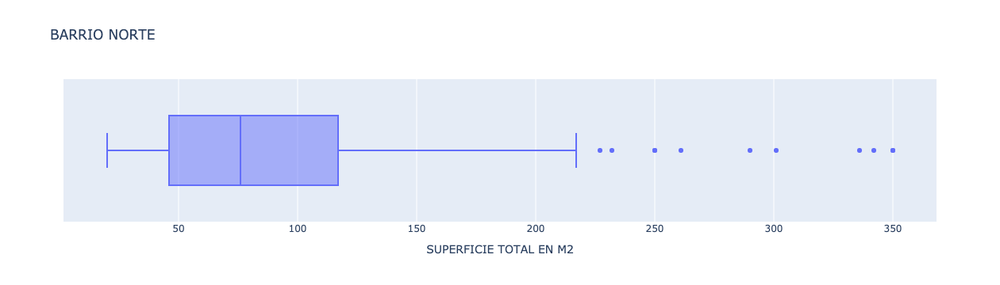

In [94]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='barrionorte',df['TIPO DE PROPIEDAD']=='apartment')],\
             x = "SUPERFICIE TOTAL EN M2", title='BARRIO NORTE')
fig.show()

In [95]:
barrionorte_index=df_apartamentos[df_apartamentos['PLACE NAME']=='barrionorte'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:9].index

df_apartamentos[df_apartamentos['PLACE NAME']=='barrionorte'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:9]


,SUPERFICIE TOTAL EN M2,title,description
12881,350.000,departamentoenventaubicadoenbarrionorte(iur036...,"edificioconstruidodegrancategoría,ubicadofrent..."
19107,350.000,excelentedeptoenrecoleta,ampliolivingycomedorendesnivelalfrenteconbalcn...
28643,342.000,torrelibedinsky-barrionorte-grandbourg-5ambc/d...,"excelentedepartamento,ubicadoenlazonamaselegan..."
44532,336.000,"edificiofariña,3suites2dep,3cocherasfijas",edificiodecategoría-construcciónfariña-excelen...
9703,301.000,suipachaesquinajuncal,torreenesquinaconvigilancialas24hspalierprivad...
66207,290.000,departamento-palermochico,"enexcelentetorreaisenson,granparquearboladoenp..."
31219,261.000,ventabarrionorte,"superficies:260,82,m2propia192,76m2cubierto68,..."
53780,250.000,departamentoenventa3dormitoriosconpatio-barrio...,"impecabledepartamentoenventa,tipocasa,conpatio..."
80710,250.000,departamentode4dormitoriosdegrancategoriamuylu...,barrionortearenales2200entreazcuenagayuriburu2...


In [96]:
df.loc[barrionorte_index[2],'TIPO DE PROPIEDAD']='piso/penthouse'

### Villa Crespo - Apartment

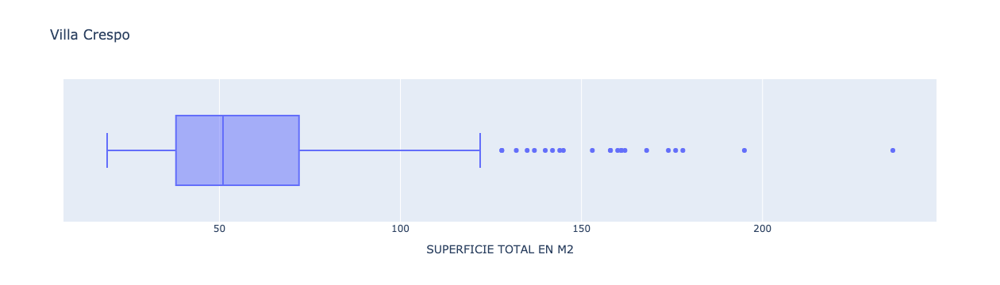

In [97]:
fig = px.box(df[np.logical_and(df['PLACE NAME']=='villacrespo',df['TIPO DE PROPIEDAD']=='apartment')],\
                 x = "SUPERFICIE TOTAL EN M2", title='Villa Crespo')
fig.show()

In [98]:
villacrespo_index=df_apartamentos[df_apartamentos['PLACE NAME']=='villacrespo'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:19].index


df_apartamentos[df_apartamentos['PLACE NAME']=='villacrespo'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:19]


,SUPERFICIE TOTAL EN M2,title,description
80130,236.000,"departamentodecategoría,alfrenteconbalcónsinex...","características:departamentodecategoría,4dormi..."
33287,195.000,departamentode4ambientesenventaenvillacrespo,"excelentesemipisode195mts2totales,muybienconse..."
63106,178.000,departamento-villacrespo,excelentedepartamento4ambientesaestrenarconbal...
22991,176.000,departamentoenventa,3ambientesenventaconjardin!!(76m2cubiertos+100...
42399,174.000,departamentoenventa,�excelentepisode4ambientescondependenciadeserv...
23168,168.000,departamentoenventa,"ventadedepartamento5ambientesenvillacrespo,cap..."
84000,162.000,departamento-villacrespo,unidadde3dormitoriosubicadaenel2dopisotresdorm...
20882,161.000,departamentode3ambientesenventaenvillacrespo,departamentotipocasade3ambientescondependencia...
80380,161.000,departamentoenventa,"pisode4ambientescondependenciaycocheras,envent..."
53097,160.000,departamento-villacrespo,"deptoenpalermoqueens,amtsdetodoslosautlets,imp..."


In [99]:
df.loc[villacrespo_index[8],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villacrespo_index[-7],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villacrespo_index[-3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villacrespo_index[-1],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villacrespo_index[-8],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villacrespo_index[-4],'TIPO DE PROPIEDAD']='ph'
df.loc[villacrespo_index[-5],'TIPO DE PROPIEDAD']='duplex/triplex'

### Puerto Madero - Apartment

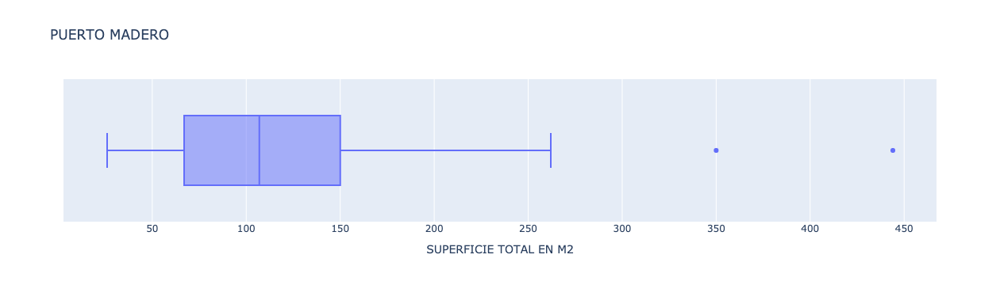

In [100]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='puertomadero'],\
                x = "SUPERFICIE TOTAL EN M2", title='PUERTO MADERO')
fig.show()

In [101]:
index_puertomadero=df_apartamentos[df_apartamentos['PLACE NAME']=='puertomadero'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2].index


df_apartamentos[df_apartamentos['PLACE NAME']=='puertomadero'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2]


,SUPERFICIE TOTAL EN M2,title,description
68126,444.000,puertomadero,-increíbledepartamentoendúplexen2plantasconter...
4348,350.000,"torreelfaro-impresionantevistaalrío,tigreypuer...",superluminosoysoleado-grancategoría-living/com...


In [102]:
df.loc[index_puertomadero[0],'TIPO DE PROPIEDAD']='duplex/triplex'

In [103]:
df.loc[index_puertomadero[1],'TIPO DE PROPIEDAD']='piso/penthouse'

### Nuñez - Apartment

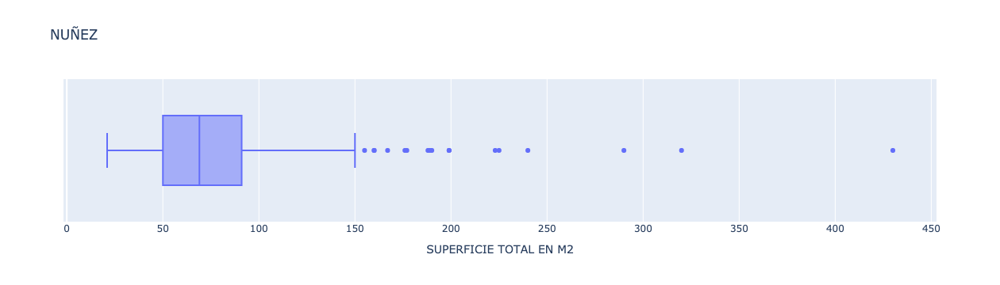

In [104]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='nuñez'],\
             x = "SUPERFICIE TOTAL EN M2", title='NUÑEZ')
fig.show()

In [105]:
nunez_index=df_apartamentos[df_apartamentos['PLACE NAME']=='nuñez'].\
                    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:14].index

df_apartamentos[df_apartamentos['PLACE NAME']=='nuñez'].\
                    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description','PRECIO USD']][:14]


,SUPERFICIE TOTAL EN M2,title,description,PRECIO USD
41996,430.000,departamentoenventa,"excelentedepartamentoenventa/forumalcorta,cata...",2490000.000
44870,320.000,forumalcorta,en320mts4dormitorios1ensuitedependenciadeservi...,2550000.000
52372,290.000,ventatorrechateauexcelenteesquineroconlamejorv...,esquineroaltoconlamejorvistadelatorretorrechat...,2500000.000
34672,240.000,casaenventa-caseros,codigo:3746-c20ubicadoen:jjdeurquiza3968-publi...,100000.000
41369,225.000,quantumbelliniesquinero3dormcondep,torredemaximacategoriaenobralasmedidassonaprox...,1250000.000
31587,223.000,avdellibertador7000-nuñez-capitalfederal,excelentedepartamentoenunadelastorresmasexclus...,1650000.000
4035,199.000,"avdellibertador7000,departamentoenventa,5ambie...",ubicacion:eledificioseencuentrasobreavdelliber...,625000.000
5963,199.000,"avdellibertador7000,departamentoenventa,4dormi...",ubicacion:eledificioseencuentrasobreavdelliber...,625000.000
83764,190.000,departamento-nuñez,casatotalmenterecicladaa2cdrasdecabildo!!lotep...,360000.000
83230,189.000,magnificodepartamentode4ambenavlibertador!!!,"sobreavlibertador,magnificoentorno,vistamuyver...",480000.000


In [106]:
df.loc[nunez_index[3],'TIPO DE PROPIEDAD']='house'
df=df.drop(nunez_index[6])
df.loc[nunez_index[8],'TIPO DE PROPIEDAD']='house'
df.loc[nunez_index[-5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[nunez_index[-4],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[nunez_index[-3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[nunez_index[-2],'TIPO DE PROPIEDAD']='duplex/triplex'
df.loc[nunez_index[-1],'TIPO DE PROPIEDAD']='duplex/triplex'

### Constitucion - Apartment

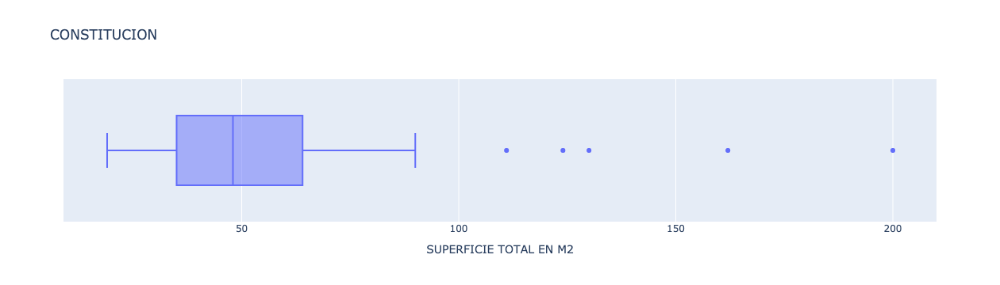

In [107]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='constitución'], x = "SUPERFICIE TOTAL EN M2", title='CONSTITUCION')
fig.show()

In [108]:
constitucion_index = df_apartamentos[df_apartamentos['PLACE NAME']=='constitución'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:5].index
df_apartamentos[df_apartamentos['PLACE NAME']=='constitución'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:5]


,SUPERFICIE TOTAL EN M2,title,description
8880,200.000,ventapisotipoph-de200m2-balcónalfrte-,ventadepisotipoph(1ºpiso)u$s249000“conexcelent...
65557,162.000,departamento/ph-4ambientes-constitución,ubicadosobrelacallecochabamba:entrelasdesaenzp...
78661,130.000,"departamento130m²5ambientesconwashing-room,cap...","departamento5ambientes,muyluminosolivingcomedo..."
8900,124.000,piso4ambientesenventasantiagodelestero1300esco...,amplioycómododepartamentode4ambientesensólidoe...
13292,111.000,departamentoliving/comedor3dormitorio(s)1toile...,"deepocaenmuybuenestadoexcelentevista,muchaluz ..."


In [109]:
df.loc[constitucion_index[0],'TIPO DE PROPIEDAD']='ph'
df.loc[constitucion_index[1],'TIPO DE PROPIEDAD']='ph'
df.loc[constitucion_index[3],'TIPO DE PROPIEDAD']='piso/penthouse'


### Colegiales - Apartment

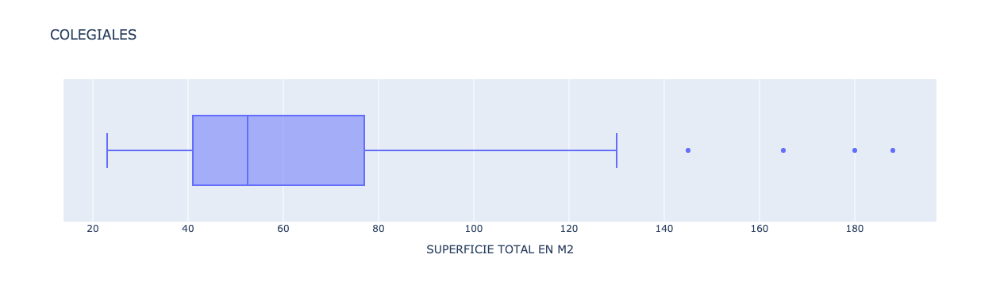

In [110]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='colegiales'],\
             x = "SUPERFICIE TOTAL EN M2", title='COLEGIALES')
fig.show()

In [111]:
colegiales_index =df_apartamentos[df_apartamentos['PLACE NAME']=='colegiales'].\
    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:4].index
df_apartamentos[df_apartamentos['PLACE NAME']=='colegiales'].\
    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:4]


,SUPERFICIE TOTAL EN M2,title,description
3545,188.000,departamentoenventa,excelenteoportunidaddecompradedepartamentotrip...
48073,180.000,palpa2855-pbopcionalcochera,"porsubuenayestratégicaubicación,palpa2855cuent..."
80361,165.000,departamentoenventa,pisotipocasa4ambientesfrenteycontrafrente165m2...
46304,145.000,departamentoenventa,"ventadedepartamento4ambientesencolegiales,capi..."


In [112]:
df.loc[colegiales_index[0],'TIPO DE PROPIEDAD']='duplex/triplex'
df.loc[colegiales_index[1],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[colegiales_index[2],'TIPO DE PROPIEDAD']='piso/penthouse'

### Almagro - Apartment

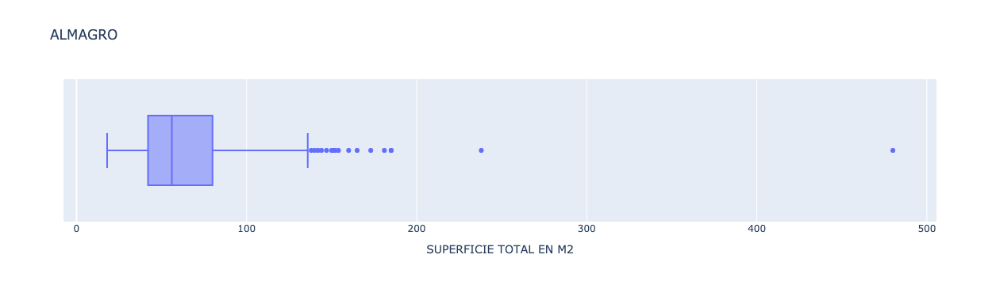

In [113]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='almagro'], x = "SUPERFICIE TOTAL EN M2", title='ALMAGRO')
fig.show()

In [114]:
almagro_index =df_apartamentos[df_apartamentos['PLACE NAME']=='almagro'].\
    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:13].index
df_apartamentos[df_apartamentos['PLACE NAME']=='almagro'].\
    sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:13]


,SUPERFICIE TOTAL EN M2,title,description
78711,480.000,aranguren100//muyluminoso,"casa5ambientes,muyluminosapb:livingcomedorcoci..."
28111,238.000,departamentoliving/comedor3dormitorio(s)1suite...,imperdibleterrazapropiaconsumyparrilladepartam...
20586,185.000,ventadepartamento4ambientesalmagro,unico!impecabledepartamentoconunpatiodecasi80m...
18801,185.000,*nuevoprecio*departamentoenventaenalmagro3ambi...,codigo:3410-178ubicadoen:rivadavia3500-publica...
43743,181.000,departamentode4ambientesenventaenalmagro,departamentode3ambientesc/dependenciaporescale...
63364,173.000,inmejorabledepto5ambc/depcocheraybaulera,inmejorabledepartamento5ambientesenduplexc/dep...
15826,165.000,departamentoenventa,semipisoalfrenteenalmagro!!!!165m2totalesxescr...
3952,160.000,departamentoenventa,"4ambientesconpatioyterrazaalfrente,enventa,ena..."
5763,154.000,granpiso5ambc/dependencia7ºpisoalfrente,"excelenteplanta154m2,5ambcondependenciadobleen..."
9092,152.000,departamentoenventa,hermososemipisodecategoriade4ambc/depyescritor...


In [115]:
df.loc[almagro_index[0],'TIPO DE PROPIEDAD']='house'
df.loc[almagro_index[4],'TIPO DE PROPIEDAD']='duplex/triplex'
df.loc[almagro_index[5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[almagro_index[-6],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[almagro_index[-5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[almagro_index[-4],'TIPO DE PROPIEDAD']='ph'
df.loc[almagro_index[-2],'TIPO DE PROPIEDAD']='piso/penthouse'

### Monserrat - Apartment

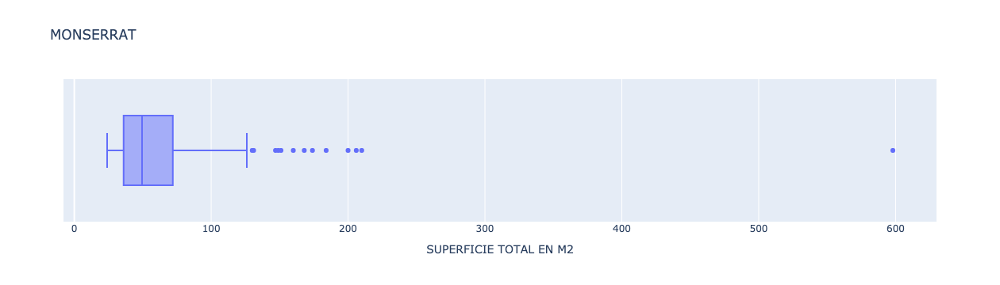

In [116]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='monserrat'], x = "SUPERFICIE TOTAL EN M2", title='MONSERRAT')
fig.show()

In [117]:
monserrat_index=df_apartamentos[df_apartamentos['PLACE NAME']=='monserrat'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:13].index

df_apartamentos[df_apartamentos['PLACE NAME']=='monserrat'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:13]

,SUPERFICIE TOTAL EN M2,title,description
34797,598.000,barrioprivado,"¿querésvivirrodeadodepaz,paisajesnaturalesyelm..."
78717,210.000,muyluminoso//sanjose400,"departamento5ambientes,muyluminosolivingcomedo..."
29437,206.000,departamentoenventa,"ventadedepartamento6ambientesenmonserrat,capit..."
33740,200.000,espectacularpisode5ambientesenmonserrat,sumacategamplioyluminosopisode5ambientesenmont...
38218,184.000,departamentoantiguoconcochera,"setratadeundepartamentoantiguo,reciclado,deamp..."
61536,174.000,departamento-monserrat,excelentesemipisode5ambientesalfrenteedificioa...
24727,168.000,hermosodepartamentoestiloracionalistaservicios...,"setratadeunapropiedaddeampliosambientes,conexc..."
32961,160.000,excelente5ambenedificioemblemático,avdemayo1400enelemblemáticoedificioconocidocom...
58837,151.000,departamento-monserrat,hermososemipisoenventaenelbarriodemonserratena...
63038,149.000,departamento/ph-5ambientes,excelenteubicacion!apasosdelaavbelgranoyametro...


In [118]:
df.loc[monserrat_index[0]].description

'¿querésvivirrodeadodepaz,paisajesnaturalesyelmayorconfot?elprimerbarrioprivadodelaciudaddebalcarce,seencuentraubicadoalpiedelasierralabarrosa,cercanoalautodromojuanmanuelfangio,unodelospuntosmásimpactantesencuantoaloqueofreceelpaisajeserranoypróximoalosdistintoscircuitosdeactividadesculturalesydeportivasdisfrutedetodaslascomodidadesdelclubhouse,conlanaturalezadefondolaseguridadqueofreceunbarrioprivado,yunimportanteentornonatural,hacenquepuedaolvidarsedesuspreocupacionesyrelajarsedeverdadconsulteporlotesdisponibleslotesde598m2a1000m2conlacompradeunlotesebonificalaescriturayademásseobsequiandosbicicletasdemountainbikeconsultas:(04168rocío'

Se trata de un anuncio que incluye el conjunto de 4 unidades dentro de su precio.

In [119]:
df = df.drop(monserrat_index[0])

In [120]:
df.loc[monserrat_index[3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[monserrat_index[5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[monserrat_index[-5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[monserrat_index[-4],'TIPO DE PROPIEDAD']='ph'
df.loc[monserrat_index[-3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[monserrat_index[-2],'TIPO DE PROPIEDAD']='piso/penthouse'

### Villa Luro - Apartment

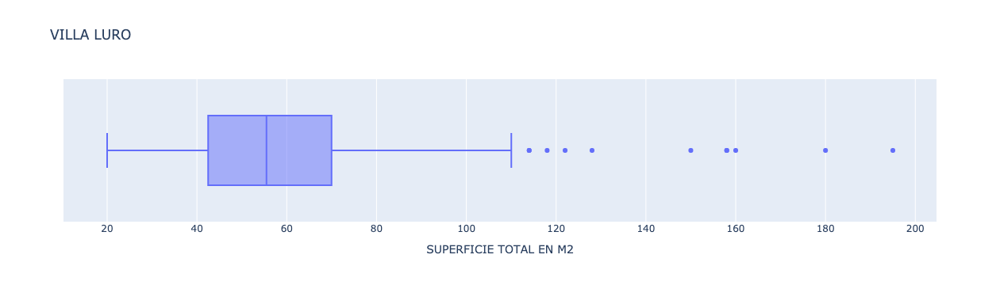

In [121]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='villaluro'], x = "SUPERFICIE TOTAL EN M2", title='VILLA LURO')
fig.show()

In [122]:
villaluro_index = df_apartamentos[df_apartamentos['PLACE NAME']=='villaluro'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:9].index
df_apartamentos[df_apartamentos['PLACE NAME']=='villaluro'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:9]


,SUPERFICIE TOTAL EN M2,title,description
72280,195.000,departamento-villaluro,ventadedepartamento3ambientesconterrazaubicado...
72274,180.000,departamento-villaluro,ventadedepartamento3ambientesconterrazaubicado...
72018,160.000,departamento-villaluro,ventadedepartamentotresambientesubicadoenlazon...
55806,158.000,"4ambientes,dosbaños,cocinaindependiente,terraz...",departamentoenventade4ambentercerpisoalfrentev...
55812,158.000,"4ambientes,2baños,cocinaindependiente,balcónat...",departamentoenventade4ambientesentercerpisoalf...
9375,150.000,departamentoenventa,"ventadedepartamento4ambientesenvillaluro,capit..."
60726,128.000,departamento-villaluro,excelentedepartamentode4ambientesconbalcón!liv...
60677,122.000,departamento-villaluro,excelentedepartamentode4ambientesconbalcónypat...
83402,118.000,casalotepropiode3ambientes,codigo:368-22ubicadoen:cesardiaz5241-publicado...


In [123]:
df.loc[villaluro_index[-1],'TIPO DE PROPIEDAD']='house'

### Villa Devoto - Apartment

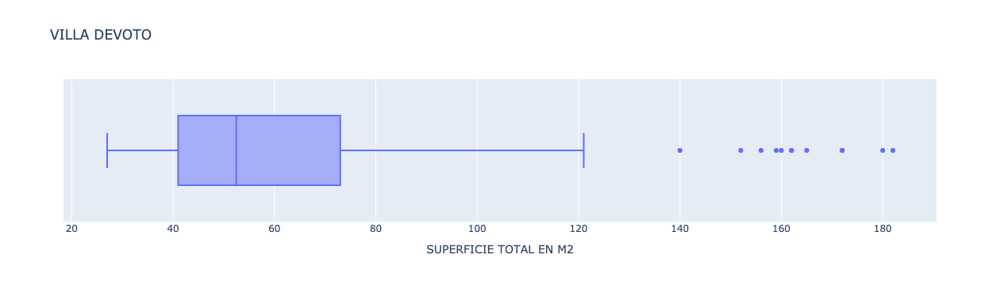

In [124]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='villadevoto'], x = "SUPERFICIE TOTAL EN M2", title='VILLA DEVOTO')
fig.show()

In [125]:
devoto_index =df_apartamentos[df_apartamentos['PLACE NAME']=='villadevoto'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:10].index
df_apartamentos[df_apartamentos['PLACE NAME']=='villadevoto'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:10]


,SUPERFICIE TOTAL EN M2,title,description
61570,182.000,piso4ambcocheradoble,pisodecategoria-enzonaresidencial-edificioenes...
81595,180.000,"semipiso4ambientes,cochera180m2","semipiso4ambientesalfrentereciclado,excelentee..."
71370,172.000,departamento-villadevoto,ventadedepartamento4ambientesenvilladevotoexce...
70968,172.000,departamentoenvilladevoto,ventadedepartamento4ambientesenvilladevotoexce...
60861,165.000,piso5ambc/depserv,"pisoenvilladevoto,a5cuadrasdelaplazaedificiode..."
70917,162.000,departamentoenvilladevoto,ventadedepartamento4ambientesenvilladevotoexce...
71350,162.000,departamento-villadevoto,ventadedepartamento4ambientesenvilladevotoexce...
37189,160.000,departamentoenventa,"ventadedepartamento3ambientesenvilladevoto,cap..."
53478,159.000,"hermosopiso5ambc/dep,dormsuiteyespguardacoche-...","imponentepisode5ambientescondependencia,conbau..."
15563,156.000,"departamento156m²concocheraencarril,salvadorma...","excelentesemipisoenedificiodecategoria,ubicado..."


In [126]:
df.loc[devoto_index[0],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[1],'TIPO DE PROPIEDAD']='piso/penthouse'
df = df.drop(devoto_index[2])
df.loc[devoto_index[3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[4],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[5],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[-4],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[-3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[-2],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[devoto_index[-1],'TIPO DE PROPIEDAD']='piso/penthouse'

### Palermo Chico - Apartment

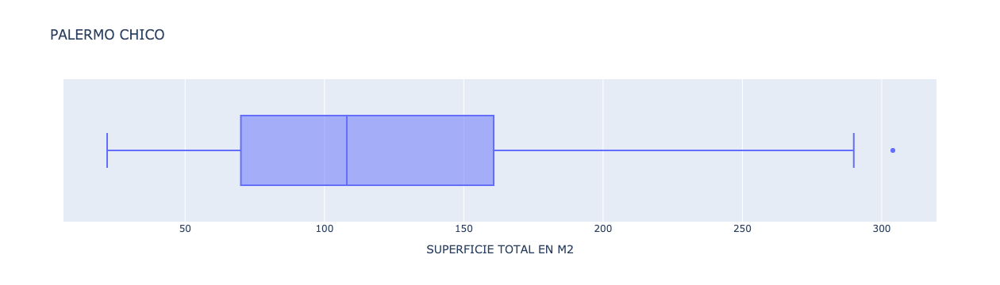

In [127]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='palermochico'], x = "SUPERFICIE TOTAL EN M2", title='PALERMO CHICO')
fig.show()

In [128]:
df_apartamentos[df_apartamentos['PLACE NAME']=='palermochico'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]


,SUPERFICIE TOTAL EN M2,title,description
14217,304.000,departamentoedificioedificiolanusselivingcomed...,departamentoedificioedificiolanusselivingcomed...


### Villa del Parque - Apartment

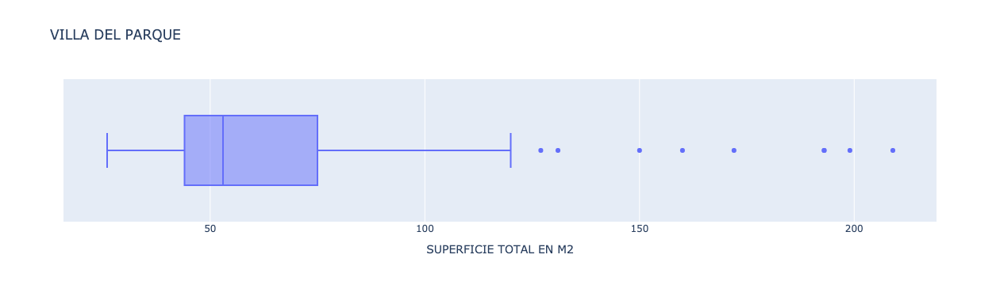

In [129]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='villadelparque'], x = "SUPERFICIE TOTAL EN M2", title='VILLA DEL PARQUE')
fig.show()

In [130]:
villadelparque_index = df_apartamentos[df_apartamentos['PLACE NAME']=='villadelparque']\
.sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:8].index
df_apartamentos[df_apartamentos['PLACE NAME']=='villadelparque']\
.sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:8]


,SUPERFICIE TOTAL EN M2,title,description
4776,209.000,departamentoenventa,"ventadetreiplexhermoso,alfrenteconentradaindep..."
80721,199.000,departamentos3dormitoriosc/dep,"###edifdoblefrente,seg24hscochimpecable!!!!###..."
49546,193.000,6ambientes193m2/cocheraybaulera,6ambientesconcocheraybauleraimportantepisodegr...
49557,193.000,pisode193m2cocheraybaulera,pisoconcocheraybauleraimportantepisodegrancate...
36951,172.000,departamentoenventa,ventaduplex4ambientes+dependencia+garage+fondo...
17490,160.000,departamentode4ambientesentresplantas,"entradaindependiente,haciaabajogarajeprivadocu..."
77866,150.000,"departamento-villadelparque,semipiso,4ambiente...",excelentesemipisode4ambientescon3balcónes2coch...
55914,131.000,departamento-villadelparque,departamentode3ambientesen1erpisoalfrenteconte...


In [131]:
df.loc[villadelparque_index[0],'TIPO DE PROPIEDAD']='duplex/triplex'
df.loc[villadelparque_index[2],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villadelparque_index[3],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[villadelparque_index[4],'TIPO DE PROPIEDAD']='duplex/triplex'
df.loc[villadelparque_index[-2],'TIPO DE PROPIEDAD']='piso/penthouse'

### Centro/Microcentro - Apartment

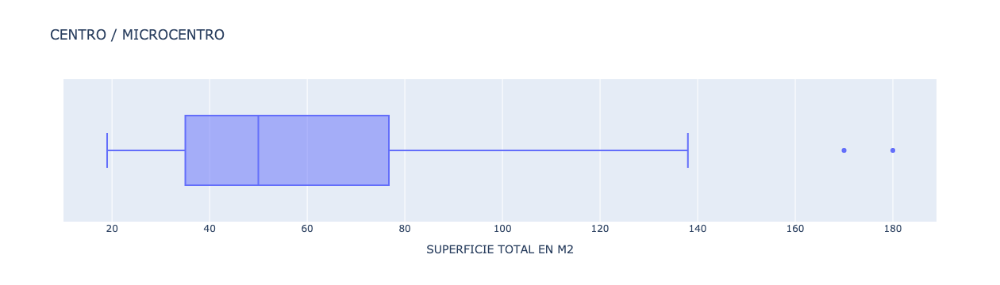

In [132]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='centro/microcentro'], x = "SUPERFICIE TOTAL EN M2", title='CENTRO / MICROCENTRO')
fig.show()

In [133]:
df_apartamentos[df_apartamentos['PLACE NAME']=='centro/microcentro'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2]


,SUPERFICIE TOTAL EN M2,title,description
11450,180.000,deptode9ambientescongalería,deptode9ambientescongaleríaalfrentecon156m2cub...
36545,170.000,"departamentoenventa,oportunidad,buenaubicación...",departamentoenmuybuenaubicaciónaptoparaviviend...


### Villa Lugano - Apartment

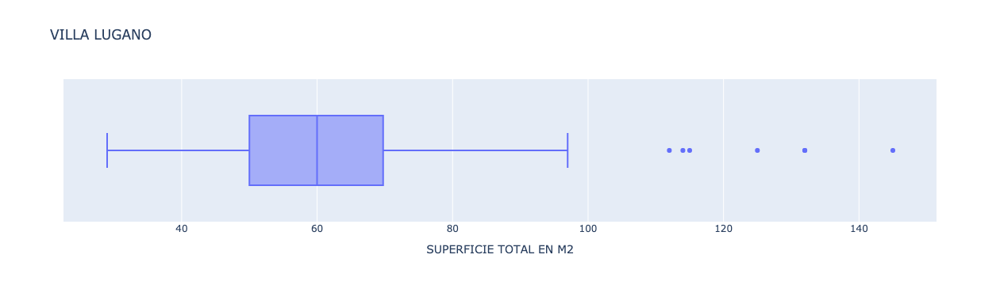

In [134]:
fig = px.box(df_apartamentos[df_apartamentos['PLACE NAME']=='villalugano'], x = "SUPERFICIE TOTAL EN M2", title='VILLA LUGANO')
fig.show()

In [135]:
lugano_index = df_apartamentos[df_apartamentos['PLACE NAME']=='villalugano']\
.sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:6].index
df_apartamentos[df_apartamentos['PLACE NAME']=='villalugano']\
.sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:6]


,SUPERFICIE TOTAL EN M2,title,description
45635,145.000,excelentepsosavriestra,excelentepisosobreavriestraycafayatelivingcome...
56242,132.000,semipisoespectacular3amb,semipisode4ambenelcomplejofranova!!!comosiesta...
56848,132.000,departamento-villalugano,ventasemipisode4ambientesenluganocapitalfedera...
79664,125.000,departamento-villalugano,"departamento125m²conpavimento,capitalfederal,v..."
19705,115.000,dpto4ambsinexpensasvriachueloaccininmobiliaria,"excelentedptode4ambcon3dorm,conplacard,livingc..."
55880,114.000,"3ambientescondosbaños,dosbalconesde114m2",hermososemipisode3ambenelcomplejofranovacomosi...


In [136]:
df.loc[lugano_index[0],'TIPO DE PROPIEDAD']='piso/penthouse'
df=df.drop(lugano_index[1])
df.loc[lugano_index[2],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[lugano_index[-1],'TIPO DE PROPIEDAD']='piso/penthouse'

Ahora, vamos a revisar con un describe los valores que nos quedaron 

In [137]:
df_departamentos_caba=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='apartment')]
df_departamentos_caba.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,1946.000,8480.000,4684.000,14484.000,12533.000,11570.000,14567.000,14494.000
mean,8.843,2.663,3025.255,69.405,74.292,2724.387,269036.465,203236.724
std,60.229,1.251,3094.053,134.502,45.496,1210.389,511811.556,189852.852
min,1.000,1.000,1.000,1.000,18.000,69.239,24300.000,5103.610
25%,2.000,2.000,1300.000,38.000,42.000,2073.171,102000.000,99000.000
50%,4.000,3.000,2025.000,54.000,60.000,2500.000,148687.000,143044.965
75%,7.000,4.000,3600.000,82.000,91.000,3056.746,250000.000,235000.000
max,2103.000,15.000,54240.000,9152.000,590.000,40720.406,14756597.000,3000000.000


In [138]:
#Lo minimo de un departamento son 27m2.
sup_min_mal_cargada=df_departamentos_caba[np.logical_or(df_departamentos_caba['SUPERFICIE CUBIERTA EN M2']<27,df_departamentos_caba['SUPERFICIE TOTAL EN M2']<27)].index
df_departamentos_caba[np.logical_or(df_departamentos_caba['SUPERFICIE CUBIERTA EN M2']<27,df_departamentos_caba['SUPERFICIE TOTAL EN M2']<27)]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
880,sell,apartment,recoleta,|argentina|capitalfederal|recoleta|,argentina,capitalfederal,3429595.000,"-345940974,-583911079",-34.594,-58.391,95000.000,usd,1676227.500,95000.000,40.000,25.000,2375.000,3800.000,NaN,1.000,NaN,http://wwwproperaticomar/15hg1_venta_departame...,"monoambienteconterrazaenexcelenteubicacion,muy...",juncal16001°d,https://thumbs4properaticom/9/jp9zu0omiighhytc...,recoleta,25.000,40.000,2375.000,95000.000,usd,95000.000,apartment
1285,sell,apartment,almagro,|argentina|capitalfederal|almagro|,argentina,capitalfederal,3436397.000,"-3460596848,-5842522812",-34.606,-58.425,NaN,NaN,NaN,NaN,22.000,NaN,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/15jf7_venta_departame...,excelentemonoambienteaptoprofesionalidealconsu...,u$d70000-departamentoenventa-perón4151,https://thumbs4properaticom/6/ldcfsobcvoxiy4o5...,almagro,NaN,22.000,NaN,NaN,NaN,NaN,apartment
1644,sell,apartment,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-3454615402,-5846242142",-34.546,-58.462,NaN,NaN,NaN,NaN,26.000,26.000,NaN,NaN,NaN,1.000,NaN,http://wwwproperaticomar/15k3s_venta_departame...,"segundopisoporescaleracocinaconbarradivisoria,...",u$d72000-departamentoenventa-3defebrero3567,https://thumbs4properaticom/5/ebrv7k3ka7vbttjr...,belgrano,26.000,26.000,NaN,NaN,NaN,NaN,apartment
2001,sell,apartment,sannicolás,|argentina|capitalfederal|sannicolás|,argentina,capitalfederal,6693229.000,"-3460410309,-5838792801",-34.604,-58.388,NaN,NaN,NaN,NaN,23.000,23.000,NaN,NaN,NaN,1.000,NaN,http://wwwproperaticomar/15klg_venta_departame...,1ambientecocinaindependientecompletapisosderob...,u$d53000-departamentoenventa-corrientesyparaná0,https://thumbs4properaticom/6/ged5rigseszvnf1e...,sannicolás,23.000,23.000,NaN,NaN,NaN,NaN,apartment
2104,sell,apartment,montecastro,|argentina|capitalfederal|montecastro|,argentina,capitalfederal,3430596.000,"-3462152481,-5850676727",-34.622,-58.507,NaN,NaN,NaN,NaN,30.000,26.000,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/15kqv_venta_departame...,"-edificioaestrenar-livingcomedor,concocinainco...",u$d69900-departamentoenventa-alcaraz5000,https://thumbs4properaticom/5/wujut5oq2_90c8zs...,montecastro,26.000,30.000,NaN,NaN,NaN,NaN,apartment
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85184,sell,apartment,recoleta,|argentina|capitalfederal|recoleta|,argentina,capitalfederal,3429595.000,"-345950543,-58392032",-34.595,-58.392,83000.000,usd,1464493.500,83000.000,34.000,22.000,2441.176,3772.727,NaN,1.000,NaN,http://wwwproperaticomar/1ch3w_venta_departame...,"ambientepisoaltounpisoporescalera,elascensorll...",rodríguezpeña1100-ambientemuyluminoso,https://thumbs4properaticom/0/hwgpxrbivd6dn9yr...,recoleta,22.000,34.000,2441.176,83000.000,usd,83000.000,apartment
85540,sell,apartment,santelmo,|argentina|capitalfederal|santelmo|,argentina,capitalfederal,3428113.000,NaN,NaN,NaN,1252600.000,ars,1239533.350,70250.410,30.000,26.000,2341.680,48176.923,NaN,NaN,NaN,http://wwwproperaticomar/1chqi_venta_departame...,"departamento30m²,capitalfederal,santelmo,por$1...",departamento-santelmo,https://thumbs4properaticom/5/a2dzjuh70gsx0yin...,santelmo,26.000,30.000,2341.680,1252600.000,ars,70250.410,apartment
85542,sell,apartment,santelmo,|argentina|capitalfederal|santelmo|,argentina,capitalfederal,3428113.000,NaN,NaN,NaN,1278000.000,ars,1264668.300,71674.930,30.000,26.000,2389.164,49153.846,NaN,NaN,NaN,http://wwwproperaticomar/1chqk_venta_departame...,"departamento30m²,capitalfederal,santelmo,por$1...

In [139]:
df = df.drop(sup_min_mal_cargada)

In [140]:
df_departamentos_caba.sort_values('SUPERFICIE CUBIERTA EN M2',ascending=False)[:10]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
42431,sell,apartment,montecastro,|argentina|capitalfederal|montecastro|,argentina,capitalfederal,3430596.000,"-34618411,-58497949",-34.618,-58.498,138000.000,usd,2434941.000,138000.000,NaN,9152.000,NaN,15.079,3.000,4.000,NaN,http://wwwproperaticomar/19r6g_venta_departame...,corredorresponsable:unobienesraicessrl-cucicba...,excelentedeptode4ambienesmuyluminoso,https://thumbs4properaticom/3/9cbq2o2xogfyup32...,montecastro,9152.000,NaN,NaN,138000.000,usd,138000.000,apartment
48391,sell,apartment,palermo,|argentina|capitalfederal|palermo|,argentina,capitalfederal,3430234.000,"-34588259,-58409503",-34.588,-58.410,220000.000,usd,3881790.000,220000.000,NaN,7029.000,NaN,31.299,6.000,4.000,NaN,http://wwwproperaticomar/1aa1j_venta_departame...,corredorresponsable:cristianarnalponti-cucicba...,4ambientesfrentealaltopalermoc/osinmuebles,https://thumbs4properaticom/6/gbchroems94d8pwt...,palermo,7029.000,NaN,NaN,220000.000,usd,220000.000,apartment
78104,sell,apartment,floresta,|argentina|capitalfederal|floresta|,argentina,capitalfederal,3433910.000,"-346317378902,-584794281617",-34.632,-58.479,108000.000,usd,1905606.000,108000.000,NaN,6534.000,NaN,16.529,5.000,4.000,NaN,http://wwwproperaticomar/1c2kh_venta_departame...,corredorresponsable:hernanperrone-cucicba2792c...,departamento4ambientescocinaseparadamuchaluz,https://thumbs4properaticom/2/0zhir2ib1oz4mtry...,floresta,6534.000,NaN,NaN,108000.000,usd,108000.000,apartment
81286,sell,apartment,flores,|argentina|capitalfederal|flores|,argentina,capitalfederal,3433918.000,"-34630699,-58472579",-34.631,-58.473,129000.000,usd,2276140.500,129000.000,NaN,6062.000,NaN,21.280,8.000,2.000,NaN,http://wwwproperaticomar/1c9im_venta_departame...,corredorresponsable:ramiroelkadi-cucicba6534co...,dpto2ambientesconampliobalcóncorrido,https://thumbs4properaticom/4/bhj1uheycs4exfvb...,flores,6062.000,NaN,NaN,129000.000,usd,129000.000,apartment
83529,sell,apartment,congreso,|argentina|capitalfederal|congreso|,argentina,capitalfederal,3435259.000,"-34609821,-58392606",-34.610,-58.393,72000.000,usd,1270404.000,72000.000,NaN,3896.000,NaN,18.480,2.000,2.000,NaN,http://wwwproperaticomar/1cdao_venta_departame...,corredorresponsable:flaviaaguirre-cucicba471co...,congreso2ambientesexcelenteubicacion!!,https://thumbs4properaticom/9/mfflulevji6elrzs...,congreso,3896.000,NaN,NaN,72000.000,usd,72000.000,apartment
21144,sell,apartment,balvanera,|argentina|capitalfederal|balvanera|,argentina,capitalfederal,6693228.000,"-34616907,-58405224",-34.617,-58.405,89000.000,usd,1570360.500,89000.000,NaN,3834.000,NaN,23.213,NaN,1.000,NaN,http://wwwproperaticomar/17wou_venta_departame...,corredorresponsable:arielchampanier-cucicba433...,monoambientesuperluminoso!,https://thumbs4properaticom/3/-9ig5lcr3vunubv3...,balvanera,3834.000,NaN,NaN,89000.000,usd,89000.000,apartment
41036,sell,apartment,palermo,|argentina|capitalfederal|palermo|,argentina,capitalfederal,3430234.000,"-345724752,-584284225",-34.572,-58.428,1200000.000,usd,21173400.000,1200000.000,590.000,590.000,2033.898,2033.898,NaN,15.000,NaN,http://wwwproperaticomar/19nud_venta_departame...,oportunidad600frentealpolocon5cocheras:desarro...,clay3100,https://thumbs4properaticom/4/-lex0ykvw4xldjkr...,palermo,590.000,590.000,2033.898,1200000.000,usd,1200000.000,apartment
30106,sell,apartment,retiro,|argentina|capitalfederal|retiro|,argentina,capitalfederal,3429576.000,"-345951586,-583785295",-34.595,-58.379,1500000.000,usd,26466750.000,1500000.000,500.000,500.000,3000.000,3000.000,NaN,5.000,NaN,http://wwwproperaticomar/18r6s_venta_departame...,hallamplioliv

In [141]:
#Segun zonaprop, la maxima dimension de un departamento es de 750m2
sup_max_mal_cargada=df_departamentos_caba[df_departamentos_caba['SUPERFICIE CUBIERTA EN M2'] > 750].index 

In [142]:
df = df.drop(sup_max_mal_cargada)

In [143]:
#Vamos a dropear todo piso superior al 56, medida de Alvear Tower, la torre mas alta de caba.
piso_mal_cargado=df[df['floor'] > 56].index
df.sort_values('floor',ascending=False)[:20]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
29346,sell,house,nogoyá,|argentina|entreríos|nogoyá|,argentina,entreríos,3430412.000,"-323977301,-597901354",-32.398,-59.790,NaN,NaN,NaN,NaN,276.000,167.000,NaN,NaN,3150.000,5.000,NaN,http://wwwproperaticomar/18o8m_venta_casa_nogo...,ampliacasaconlocalenplenocentroaunacuadradepla...,casaenventa,https://thumbs4properaticom/5/03iwlqtkvn9oygc_...,nogoyá,167.000,276.000,NaN,NaN,NaN,NaN,house
45577,sell,house,villarosa,|argentina|bsasgbazonanorte|pilar|villarosa|,argentina,bsasgbazonanorte,3427377.000,"-34411636,-58843031",-34.412,-58.843,690000.000,usd,12174705.000,690000.000,NaN,508.000,NaN,1358.268,2177.000,5.000,NaN,http://wwwproperaticomar/19zbi_venta_casa_vill...,corredorresponsable:unobienesraicessrl-cmcpsi5...,ventacasalapraderapilar,https://thumbs4properaticom/9/u7vsfygtfm7_ht81...,villarosa,508.000,NaN,NaN,690000.000,usd,690000.000,house
47727,sell,apartment,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-34574659,-58473337",-34.575,-58.473,390000.000,usd,6881355.000,390000.000,NaN,133.000,NaN,2932.331,2103.000,4.000,NaN,http://wwwproperaticomar/1a8gs_venta_departame...,corredorresponsable:gustavoguastello-cucicba86...,"departamentode4ambc/depcia,cocheraybaulera",https://thumbs4properaticom/9/yz8zgvb96capndxx...,belgrano,133.000,NaN,NaN,390000.000,usd,390000.000,apartment
4443,sell,apartment,tigre,|argentina|bsasgbazonanorte|tigre|,argentina,bsasgbazonanorte,3427753.000,"-34433301,-58586118",-34.433,-58.586,170960.000,usd,3016503.720,170960.000,NaN,73.000,NaN,2341.918,1609.000,4.000,NaN,http://wwwproperaticomar/15sf4_venta_departame...,corredorresponsable:mauromarvisi-cmcpsi5574con...,nuevoriversidepre-lanzamiento,https://thumbs4properaticom/5/m1u4-q9uculq8ttf...,tigre,73.000,NaN,NaN,170960.000,usd,170960.000,apartment
21123,sell,apartment,tigre,|argentina|bsasgbazonanorte|tigre|tigre|,argentina,bsasgbazonanorte,NaN,"-34433301,-58586118",-34.433,-58.586,171000.000,usd,3017209.500,171000.000,NaN,73.000,NaN,2342.466,1609.000,4.000,NaN,http://wwwproperaticomar/17wj2_venta_departame...,corredorresponsable:mauromarvisi-cmcpsi5574con...,nuevoriversidepre-lanzamiento,https://thumbs4properaticom/5/m1u4-q9uculq8ttf...,tigre,73.000,NaN,NaN,171000.000,usd,171000.000,apartment
23576,sell,apartment,tigre,|argentina|bsasgbazonanorte|tigre|tigre|,argentina,bsasgbazonanorte,NaN,"-34433301,-58586118",-34.433,-58.586,177800.000,usd,3137192.100,177800.000,NaN,73.000,NaN,2435.616,1609.000,4.000,NaN,http://wwwproperaticomar/185je_venta_departame...,corredorresponsable:mauromarvisi-cmcpsi5574con...,nuevoriversidepre-lanzamiento,https://thumbs4properaticom/5/m1u4-q9uculq8ttf...,tigre,73.000,NaN,NaN,177800.000,usd,177800.000,apartment
21116,sell,apartment,tigre,|argentina|bsasgbazonanorte|tigre|tigre|,argentina,bsasgbazonanorte,NaN,"-34433301,-58586118",-34.433,-58.586,148400.000,usd,2618443.800,148400.000,NaN,61.000,NaN,2432.787,1608.000,3.000,NaN,http://wwwproperaticomar/17wik_venta_departame...,corredorresponsable:mauromarvisi-cmcpsi5574con...,nuevoriversidepre-lanzamiento,https://thumbs4properaticom/9/wvbfudfh1r2ddc9s...,tigre,61.000,NaN,NaN,148400.000,usd,148400.000,apartment
4440,sell,apartment,tigre,|argentina|bsasgbazonanorte|tigre|tigre|,argentina,bsasgbazonanorte,NaN,"-34433301,-58586118",-34.433,-58.586,142700.000,usd,2517870.150,142700.000,NaN,61.000,NaN,2339.344,1608.000,3.000,NaN,http://wwwproperaticomar/15sf0_venta_departame...,corredorresponsable:mauromarvisi-cmcpsi5574con...,nuevoriversidepre-lanzamiento,https://thumbs4properaticom/9/wvbfudfh1r2ddc9s...,tigre,61.000,Na

In [144]:
df = df.drop(piso_mal_cargado)

In [145]:
precio_usd_m2_mal_cargado=df_departamentos_caba.sort_values('PRECIO USD POR M2',ascending=False)[:20]\
                        [['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','PLACE NAME','title','description']].index

df_departamentos_caba.sort_values('PRECIO USD POR M2',ascending=False)[:20]\
                                [['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','PLACE NAME','rooms','title','description']]

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,PLACE NAME,rooms,title,description
42198,40720.406,2809708.000,69.000,flores,NaN,departamentoenventa,"ventadedepartamento3ambientesenflores,capitalf..."
42199,39899.595,1476285.000,37.000,flores,NaN,departamentoenventa,"ventadedepartamento3ambientesenflores,capitalf..."
19199,31250.000,1250000.000,40.000,centro/microcentro,2.000,excelente2ambftec/cocherafijaaptoprof,excelente2ambfteexcelentevistaverdehallentrada...
19209,17021.277,800000.000,47.000,villadevoto,1.000,monoambientes,publicadoporramospropiedadesatravesinmomap
19540,16666.667,800000.000,48.000,mataderos,3.000,dueovendedto3ambencapital,publicadopormarcelorealatravesinmomap
19095,13881.818,610800.000,44.000,nuñez,1.000,espectacularvistaalriopiso12-posesininmediata,ambientesampliosdivisiblesdesde41m2a45m2conbal...
78265,13066.667,980000.000,75.000,balvanera,2.000,departamentoventa,espectaculardepartamentode2ambientesgrandes(45...
19208,12842.105,732000.000,57.000,caballito,2.000,departamentoaestrenar,*puertasinterioresdeambientesconmarcodechapayh...
75249,12083.333,2900000.000,240.000,belgrano,NaN,departamento-belgrano,"departamento240m²concloaca,capitalfederal,belg..."
19115,11812.500,472500.000,40.000,villaurquiza,1.000,monoambienteaestrenar!!!fteconbalcon!,publicadoporruizatravesinmomap


Es un poco ilogico los primeros 3 valores donde departamentos de 2/3 ambientes en flores o microcentro, tengan esos precios usd por m2

De zonaprop, vemos que un monoambiente en VillaDevoto, lo mas caro que esta es de usd 330.000, y para mataderos 150.000usd, un monoambiente en nunez cuesta 7800 usd/m2, lo mismo para balvanera y caballito, los precios son inferiores de mercado, estan mal cargados.

De zonaprop, un departamento de las mismas dimensiones en belgrano, maximo cuesta us 1.500.000, lo mismo para villaurquiza, el precio es demasiado elevado.

El valor de la propiedad en Recoleta, segun zonaprop, esta en 430.000 usd

In [146]:
df = df.drop(precio_usd_m2_mal_cargado[:11])

In [147]:
index_ambientes_derpartamento=df_departamentos_caba.sort_values('rooms',ascending=False)[:20].index

df_departamentos_caba.sort_values('rooms',ascending=False)[:20]\
                                [['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','PLACE NAME','rooms','title','description']]

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,PLACE NAME,rooms,title,description
41036,2033.898,1200000.000,590.000,palermo,15.000,clay3100,oportunidad600frentealpolocon5cocheras:desarro...
8881,1245.000,249000.000,200.000,santelmo,12.000,pisode200m2-carloscalvoal800-santelmo-,ventadepisotipoph(1ºpiso)u$s249000“conexcelent...
4405,NaN,225000.000,NaN,monserrat,9.000,semipiso8habitaciones-monserratoportunidad!!,corredorresponsable:mariacristinabarrionuevo-c...
11450,1166.667,210000.000,180.000,centro/microcentro,9.000,deptode9ambientescongalería,deptode9ambientescongaleríaalfrentecon156m2cub...
11452,1166.667,210000.000,180.000,congreso,9.000,deptode9ambientescongalería,deptode9ambientescongaleríaalfrentecon156m2cub...
11451,1166.667,210000.000,180.000,sannicolás,9.000,deptode9ambientescongalería,deptode9ambientescongaleríaalfrentecon156m2cub...
31219,1992.337,520000.000,261.000,barrionorte,8.000,ventabarrionorte,"superficies:260,82,m2propia192,76m2cubierto68,..."
24974,NaN,NaN,400.000,belgrano,8.000,belgranoexcelentedepartamentoenventade8ambientes,excelentedepartamentoenventaentorredecategoría...
33611,NaN,NaN,NaN,retiro,8.000,pisoenedificioestílofrancésrecicladoanuevo,corredorresponsable:luisvarela-csi5527/cucicba...
14217,6085.526,1850000.000,304.000,palermochico,8.000,departamentoedificioedificiolanusselivingcomed...,departamentoedificioedificiolanusselivingcomed...


In [148]:
df.loc[index_ambientes_derpartamento[1],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[index_ambientes_derpartamento[2],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[index_ambientes_derpartamento[8],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[index_ambientes_derpartamento[16],'TIPO DE PROPIEDAD']='piso/penthouse'
df.loc[62909,'TIPO DE PROPIEDAD']='ph'

## House

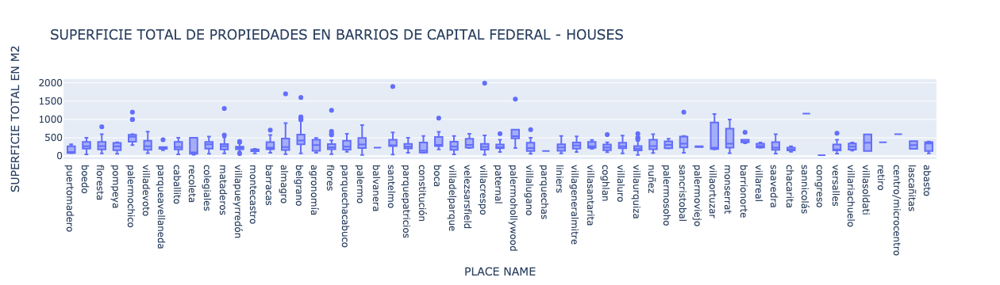

In [149]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='house')],\
             y = "SUPERFICIE TOTAL EN M2", x='PLACE NAME', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - HOUSES')
fig.show()

In [150]:
df_house = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='house')]


### Floresta - house

In [151]:
floresta_index = df_house[df_house['PLACE NAME']=='floresta'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1].index

df_house[df_house['PLACE NAME']=='floresta'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]

,SUPERFICIE TOTAL EN M2,title,description
28921,800.000,ventacasaenrumenco4amb,hermosacasaenventaenelexclusivobarrioderumenco...


In [152]:
df.loc[floresta_index,'SUPERFICIE TOTAL EN M2']=240

### Palermochico - house

In [153]:
palermochico_index = df_house[df_house['PLACE NAME']=='palermochico'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:3].index
df_house[df_house['PLACE NAME']=='palermochico'].\
sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:3]


,SUPERFICIE TOTAL EN M2,title,description
53791,1200.000,casa-palermochico,excepcionalcasaenventaenbarrioparqueexcepciona...
10535,1000.000,casaestilofrances,importantecasadeestilofrancés-jardínconpiletad...
34570,1000.000,imponentecasaenbarrioparque!!!,importanteresidenciaubicadaenbarrioparquelapro...


Se tratan de casos particulares de casas de muy alto nivel, vamos a dropearlas, ya que no son comunes.

In [154]:
df = df.drop(palermochico_index)

### Parque Avellaneda - house

In [155]:
df[df['PLACE NAME']=='parqueavellaneda'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]

,SUPERFICIE TOTAL EN M2,title,description
37253,447.000,casaenventa,"ventadecasa7ambientesomasenparqueavellaneda,ca..."


### Villa Pueyrredon - house

In [156]:
pueyrredon_index_max=df_house[df_house['PLACE NAME']=='villapueyrredón'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2].index

pueyrredon_index_min = pueyrredon_index_max=df_house[df_house['PLACE NAME']=='villapueyrredón'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2')[['SUPERFICIE TOTAL EN M2','title','description']][:40].index


# df[df['PLACE NAME']=='villapueyrredón'].\
#                 sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2]

df_house[df_house['PLACE NAME']=='villapueyrredón'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2')[['SUPERFICIE TOTAL EN M2','title','description']][:1]


,SUPERFICIE TOTAL EN M2,title,description
15847,70.000,casaenventa,ventadecasatipotriplex3ambientesenvillapueyrre...


In [157]:
#No queda claro si es un departamento, o una casa, o ambos.
df = df.drop(pueyrredon_index_max[0])
df.loc[pueyrredon_index_min[0],'TIPO DE PROPIEDAD']='duplex/triplex'

### Barracas - house

In [158]:
barracas_index = df_house[df_house['PLACE NAME']=='barracas'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:2].index
df_house[df_house['PLACE NAME']=='barracas'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description','TIPO DE PROPIEDAD']][:2]

,SUPERFICIE TOTAL EN M2,title,description,TIPO DE PROPIEDAD
5508,710.000,excelenteedificioenblock::idealinversiónparasu...,"excelenteedificioenblockconstituidopor4deptos,...",house
7472,580.000,avregimientosdepatriicios::casade5ambconlocald...,casaenventayalquilerde580m2enlaplantabajaposee...,house


Ambos son casos especiales, uno es un edificio, y el otro es una casa que tambien tiene un local

In [159]:
df = df.drop(barracas_index)

### Almagro - house

In [160]:
almagro_index=df_house[df_house['PLACE NAME']=='almagro'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1].index

df_house[df_house['PLACE NAME']=='almagro'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]

,SUPERFICIE TOTAL EN M2,title,description
13706,1700.000,casaenventa,"ventadecasa8ambientesenalmagro,capitalfederall..."


tiene problemas de papeles esta propiedad

In [161]:
df = df.drop(almagro_index[0])

### Belgrano - house


In [162]:
belgrano_index = df_house[df_house['PLACE NAME']=='belgrano'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:3].index
df_house[df_house['PLACE NAME']=='belgrano'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:3]

,SUPERFICIE TOTAL EN M2,title,description
22297,1600.000,11deseptiembre1500,"excelentecasadeestilo,absolutamenterefaccionad..."
34059,1070.000,virreydelpino3500,"casainglesaestilotudor,deprincipiosde1900compl..."
10547,1050.000,impactantecasaestiloinglés,impactantecasaestiloingléseninmejorableubicaci...


In [163]:
df.loc[belgrano_index[1],'SUPERFICIE TOTAL EN M2']=870

### Flores - house


In [164]:
flores_index = df_house[df_house['PLACE NAME']=='flores'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:4].index
df_house[df_house['PLACE NAME']=='flores'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:4]

,SUPERFICIE TOTAL EN M2,title,description
58305,1251.000,casa-flores,"ventaexcelentecasa7ambientespb:estarcomedor,co..."
9404,676.000,casaenventa,ventadecasa6ambientesenfloresmagnificaresidenc...
42215,610.000,casaenventa,"ventadecasa3ambientescontallerenflores,capital..."
7836,580.000,sevendecasadecategoríade580m2cubiertoscondepar...,sevendeesplendidacasaenfloressobrelacalledolor...


In [165]:
#La casa tambien incluye un departamento dentro
df = df.drop(flores_index[3])

### Don Bosco - house

In [166]:
donbosco_index = df_house[df_house['PLACE NAME']=='donbosco'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1].index

df_house[df_house['PLACE NAME']=='donbosco'].\
                sort_values(by = 'SUPERFICIE TOTAL EN M2',ascending=False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]


,SUPERFICIE TOTAL EN M2,title,description


In [167]:
df.loc[donbosco_index,'SUPERFICIE TOTAL EN M2']=1246

### San Telmo - house

In [168]:
otl_santelmo=df_house[df_house['PLACE NAME']=='santelmo'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:2]


otl_santelmo_min=df_house[df_house['PLACE NAME']=='santelmo'].\
sort_values('SUPERFICIE TOTAL EN M2')[['SUPERFICIE TOTAL EN M2','title','description']][:2]
otl_santelmo_min

,SUPERFICIE TOTAL EN M2,title,description
2839,45.000,u$d78000-tipocasaphenventa-peru1200,"còmodoph,2ambientes-bajasexpensas-cercanoahist..."
41357,167.000,casaenterrenopropioconlocalcomercialygarage,"casaconlocal,garage,terrazaaccesiblebañocomple..."


Es un caso muy particular de propiedad, vamos a dropearlo

In [169]:
df = df.drop(otl_santelmo.index[0])

In [170]:
df.loc[otl_santelmo_min.index[0],'TIPO DE PROPIEDAD']='ph'

### Boca - house

In [171]:
otl_boca=df_house[df_house['PLACE NAME']=='boca'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_boca

,SUPERFICIE TOTAL EN M2,title,description
41641,1038.000,casaantiguasobrelotepropio,"amtsdelaavalmirantebrownydepedrodemendoza,seen..."


In [172]:
#Tiene varios locales esta propiedad

df= df.drop(otl_boca.index)

### Villa del Parque - house

In [173]:
otl_villadelparque=df_house[df_house['PLACE NAME']=='villadelparque'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_villadelparque

,SUPERFICIE TOTAL EN M2,title,description
5092,552.000,excelentecasade408metroscub5dormitoriosusosmul...,"casasobrelotede866x37,de5dormitorios4baños,con..."


### Mataderos - house

In [174]:
otl_mataderos=df_house[df_house['PLACE NAME']=='mataderos'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:2]
otl_mataderos

,SUPERFICIE TOTAL EN M2,title,description
84114,1300.000,casa-mataderos,importanteresidenciade1300m2totalessobrelotede...
74344,575.000,casa-mataderos,ventacasaenmataderos3ambientescongarajecasasob...


In [175]:
#El primer caso es muy raro, vamos a dropearlo.
df = df.drop(otl_mataderos.index[0])

### Villa Crespo - house

In [176]:
otl_crespo=df_house[df_house['PLACE NAME']=='villacrespo'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_crespo

,SUPERFICIE TOTAL EN M2,title,description
14226,1991.000,casade5ambientesenventaenvillacrespo,excelentepropiedaddoblefrentecasacongalponde60...


In [177]:
df.loc[otl_crespo.index,'SUPERFICIE TOTAL EN M2']=495

### Paternal - house

In [178]:
otl_paternal=df_house[df_house['PLACE NAME']=='paternal'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_paternal

,SUPERFICIE TOTAL EN M2,title,description
11130,612.000,casade4ambientesenventaenpaternal,"excelenteloteparaedificar,salen1636metrosvendi..."


In [179]:
df = df.drop(otl_paternal.index[0])

### Villa lugano - house

In [180]:
otl_lugano=df_house[df_house['PLACE NAME']=='villalugano'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_lugano

,SUPERFICIE TOTAL EN M2,title,description
15839,723.000,casaenventa,"ventadecasa3ambientesenvillalugano,capitalfede..."


Es un caso particular, vamos a dropearlo.

In [181]:
df = df.drop(otl_lugano.index)

### Coglhan - house

In [182]:
otl_coghlan=df_house[df_house['PLACE NAME']=='coghlan'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_coghlan

,SUPERFICIE TOTAL EN M2,title,description
84231,588.000,casasobrelotede866x40,"casadecategoriasobrelotepropiode866x40,importa..."


In [183]:
#Se trata de una casa muy grande, es un caso especial

df = df.drop(otl_coghlan.index)

### Villa Urquiza - house

In [184]:
otl_urquiza=df_house[df_house['PLACE NAME']=='villaurquiza'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:3]
otl_urquiza

,SUPERFICIE TOTAL EN M2,title,description
85574,613.000,casa-villaurquiza,unacasaexcepcionalenelcorazóndevillaurquizasob...
9984,500.000,"reservado-casasobrelotepropiode8,66x37,53","casade4ambientesconjardín,quinchoconparrillayt..."
85771,500.000,casa-villaurquiza,"casade4ambientesconjardín,quinchoconparrillayt..."


In [185]:
#El primer valor, es un caso particular, y dsp el otro, esta duplicado

df = df.drop(otl_urquiza.index[:2])

### Barrio Norte - house

In [186]:
otl_norte=df_house[df_house['PLACE NAME']=='barrionorte'].\
sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[['SUPERFICIE TOTAL EN M2','title','description']][:1]
otl_norte

,SUPERFICIE TOTAL EN M2,title,description
54138,650.000,edificoenventabarrionorte,edificioenventabarrionorteplanchetadisponible


In [187]:
#Se trata de un edificio entero
df=df.drop(otl_norte.index)

In [188]:
df_casas_caba=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='house')]
df_casas_caba.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,1.000,532.000,3.000,1258.000,975.000,831.000,1283.000,1281.000
mean,2.000,4.829,5367.000,235.874,307.031,1606.919,464090.179,463618.033
std,NaN,1.784,5039.640,273.789,182.971,926.417,453082.664,452787.829
min,2.000,1.000,1.000,1.000,28.000,257.143,63000.000,63000.000
25%,2.000,4.000,3050.500,130.000,184.500,1062.869,240000.000,240000.000
50%,2.000,5.000,6100.000,200.000,268.000,1423.358,350000.000,350000.000
75%,2.000,6.000,8050.000,300.000,400.000,1946.612,500000.000,500000.000
max,2.000,18.000,10000.000,8175.000,1600.000,12121.212,6200000.000,6200000.000


In [189]:
muchos_m2_cubiertos=df_casas_caba.sort_values('SUPERFICIE CUBIERTA EN M2', ascending=False)[:7].index
df_casas_caba.sort_values('SUPERFICIE CUBIERTA EN M2', ascending=False)[:7]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
42687,sell,house,liniers,|argentina|capitalfederal|liniers|,argentina,capitalfederal,3431333.000,"-34642482,-58528451",-34.642,-58.528,165000.000,usd,2911342.500,165000.000,NaN,8175.000,NaN,20.183,NaN,4.000,NaN,http://wwwproperaticomar/19rpq_venta_casa_lini...,corredorresponsable:jorgesalafia-cucicba5666co...,ventacasa4ambc/cocheraenliniers,https://thumbs4properaticom/5/fkqbchzwceg_vmhp...,liniers,8175.000,NaN,NaN,165000.000,usd,165000.000,house
22297,sell,house,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-345639863,-584466546",-34.564,-58.447,NaN,NaN,NaN,NaN,1600.000,1600.000,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/180qv_venta_casa_belg...,"excelentecasadeestilo,absolutamenterefaccionad...",11deseptiembre1500,https://thumbs4properaticom/2/fyxzhd0iv9wqmgsy...,belgrano,1600.000,1600.000,NaN,NaN,NaN,NaN,house
14226,sell,house,villacrespo,|argentina|capitalfederal|villacrespo|,argentina,capitalfederal,3427458.000,"-346019154,-584443228",-34.602,-58.444,NaN,NaN,NaN,NaN,1991.000,1240.000,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/1774k_venta_casa_vill...,excelentepropiedaddoblefrentecasacongalponde60...,casade5ambientesenventaenvillacrespo,https://thumbs4properaticom/6/yueu85uo9nubxz_k...,villacrespo,1240.000,495.000,NaN,NaN,NaN,NaN,house
45354,sell,house,sancristobal,|argentina|capitalfederal|sancristobal|,argentina,capitalfederal,3429153.000,"-346262123,-583970854",-34.626,-58.397,1500000.000,usd,26466750.000,1500000.000,1200.000,1200.000,1250.000,1250.000,NaN,NaN,NaN,http://wwwproperaticomar/19yrf_venta_casa_san-...,"excelentepropiedadenlotepropio,ubicadaenelbarr...",casaenventa,https://thumbs4properaticom/0/nca0hkow9r-x-aaj...,sancristobal,1200.000,1200.000,1250.000,1500000.000,usd,1500000.000,house
18013,sell,house,santelmo,|argentina|capitalfederal|santelmo|,argentina,capitalfederal,3428113.000,"-34623938,-58371177",-34.624,-58.371,1380000.000,usd,24349410.000,1380000.000,NaN,1030.000,NaN,1339.806,NaN,9.000,NaN,http://wwwproperaticomar/17lb0_venta_casa_san-...,corredorresponsable:joseguendler-cucicba811con...,impactantepropiedadentrespisosretasada!!,https://thumbs4properaticom/5/g9s5lb8uf5kmdt3h...,santelmo,1030.000,284.000,NaN,1380000.000,usd,1380000.000,house
10349,sell,house,villaortuzar,|argentina|capitalfederal|villaortuzar|,argentina,capitalfederal,3427387.000,"-345686572,-584643072",-34.569,-58.464,2500000.000,usd,44111250.000,2500000.000,1150.000,1015.000,2173.913,2463.054,NaN,NaN,NaN,http://wwwproperaticomar/16piv_venta_casa_belg...,codigo:4ubicadoen:conde-publicadopor:n&fpropie...,espectacularcasadoblefrenteenbelgranor,https://thumbs4properaticom/6/3v5tdwzwjg-pars6...,villaortuzar,1015.000,1150.000,2173.913,2500000.000,usd,2500000.000,house
10060,sell,house,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-34570631,-58462415",-34.571,-58.462,2500000.000,usd,44111250.000,2500000.000,NaN,1015.000,NaN,2463.054,NaN,12.000,NaN,http://wwwproperaticomar/16oaq_venta_casa_belg...,corredorresponsable:danielacosta-cucicba2406co...,imponenteresidencia720mts2deterrenoy3pisos,https://thumbs4properaticom/7/tmy1i-jw7rmtifns...,belgrano,1015.000,NaN,NaN,2500000.000,usd,2500000.000,house


Una superficie cubierta de 8000m2 para una casa, es muy extraño,asi como tambien un valor de superficie total inferior a superficie cubierta

In [190]:
df = df.drop(muchos_m2_cubiertos[:4])


In [191]:
# Vamos a poner un minimo de 20m2 cubiertos para casas.
pocos_m2_cubiertos=df_casas_caba[df_casas_caba['SUPERFICIE CUBIERTA EN M2'] < 20].index
df_casas_caba[df_casas_caba['SUPERFICIE CUBIERTA EN M2'] < 20]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
6210,sell,house,villadevoto,|argentina|capitalfederal|villadevoto|,argentina,capitalfederal,3427451.000,"-346113787,-585014969",-34.611,-58.501,220000.000,usd,3881790.000,220000.000,NaN,1.000,NaN,220000.000,NaN,NaN,NaN,http://wwwproperaticomar/160ub_venta_casa_vill...,plantabajalivingcomedorpisoceramicoc/placardde...,marcossastre4100casade3ambientesalfrentesobrel...,https://thumbs4properaticom/3/qjo5ij35pbeubkui...,villadevoto,1.000,NaN,NaN,220000.000,usd,220000.000,house
6216,sell,house,villasantarita,|argentina|capitalfederal|villasantarita|,argentina,capitalfederal,6693230.000,"-34613523,-584908717",-34.614,-58.491,240000.000,usd,4234680.000,240000.000,NaN,1.000,NaN,240000.000,NaN,NaN,NaN,http://wwwproperaticomar/160ux_venta_casa_vill...,garageenpb-c/bauleraybañoprimerpisoporescalera...,pjetokio2000-casade4ambientesconescritorios/lo...,https://thumbs4properaticom/4/2v4brxqjkxm7llb8...,villasantarita,1.000,NaN,NaN,240000.000,usd,240000.000,house
17401,sell,house,villadelparque,|argentina|capitalfederal|villadelparque|,argentina,capitalfederal,3427455.000,"-346075704,-584953795",-34.608,-58.495,380000.000,usd,6704910.000,380000.000,259.000,1.000,1467.181,380000.000,NaN,NaN,NaN,http://wwwproperaticomar/17j9m_venta_casa_vill...,"casalotepropio,3ambientesconlocalalfrentecuent...",ventacasa-villadelparque-marcossastre3500,https://thumbs4properaticom/4/ohcdlknqndjslnlq...,villadelparque,1.000,259.000,1467.181,380000.000,usd,380000.000,house
24872,sell,house,villalugano,|argentina|capitalfederal|villalugano|,argentina,capitalfederal,3427408.000,"-34679962,-584685505",-34.680,-58.469,225000.000,usd,3970012.500,225000.000,NaN,1.000,NaN,225000.000,NaN,NaN,NaN,http://wwwproperaticomar/189ld_venta_casa_vill...,"casaparadosfamilias,congalpónidealtallerdecost...",casaenventaenvillaluganoparadosfamilias,https://thumbs4properaticom/2/9caloskpmchalzpo...,villalugano,1.000,NaN,NaN,225000.000,usd,225000.000,house
24873,sell,house,villalugano,|argentina|capitalfederal|villalugano|,argentina,capitalfederal,3427408.000,"-346776466,-584705797",-34.678,-58.471,200000.000,usd,3528900.000,200000.000,NaN,1.000,NaN,200000.000,NaN,NaN,NaN,http://wwwproperaticomar/189le_venta_casa_vill...,hermosacasatipochaletde2plantasenventaenvillal...,casatipochaletendosplantasenventa,https://thumbs4properaticom/2/3rn_zkmi59v21gc_...,villalugano,1.000,NaN,NaN,200000.000,usd,200000.000,house
31782,sell,house,montecastro,|argentina|capitalfederal|montecastro|,argentina,capitalfederal,3430596.000,"-34620674,-585058262",-34.621,-58.506,410000.000,usd,7234245.000,410000.000,NaN,1.000,NaN,410000.000,NaN,NaN,NaN,http://wwwproperaticomar/18wqg_venta_casa_mont...,casade6ambientess/lotede10m2x28m2jardinalfrent...,casade6ambientess/lotede10m2x28m2,https://thumbs4properaticom/9/bzg3vdtx8m9rkn5t...,montecastro,1.000,NaN,NaN,410000.000,usd,410000.000,house
36142,sell,house,versalles,|argentina|capitalfederal|versalles|,argentina,capitalfederal,3427510.000,"-346260871,-585202126",-34.626,-58.520,510000.000,usd,8998695.000,510000.000,NaN,1.000,NaN,510000.000,NaN,NaN,NaN,http://wwwproperaticomar/19a7u_venta_casa_vers...,plantabajacocheracubiertalivingcomedorendesniv...,"ruizdelosllanos1400-casade5ambientess/lotede8,...",https://thumbs4properaticom/2/52mjdjvstdpnc6nk...,versalles,1.000,NaN,NaN,510000.000,usd,510000.000,house
40827,sell,house,villadelparque,|argentina|capitalfederal|villadelparque|,argentina,capitalfederal,3427455.000,"-34616343,-585098021",-34.616,-58.510,350000.000,usd,6175575.000,350000.000,171.000,1.000,2046.784,350000.000,NaN,NaN,NaN,http:/

In [192]:
df = df.drop(pocos_m2_cubiertos)

In [193]:
muchos_m2_totales=df_casas_caba.sort_values('SUPERFICIE TOTAL EN M2', ascending=False)[:7].index
df_casas_caba.sort_values('SUPERFICIE TOTAL EN M2', ascending=False)[:7]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
22297,sell,house,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-345639863,-584466546",-34.564,-58.447,NaN,NaN,NaN,NaN,1600.000,1600.000,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/180qv_venta_casa_belg...,"excelentecasadeestilo,absolutamenterefaccionad...",11deseptiembre1500,https://thumbs4properaticom/2/fyxzhd0iv9wqmgsy...,belgrano,1600.000,1600.000,NaN,NaN,NaN,NaN,house
50496,sell,house,palermohollywood,|argentina|capitalfederal|palermo|palermoholly...,argentina,capitalfederal,NaN,"-345834449283,-584373002989",-34.583,-58.437,3500000.000,usd,61755750.000,3500000.000,1556.000,NaN,2249.357,NaN,NaN,NaN,NaN,http://wwwproperaticomar/1aejf_venta_casa_pale...,excepcionaledificiotipoindustrial-granpropieda...,casa-palermohollywood,https://thumbs4properaticom/6/biant1793rsguzyb...,palermohollywood,NaN,1556.000,2249.357,3500000.000,usd,3500000.000,house
58305,sell,house,flores,|argentina|capitalfederal|flores|,argentina,capitalfederal,3433918.000,"-346334926681,-584572314074",-34.633,-58.457,NaN,NaN,NaN,NaN,1251.000,744.000,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/1au1m_venta_casa_flor...,"ventaexcelentecasa7ambientespb:estarcomedor,co...",casa-flores,https://thumbs4properaticom/0/pi5rk8ktwftbrpxi...,flores,744.000,1251.000,NaN,NaN,NaN,NaN,house
45354,sell,house,sancristobal,|argentina|capitalfederal|sancristobal|,argentina,capitalfederal,3429153.000,"-346262123,-583970854",-34.626,-58.397,1500000.000,usd,26466750.000,1500000.000,1200.000,1200.000,1250.000,1250.000,NaN,NaN,NaN,http://wwwproperaticomar/19yrf_venta_casa_san-...,"excelentepropiedadenlotepropio,ubicadaenelbarr...",casaenventa,https://thumbs4properaticom/0/nca0hkow9r-x-aaj...,sancristobal,1200.000,1200.000,1250.000,1500000.000,usd,1500000.000,house
16608,sell,house,sannicolás,|argentina|capitalfederal|sannicolás|,argentina,capitalfederal,6693229.000,"-346042126,-583894037",-34.604,-58.389,350000.000,usd,6175575.000,350000.000,1159.000,440.000,301.984,795.455,NaN,NaN,NaN,http://wwwproperaticomar/17ftc_venta_casa_san-...,codigo:2563-cas-mon1500ubicadoen:montevideon°1...,importantepropiedadalaventaenbellavista,https://thumbs4properaticom/3/qiufghbfbwa3seyv...,sannicolás,440.000,1159.000,301.984,350000.000,usd,350000.000,house
10349,sell,house,villaortuzar,|argentina|capitalfederal|villaortuzar|,argentina,capitalfederal,3427387.000,"-345686572,-584643072",-34.569,-58.464,2500000.000,usd,44111250.000,2500000.000,1150.000,1015.000,2173.913,2463.054,NaN,NaN,NaN,http://wwwproperaticomar/16piv_venta_casa_belg...,codigo:4ubicadoen:conde-publicadopor:n&fpropie...,espectacularcasadoblefrenteenbelgranor,https://thumbs4properaticom/6/3v5tdwzwjg-pars6...,villaortuzar,1015.000,1150.000,2173.913,2500000.000,usd,2500000.000,house
10547,sell,house,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-34570603,-584609372",-34.571,-58.461,2800000.000,usd,49404600.000,2800000.000,1050.000,980.000,2666.667,2857.143,NaN,NaN,NaN,http://wwwproperaticomar/16qbq_venta_casa_belg...,impactantecasaestiloingléseninmejorableubicaci...,impactantecasaestiloinglés,https://thumbs4properaticom/0/fe-txsshqt0kzsgs...,belgrano,980.000,1050.000,2666.667,2800000.000,usd,2800000.000,house


In [194]:
# Muchos m2 totales para su zona

df = df.drop(muchos_m2_totales[1])
df = df.drop(muchos_m2_totales[2])

In [195]:
muy_barata=df_casas_caba.sort_values('PRECIO USD POR M2')[:7].index
df_casas_caba.sort_values('PRECIO USD POR M2')[:7]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
7873,sell,house,boca,|argentina|capitalfederal|boca|,argentina,capitalfederal,3436004.000,"-346344961,-583631337",-34.634,-58.363,135000.000,usd,2382007.500,135000.000,525.000,525.000,257.143,257.143,NaN,NaN,NaN,http://wwwproperaticomar/1686m_venta_casa_boca...,casaenlotepropiode844defrentepor3637defondoubi...,casamultifamiliarenlaboca,https://thumbs4properaticom/1/obijtl5acmc-ieup...,boca,525.000,525.000,257.143,135000.000,usd,135000.000,house
10271,sell,house,caballito,|argentina|capitalfederal|caballito|,argentina,capitalfederal,3435874.000,"-34624673,-584302634",-34.625,-58.430,130000.000,usd,2293785.000,130000.000,450.000,100.000,288.889,1300.000,NaN,4.000,NaN,http://wwwproperaticomar/16p65_venta_casa_caba...,"casacontresdormitoriosy1baño,ampliococinalivin...",mardelaspampasampliacasa,https://thumbs4properaticom/5/tvgkileon4x_nxs3...,caballito,100.000,450.000,288.889,130000.000,usd,130000.000,house
16608,sell,house,sannicolás,|argentina|capitalfederal|sannicolás|,argentina,capitalfederal,6693229.000,"-346042126,-583894037",-34.604,-58.389,350000.000,usd,6175575.000,350000.000,1159.000,440.000,301.984,795.455,NaN,NaN,NaN,http://wwwproperaticomar/17ftc_venta_casa_san-...,codigo:2563-cas-mon1500ubicadoen:montevideon°1...,importantepropiedadalaventaenbellavista,https://thumbs4properaticom/3/qiufghbfbwa3seyv...,sannicolás,440.000,1159.000,301.984,350000.000,usd,350000.000,house
41660,sell,house,boca,|argentina|capitalfederal|boca|,argentina,capitalfederal,3436004.000,"-34633823,-583598175",-34.634,-58.360,125000.000,usd,2205562.500,125000.000,400.000,100.000,312.500,1250.000,NaN,NaN,NaN,http://wwwproperaticomar/19pd3_venta_casa_boca...,codigo:2388-llg1123ubicadoen:santamaría1005-pu...,propiedada300metrosdeavenidahyrigoyen,https://thumbs4properaticom/0/tp3ad54ptrlxddpu...,boca,100.000,400.000,312.500,125000.000,usd,125000.000,house
3593,sell,house,boca,|argentina|capitalfederal|boca|,argentina,capitalfederal,3436004.000,"-346370988,-583582907",-34.637,-58.358,180000.000,usd,3176010.000,180000.000,524.000,524.000,343.511,343.511,NaN,NaN,NaN,http://wwwproperaticomar/15odp_venta_casa_boca...,casaenlotepropiode844defrentepor3637defondoubi...,casaenterrenopropiocon6departamentos,https://thumbs4properaticom/0/9hhgigbrqkgmfux5...,boca,524.000,524.000,343.511,180000.000,usd,180000.000,house
115,sell,house,floresta,|argentina|capitalfederal|floresta|,argentina,capitalfederal,3433910.000,"-346280255,-584662479",-34.628,-58.466,219500.000,usd,3872967.750,219500.000,600.000,170.000,365.833,1291.176,NaN,3.000,NaN,http://wwwproperaticomar/15d71_venta_casa_mar-...,exclusivochaletenaltosdesierradelospadresaesca...,chaletsierras,https://thumbs4properaticom/4/bz9li7uvgcvclwhr...,floresta,170.000,600.000,365.833,219500.000,usd,219500.000,house
11701,sell,house,floresta,|argentina|capitalfederal|floresta|,argentina,capitalfederal,3433910.000,"-346246787,-584874405",-34.625,-58.487,75000.000,usd,1323337.500,75000.000,200.000,55.000,375.000,1363.636,NaN,3.000,NaN,http://wwwproperaticomar/16ug1_venta_casa_flor...,casa3amb(55m2)concocheraauna1y1/2delbalnearioc...,casa3amba1y1/2delmarenstaclara,https://thumbs4properaticom/7/dy2bbsddkftrzcmh...,floresta,55.000,200.000,375.000,75000.000,usd,75000.000,house


In [196]:
df = df.drop(muy_barata[:1])
#Demasiado bajo el valor de la propiedad mas barata

In [197]:
demasiado_cara = df_casas_caba.sort_values('PRECIO USD', ascending = False)[:7].index
df_casas_caba.sort_values('PRECIO USD', ascending = False)[:7]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
43305,sell,house,palermochico,|argentina|capitalfederal|palermo|palermochico|,argentina,capitalfederal,NaN,"-3457933,-583995855",-34.579,-58.400,6200000.000,usd,109395900.000,6200000.000,NaN,970.000,NaN,6391.753,NaN,NaN,NaN,http://wwwproperaticomar/19tna_venta_casa_pale...,edificiodeestiloanglo-americanoconladrilloalav...,juezestrada2800,https://thumbs4properaticom/8/isfx2yhxemy1pa7k...,palermochico,970.000,NaN,NaN,6200000.000,usd,6200000.000,house
4356,sell,house,palermochico,|argentina|capitalfederal|palermo|palermochico|,argentina,capitalfederal,NaN,"-345804578,-584010945",-34.580,-58.401,4000000.000,usd,70578000.000,4000000.000,330.000,330.000,12121.212,12121.212,NaN,NaN,NaN,http://wwwproperaticomar/15s4h_venta_casa_pale...,planosdeimportanteestudiodearquitecturacasamod...,casamodernadedoblefrenteenimpecableestado,https://thumbs4properaticom/4/bovqmydeafcf3amc...,palermochico,330.000,330.000,12121.212,4000000.000,usd,4000000.000,house
50496,sell,house,palermohollywood,|argentina|capitalfederal|palermo|palermoholly...,argentina,capitalfederal,NaN,"-345834449283,-584373002989",-34.583,-58.437,3500000.000,usd,61755750.000,3500000.000,1556.000,NaN,2249.357,NaN,NaN,NaN,NaN,http://wwwproperaticomar/1aejf_venta_casa_pale...,excepcionaledificiotipoindustrial-granpropieda...,casa-palermohollywood,https://thumbs4properaticom/6/biant1793rsguzyb...,palermohollywood,NaN,1556.000,2249.357,3500000.000,usd,3500000.000,house
20420,sell,house,palermochico,|argentina|capitalfederal|palermo|palermochico|,argentina,capitalfederal,NaN,"-345774344,-584014371",-34.577,-58.401,3200000.000,usd,56462400.000,3200000.000,527.000,527.000,6072.106,6072.106,NaN,NaN,NaN,http://wwwproperaticomar/17ttt_venta_casa_pale...,"excelentecasadeestiloclásicoconpileta,jardínyp...",ombu2900,https://thumbs4properaticom/9/7ynvrpjlsf92cql2...,palermochico,527.000,527.000,6072.106,3200000.000,usd,3200000.000,house
15621,sell,house,palermochico,|argentina|capitalfederal|palermo|palermochico|,argentina,capitalfederal,NaN,"-345775100971,-584013239437",-34.578,-58.401,3200000.000,usd,56462400.000,3200000.000,600.000,500.000,5333.333,6400.000,NaN,NaN,NaN,http://wwwproperaticomar/17cbo_venta_casa_pale...,espectacularcasaenunadelascallesmáslindasdebar...,barrioparque:espectacularcasaconpiletasobreombú,https://thumbs4properaticom/6/ywvgsq0ciuppe_g4...,palermochico,500.000,600.000,5333.333,3200000.000,usd,3200000.000,house
53101,sell,house,palermochico,|argentina|capitalfederal|palermo|palermochico|,argentina,capitalfederal,NaN,NaN,NaN,NaN,3200000.000,usd,56462400.000,3200000.000,530.000,530.000,6037.736,6037.736,NaN,NaN,NaN,http://wwwproperaticomar/1ak4z_venta_casa_pale...,"casaenbarrioparqueconjardín,parrillaypileta,to...",importantecasaenbarrioparque,https://thumbs4properaticom/2/yfvgiepcsow8yu1z...,palermochico,530.000,530.000,6037.736,3200000.000,usd,3200000.000,house
60313,sell,house,belgrano,|argentina|capitalfederal|belgrano|,argentina,capitalfederal,3436077.000,"-345688913339,-584381186543",-34.569,-58.438,3000000.000,usd,52933500.000,3000000.000,1000.000,700.000,3000.000,4285.714,NaN,NaN,NaN,http://wwwproperaticomar/1axoo_venta_casa_belg...,exclusivochaletdecuatroplantasdeestiloenimpeca...,exclusivacasade700m2cubiertosconjardínconpiscina,https://thumbs4properaticom/1/2pq_xd0uahem2-de...,belgrano,700.000,1000.000,3000.000,3000000.000,usd,3000000.000,house


In [198]:
# El valor mas caro, es un edificio, no una casa
df = df.drop(demasiado_cara[1])


## PH

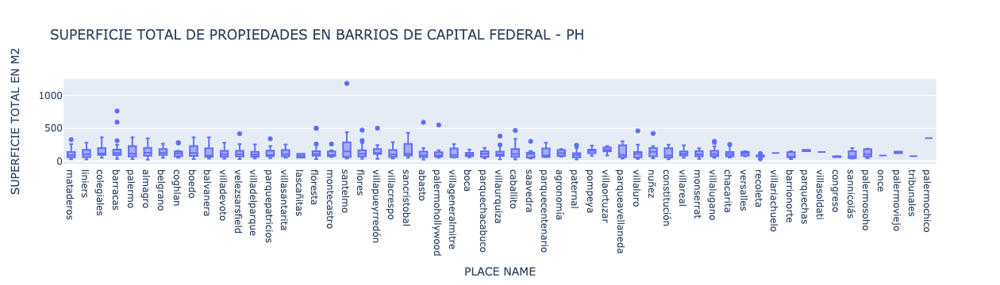

In [199]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='ph')],\
             y = "SUPERFICIE TOTAL EN M2", x='PLACE NAME', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - PH')
fig.show()

In [200]:
df_ph = df[df['TIPO DE PROPIEDAD']=='ph']

### Mataderos - PH

In [201]:
otl_mataderos=df_ph[df_ph['PLACE NAME']=='mataderos'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:5]
otl_mataderos[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
421,326.000,245000.000,hermosacasaenventaenmataderos,"espectacularphalfrenteenplantabaja,ubicadoenla..."
21857,260.000,130000.000,phalfondo7ambientes-mataderos-guamini2400,6habitacionescocina2bañosterrazac/preparadopar...
19680,260.000,180000.000,ph7ambconfondo,"phen2plantasconfondoyparrilla,7ambientes,3baos..."
57587,260.000,290000.000,phmataderosexcelenteoportunidadpara2familias,oportunidadpara2familiaspropiedadconjuntayalav...
14187,250.000,200000.000,"excelente5ambientescongge,3baños,patio,terraza...","excelente5ambientescongge,3baños,cocinacomedor..."


In [202]:
# Con el primer valor, no queda claro si es un ph o una casa, vamos a dropearlo
df = df.drop(otl_mataderos.index[:1])


### Barracas - PH

In [203]:
otl_barracas=df_ph[df_ph['PLACE NAME']=='barracas'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_barracas[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
45949,762.000,1250000.000,phenventa,son11departamentos/estudiosenblock¡¡todosalqui...
17341,593.000,350000.000,phde6ambientesconterrazayentradaindependiente,phde6ambientesconterrazayentradaindependientee...
3604,310.000,250000.000,ph4ambientescondependencia2patiosyterraza,hermosophconentradaindependiente2patios2terraz...


In [204]:
# Los 2 ph mas grandes, son casos muy particulares, vamos a dropearlos, ya que es poco usual un inmueble de esas caracteristicas.

df = df.drop(otl_barracas.index[:2])

### Coghlan - PH

In [205]:
otl_coghlan=df_ph[df_ph['PLACE NAME']=='coghlan'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:2]
otl_coghlan[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
55999,280.000,319000.000,ph-coghlan,"phalfrenteenpbsinexpensas,entradaindependiente..."
15819,276.000,350000.000,phenventa,"importantephapulmóndemanzanaalnoroeste,conunac..."


### Velez Sardfield - PH

In [206]:
otl_velezsardfield=df_ph[df_ph['PLACE NAME']=='velezsarsfield'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:2]
otl_velezsardfield[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
83322,417.000,365000.000,phenvelezsarsfield,elinmuebleesunaphdetresunidadesfuncionaleslauf...
28263,260.000,300000.000,redesanmartin4527vélezsphpb4ambu$300000aptoprof,"ultimopreciou$300000oportunidad,con70m2deparqu..."


In [207]:
# Vamos a dropear este caso particular de ph enorme para lo que es la zona y los valores promedio de m2 de ph.
df = df.drop(otl_velezsardfield.index[:1])


### Parque Patricios - PH

In [208]:
otl_parquepatricios=df_ph[df_ph['PLACE NAME']=='parquepatricios'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:2]
otl_parquepatricios[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
26500,340.000,176000.000,ideal2familiasretasadaoportunidadnoselopierdaa...,"oportunidad,noselopierda,propiedadubicadaenbar..."
35454,230.000,NaN,"venta-ph4amb,c/cochera,patioyterraza-pquepatri...",codigo:1717-522ubicadoen:cátulocastillo2300-pu...


In [209]:
# Vamos a dropear este caso particular de ph enorme para lo que es la zona y los valores promedio de m2 de ph.

df=df.drop(otl_parquepatricios.index[:1])

### Floresta - PH

In [210]:
otl_floresta=df_ph[df_ph['PLACE NAME']=='floresta'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_floresta[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
31859,500.000,280000.000,floresta-oportunidad-edificio-hotelen2plantasc...,"codigo:07ubicadoen:josebonifacio3100,caba,-pub..."
30528,500.000,280000.000,floresta-oportunidad-edificio-hotelen2plantasc...,edificio-hotelen2plantascon12departamentosconb...
38320,260.000,280000.000,phenventa,operacion:ventatipodepropiedad:phambientes:6lo...


In [211]:
# Vamos a dropear los 2 valores, que son duplicados y refieren a un hotel.

df=df.drop(otl_floresta.index[:2])

### Montecastro - PH

In [212]:
otl_montecastro=df_ph[df_ph['PLACE NAME']=='montecastro'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:2]
otl_montecastro[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
16747,260.000,230000.000,phenventa,"ventadephpisounico4ambientesenmontecastro,capi..."
24258,165.000,214900.000,excelentephmontecastroc/terraza,"excelentephtipocasamuybuenaubicacion,aunacuadr..."


In [213]:
# Vamos a dropear este ph, ya que se trata de un caso particular

df=df.drop(otl_montecastro.index[:1])

### Flores - PH

In [214]:
otl_flores=df_ph[df_ph['PLACE NAME']=='flores'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:4]
otl_flores[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
53360,471.000,280000.000,"ph6ambc/patio,terrazaycochera-",departamentotipophde6ambientesenelbarriodeflor...
38344,313.000,315000.000,phenventa,"ventadeph4ambientesenflores,capitalfederalimpe..."
53956,275.000,395000.000,excelentephenflores3dormgranterrazaconquincho,phenprimerpisoconescaleradetresdormitoriosmasq...
22682,272.000,285000.000,ph5ambientesalfrenteentradaindependienteconter...,directorioymembrillar:phpisoúnicodeestiloalfre...


In [215]:
# Vamos a dropear este ph, ya que se trata de un caso particular

df=df.drop(otl_flores.index[:1])

### Villa Pueyrredon - PH

In [216]:
otl_pueyrredon=df_ph[df_ph['PLACE NAME']=='villapueyrredón'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:4]
otl_pueyrredon[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
7943,500.000,700000.000,"depto5amb+casa7amb,cocherapara6autos",setratadedospropiedadesenuna:-->-->entrandopor...
81180,244.000,450000.000,cochera-jardin-quincho-parrilla-impecable,"excelentepropiedadenimportantecomplejo,amtsdea..."
3629,201.000,291000.000,villapueyrredon-ph2dorm+escrit-excelenteestado...,phenprimerpisoporescalera-excelenteestadorecic...
54453,185.000,220000.000,habana3200phvillapueyrredon4ambientes,muybuenphdegenerosasmedidasseaccedeporescalera...


In [217]:
# Vamos a dropear este valor, ya que es un aglomerado de varios tipos de propiedades.

df=df.drop(otl_pueyrredon.index[:1])

### Abasto - PH

In [218]:
otl_abasto=df_ph[df_ph['PLACE NAME']=='abasto'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:4]
otl_abasto[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
64109,590.000,510000.000,ventacasade7ambientesenabasto,"importantephconentradaindependienteantiguo,rec..."
6517,200.000,254900.000,impecablephrecicladoenabasto,sarmiento3200phenabastorecicladoanuevo!!excele...
3954,160.000,160000.000,phenventa,"4ambientesconpatioyterrazaalfrente,enventa,ena..."
22318,141.000,129000.000,"phconterraza,sinexpensas","excelenteubicación,corazóndelabasto,(3cuadrasd..."


In [219]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_abasto.index[:1])

### Villa Urquiza - PH

In [220]:
otl_urquiza=df_ph[df_ph['PLACE NAME']=='villaurquiza'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:4]
otl_urquiza[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
53922,380.000,497000.000,granphenpb-villaurquiza,parainversióndealtarentabilidadgranphenplantab...
14703,245.000,240000.000,ventaph/casa/cochera/local/vurquiza/reciclar,corredorresponsable:unobienesraicessrl-cucicba...
5027,236.000,270000.000,phenventa,ventadepartamentotipoph4ambientesvillaurquizap...
73378,230.000,275000.000,phenventavillaurquiza5ambientesgarajepatioterraza,codigo:973-612337ubicadoen:valdenegro3273-publ...


In [221]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_urquiza[:1].index)

### Caballito - PH

In [222]:
otl_caballito=df_ph[df_ph['PLACE NAME']=='caballito'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:4]
otl_caballito[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
17495,466.000,300000.000,granphenprimerpisoconentradaindependiente,granazoteaygarageolocalalacalleenplantabajaapt...
33863,336.000,590000.000,"imponnetephdeestiloconcocheradoble,terrazayqui...",vermasimagenesen360gradosenhttps://googl/photo...
84746,324.000,410000.000,phventa,"nicolásrepetto1600,espectaculartriplexapareado..."
18687,320.000,332000.000,caballitoph5ambientesconbalconyterraza,"hermosophsobreavsanmartín,cercanoalcidcampeado..."


In [223]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_caballito[:1].index)

### Saavedra - PH

In [224]:
otl_saavedra=df_ph[df_ph['PLACE NAME']=='saavedra'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_saavedra[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
23710,300.000,470000.000,casade5ambientesconcochera,"excelentedúplexenexcelenteubicaciónplantabaja,..."
23246,152.000,245000.000,phenventa,"ventadedepartamento4ambientesensaavedra,phalfr..."
41495,143.000,169900.000,ventadedepartamentoensaavedra,ph2pisoporescalerac/entradaindependientec/come...


In [225]:
df.loc[otl_saavedra.index[:1],'TIPO DE PROPIEDAD']='duplex/triplex'

### Paternal - PH

In [226]:
otl_paternal=df_ph[df_ph['PLACE NAME']=='paternal'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_paternal[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
28811,242.000,350000.000,phenventa,"phde5ambientesenpaternal,capitalfederal-terraz..."
19464,200.000,130000.000,phdobleviviendapb5amby1piso3amb,"multifamiliar,2viviendasomasenplantabaja,5habi..."
38816,195.000,290000.000,excelenteph5ambrecicladoanuevo-(1ºpxesc),"phde5amb-pisounicoconentradaindependiente,sine..."


In [227]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_paternal[:1].index)

### Villa Luro - PH

In [228]:
otl_luro=df_ph[df_ph['PLACE NAME']=='villaluro'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_luro[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
16754,460.000,345000.000,phenventa,"ventadedepositoenvillaluro,capitalfederalsetra..."
53617,250.000,285000.000,ph5ambientesvirgilioal300,excelentephde6ambientesalfrenteconentradaindep...
56348,157.000,215000.000,ph4ambentradaíndeppatioy2tzas,phconentradaindependienteenventaenvillaluroenc...


In [229]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_luro[:1].index)

### Nuñez - PH

In [230]:
otl_nunez=df_ph[df_ph['PLACE NAME']=='nuñez'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_nunez[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
35129,420.000,980000.000,phventa,sevendeenblokcompleto8unidadesplantabajade2amb...
34849,230.000,580000.000,ibera1800(excelenteyamplioph),"phalacalleconentradaindependiente,cocheraparat..."
64591,225.000,600000.000,cochera-nuñez,excelentepropiedadconentradaindependienteideal...


In [231]:
# Vamos a dropear este valor, ya que es un caso particular

df = df.drop(otl_nunez[:1].index)

### Villa Lugano - PH

In [232]:
otl_lugano=df_ph[df_ph['PLACE NAME']=='villalugano'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_lugano[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
29407,301.000,235000.000,phenventa,"villalugano:lote866x3469,superficie301m2,zonif..."
36698,284.000,200000.000,"excelentephde4ambientesydeposito,juntososeparados","constade:tipocasaalfrenteendosplantas,plantaba..."
47438,225.000,170000.000,phfte4ambmuybuenestadoyubicacion,sevendephfrentetipocasaubicadoenlaciudadautóno...


In [233]:
# Vamos a dropear este valor, ya que es un lote

df = df.drop(otl_lugano[:1].index)

### Chacarita - PH

In [234]:
otl_chacarita=df_ph[df_ph['PLACE NAME']=='chacarita'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:3]
otl_chacarita[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
83695,254.000,390000.000,ph-chacarita,"bellisimophalfrente,4ambientes+garageoconsulto..."
23211,230.000,347000.000,phenventa,ventadeph4ambconterrazarecicladoanuevo1erpisop...
18150,140.000,188000.000,phaggiornado3ambientespatioyquincho,"livingcomedor,2dormitorios,patio,quinchoen2dop..."


### San Telmo - PH

In [235]:
otl_santelmo=df_ph[df_ph['PLACE NAME']=='santelmo'].sort_values('SUPERFICIE TOTAL EN M2',ascending = False)[:1]

otl_santelmo[['SUPERFICIE TOTAL EN M2','PRECIO USD','title','description']]

,SUPERFICIE TOTAL EN M2,PRECIO USD,title,description
81146,1183.000,1290000.000,libertad1200,"inmuebleconstruidoenph,actualmenteutilizadocom..."


Es un caso muy particular, donde el inmueble es un hostel de muy grandes dimensiones.

In [236]:
df = df.drop(otl_santelmo.index)

In [237]:
df_ph_caba=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='ph')]
df_ph_caba.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,123.000,1002.000,150.000,1442.000,1100.000,1054.000,1512.000,1511.000
mean,2.293,3.618,983.140,88.759,123.763,1667.419,186893.122,186024.785
std,2.279,1.343,1066.722,53.295,72.301,578.483,103285.201,100173.825
min,1.000,1.000,1.000,1.000,22.000,151.371,45000.000,15591.260
25%,1.000,3.000,327.500,54.000,70.000,1222.222,120000.000,120000.000
50%,1.000,3.000,700.000,76.000,105.000,1609.348,160000.000,160000.000
75%,3.000,4.000,1500.000,110.000,160.000,2047.619,228250.000,226000.000
max,16.000,12.000,9000.000,400.000,550.000,3630.435,1185000.000,995000.000


In [238]:
muchos_pisos_ph = df_ph_caba[df_ph_caba.floor > 6].index
df_ph_caba.sort_values('floor', ascending=False)[:10]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
27906,sell,ph,palermo,|argentina|capitalfederal|palermo|,argentina,capitalfederal,3430234.000,"-34588935,-58432096",-34.589,-58.432,165000.000,usd,2911342.500,165000.000,NaN,20.000,NaN,8250.000,16.000,3.000,NaN,http://wwwproperaticomar/18j9k_venta_ph_palerm...,corredorresponsable:hernanperrone-cucicba2792c...,"phenpalermo,sinexpensas!!!",https://thumbs4properaticom/8/soxj2fxpbp5fokw7...,palermo,20.000,NaN,NaN,165000.000,usd,165000.000,ph
33127,sell,ph,caballito,|argentina|capitalfederal|caballito|,argentina,capitalfederal,3435874.000,"-34629006,-58431408",-34.629,-58.431,130000.000,usd,2293785.000,130000.000,NaN,44.000,NaN,2954.545,14.000,4.000,NaN,http://wwwproperaticomar/190iu_venta_ph_caball...,corredorresponsable:juancarlostreco-cucicba403...,excelentephenpbaptocredito-aptoprofesional,https://thumbs4properaticom/6/mw7adxyoq8ihneop...,caballito,44.000,NaN,NaN,130000.000,usd,130000.000,ph
16861,sell,ph,almagro,|argentina|capitalfederal|almagro|,argentina,capitalfederal,3436397.000,"-34600779,-58415586",-34.601,-58.416,163000.000,usd,2876053.500,163000.000,NaN,20.000,NaN,8150.000,9.000,4.000,NaN,http://wwwproperaticomar/17h14_venta_ph_almagr...,corredorresponsable:danielacosta-cucicba2406co...,ventaphalmagro4ambrestaurado,https://thumbs4properaticom/8/81pgua8x5nwky9_q...,almagro,20.000,NaN,NaN,163000.000,usd,163000.000,ph
14656,sell,ph,villadelparque,|argentina|capitalfederal|villadelparque|,argentina,capitalfederal,3427455.000,"-34609143,-58501454",-34.609,-58.501,140000.000,usd,2470230.000,140000.000,NaN,20.000,NaN,7000.000,8.000,3.000,NaN,http://wwwproperaticomar/178ov_venta_ph_villa-...,corredorresponsable:matiascastelli-cucicba3678...,ventaexcelenteph3ambvdelparqueaptocrédito,https://thumbs4properaticom/8/vlwx7wmriutwcrn6...,villadelparque,20.000,NaN,NaN,140000.000,usd,140000.000,ph
47169,sell,ph,balvanera,|argentina|capitalfederal|balvanera|,argentina,capitalfederal,6693228.000,"-34603329,-58397141",-34.603,-58.397,135000.000,usd,2382007.500,135000.000,NaN,97.000,NaN,1391.753,7.000,4.000,NaN,http://wwwproperaticomar/1a7cf_venta_ph_balvan...,corredorresponsable:patriciamariasodor-cucicba...,departamento4ambbalvaneraenventa!!!!,https://thumbs4properaticom/1/oj10bger-m6gxrby...,balvanera,97.000,NaN,NaN,135000.000,usd,135000.000,ph
15004,sell,ph,villacrespo,|argentina|capitalfederal|villacrespo|,argentina,capitalfederal,3427458.000,"-345956141,-58439306",-34.596,-58.439,135000.000,usd,2382007.500,135000.000,54.000,46.000,2500.000,2934.783,6.000,3.000,2000.000,http://wwwproperaticomar/179zu_venta_ph_villa-...,ventadedepartamentoenedificio3ambientesenvilla...,phenventa,https://thumbs4properaticom/0/mpgs2ixqoeuo6hur...,villacrespo,46.000,54.000,2500.000,135000.000,usd,135000.000,ph
533,sell,ph,coghlan,|argentina|capitalfederal|coghlan|,argentina,capitalfederal,3435359.000,"-345666643,-58471989",-34.567,-58.472,152000.000,usd,2681964.000,152000.000,52.000,52.000,2923.077,2923.077,6.000,2.000,1800.000,http://wwwproperaticomar/15fql_venta_ph_coghla...,"ventadedepartamento1dormenbelgrano,capitalfede...",phenventa,https://thumbs4properaticom/4/shiedjrwc7svzw4x...,coghlan,52.000,52.000,2923.077,152000.000,usd,152000.000,ph
85070,sell,ph,versalles,|argentina|capitalfederal|versalles|,argentina,capitalfederal,3427510.000,"-34630983,-58518105",-34.631,-58.518,220000.000,usd,3881790.000,220000.000,NaN,98.000,NaN,2244.898,6.000,3.000,NaN,http://wwwproperaticomar/1cgym_venta_ph_versal...,corredorresponsable:danielacosta-cucicba2406co...,impecableph3ambconjardin,https://thumbs4properaticom/4/1mxgv_kle9za09t0...,ver

In [239]:
#Vamos a dropear los ph que tienen valores raros de cantidad de pisos, y poner un maximo de hasta 6 pisos

df = df.drop(muchos_pisos_ph)

In [240]:
# Vamos a tomar como parametro el quantile 20, como minimo de superficie cubierta.

q2=df_ph_caba['SUPERFICIE CUBIERTA EN M2'].quantile(.2)

superficie_cubierta_mal_ph = df[df['SUPERFICIE CUBIERTA EN M2'] < q2].index

df = df.drop(superficie_cubierta_mal_ph)

In [241]:
# Vamos a dropear todos los valores donde sup cub sea superior a sup total

superficie_total_mal_ph = df_ph_caba[df_ph_caba['SUPERFICIE CUBIERTA EN M2'] > df_ph_caba['SUPERFICIE TOTAL EN M2']].index

df = df.drop(superficie_total_mal_ph)

In [242]:
index_ph_precio_m2=df[np.logical_and(df['TIPO DE PROPIEDAD']=='ph',df['PRECIO USD POR M2']<500)].index

df_ph_caba.sort_values('PRECIO USD POR M2')[:10]

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD
79748,sell,ph,villacrespo,|argentina|capitalfederal|villacrespo|,argentina,capitalfederal,3427458.000,NaN,NaN,NaN,278000.000,ars,275099.980,15591.260,103.000,82.000,151.371,3390.244,NaN,NaN,400.000,http://wwwproperaticomar/1c6d3_venta_ph_villa-...,"hermosoph,muybienubicadoyenexcelenteestado4amb...",ph-villacrespo,https://thumbs4properaticom/3/5czgr8bsnoqlxeri...,villacrespo,82.000,103.000,151.371,278000.000,ars,15591.260,ph
37065,sell,ph,almagro,|argentina|capitalfederal|almagro|,argentina,capitalfederal,3436397.000,"-346142052423,-584134833035",-34.614,-58.413,138000.000,usd,2434941.000,138000.000,295.000,153.000,467.797,901.961,NaN,4.000,NaN,http://wwwproperaticomar/19co6_venta_ph_almagr...,"ventadedepartamento4ambientesenalmagro,capital...",phenventa,https://thumbs4properaticom/5/uhgiqd-zwlszjwbi...,almagro,153.000,295.000,467.797,138000.000,usd,138000.000,ph
37064,sell,ph,balvanera,|argentina|capitalfederal|balvanera|,argentina,capitalfederal,6693228.000,"-346141472,-58413315",-34.614,-58.413,138000.000,usd,2434941.000,138000.000,295.000,153.000,467.797,901.961,NaN,4.000,NaN,http://wwwproperaticomar/19co5_venta_ph_balvan...,"ventadecasa4ambientesenbalvanera,capitalfedera...",phenventa,https://thumbs4properaticom/3/z1egdvnc2dtdakcl...,balvanera,153.000,295.000,467.797,138000.000,usd,138000.000,ph
21857,sell,ph,mataderos,|argentina|capitalfederal|mataderos|,argentina,capitalfederal,3430787.000,"-346572422,-585029706",-34.657,-58.503,130000.000,usd,2293785.000,130000.000,260.000,200.000,500.000,650.000,NaN,7.000,NaN,http://wwwproperaticomar/17z3x_venta_ph_matade...,6habitacionescocina2bañosterrazac/preparadopar...,phalfondo7ambientes-mataderos-guamini2400,https://thumbs4properaticom/0/nv0uq-w3bmuqys-o...,mataderos,200.000,260.000,500.000,130000.000,usd,130000.000,ph
15556,sell,ph,constitución,|argentina|capitalfederal|constitución|,argentina,capitalfederal,3435257.000,"-346253217,-583828981",-34.625,-58.383,129000.000,usd,2276140.500,129000.000,250.000,130.000,516.000,992.308,NaN,6.000,NaN,http://wwwproperaticomar/17bz9_venta_ph_consti...,"phde250mts2segunescritura,entradaindependiente...",phventa,https://thumbs4properaticom/9/duz7_au1cfb_8ug0...,constitución,130.000,250.000,516.000,129000.000,usd,129000.000,ph
4362,sell,ph,parquechacabuco,|argentina|capitalfederal|parquechacabuco|,argentina,capitalfederal,3430116.000,"-346434566,-58432178",-34.643,-58.432,105000.000,usd,1852672.500,105000.000,203.000,118.000,517.241,889.831,NaN,4.000,NaN,http://wwwproperaticomar/15s5i_venta_ph_parque...,4ambentradaindependienteprimeroporescaleraquec...,"4ambalfrenteconbalcón,patioyterraza",https://thumbs4properaticom/1/afdjyqthhshcysil...,parquechacabuco,118.000,203.000,517.241,105000.000,usd,105000.000,ph
41432,sell,ph,mataderos,|argentina|capitalfederal|mataderos|,argentina,capitalfederal,3430787.000,"-346635514,-584908494",-34.664,-58.491,85000.000,usd,1499782.500,85000.000,159.000,72.000,534.591,1180.556,NaN,3.000,NaN,http://wwwproperaticomar/19otv_venta_ph_matade...,ph3ampliosycómodosambientesconpatioyterrazaenm...,reservado-reservado-ph3ampliosycómodosambiente...,https://thumbs4properaticom/7/yxnl092yyweibl88...,mataderos,72.000,159.000,534.591,85000.000,usd,85000.000,ph
31909,sell,ph,villareal,|argentina|capitalfederal|villareal|,argentina,capitalfederal,3427383.000,"-346201601,-585311704",-34.620,-58.531,130000.000,usd,2293785.000,130000.000,240.000,120.000,541.667,1083.333,NaN,NaN,NaN,http://wwwproperaticomar/18x1f_venta_ph_villa-...,codigo:2850-ab2015ubicadoen:gralpaz7500-public...,ventajosèingenieros:2phen

In [243]:
df.loc[index_ph_precio_m2[:1],'TIPO DE PROPIEDAD']='apartment'

Los precios de los ph por m2, inician en 500 usd/m2, vamos a dropear los precios inferiores

In [244]:
df = df.drop(index_ph_precio_m2)

## Store

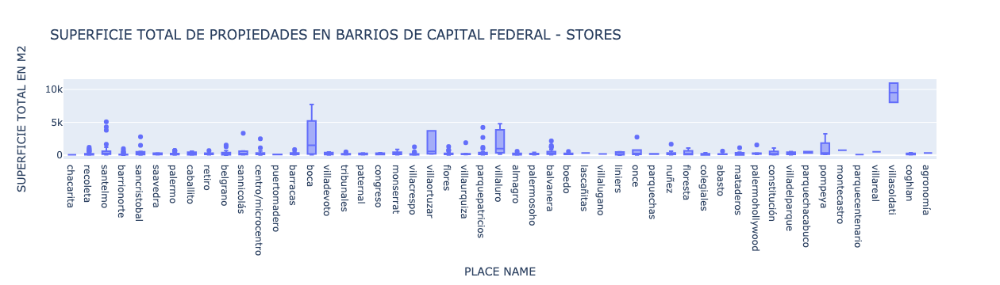

In [245]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')], y = "SUPERFICIE TOTAL EN M2", x='PLACE NAME', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - STORES')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q3(75) + 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [246]:
store_outliers = ['recoleta','santelmo', 'barrionorte','sancristobal','palermo','retiro','belgrano','sannicolás','centro/microcentro', 'barracas', 'tribunales',
                 'montserrat','villacrespo','flores','villaurquiza','parquepatricios','balvanera','boedo','once','nuñez','floresta','abasto','florida']

df_stores = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')]

for outliers in store_outliers:
    q1 = df_stores[df_stores['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.25)
    q3 = df_stores[df_stores['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_store_sup_max = df_stores[np.logical_and(df_stores['PLACE NAME']==outliers, df_stores['SUPERFICIE TOTAL EN M2'] > q3 + 1.5 * RIC)].index
    
    df = df.drop(index_outlier_store_sup_max)


In [247]:
df_stores_caba=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')]
df_stores_caba.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,3.000,22.000,111.000,598.000,624.000,545.000,631.000,627.000
mean,2.667,2.227,3270.973,298.241,285.502,2686.191,630433.365,549877.983
std,1.155,2.844,3748.459,707.488,710.790,2093.466,1248450.701,762273.364
min,2.000,1.000,1.000,48.000,12.000,13.797,19900.000,5608.360
25%,2.000,1.000,1000.000,91.000,90.750,1400.000,215000.000,212500.000
50%,2.000,1.000,2000.000,150.000,151.500,2184.874,355000.000,350000.000
75%,3.000,1.000,4500.000,279.500,273.500,3275.862,600000.000,600000.000
max,4.000,10.000,19000.000,10958.000,10958.000,22000.000,19267560.000,8500000.000


In [248]:
store_index_expenses=df_stores_caba.sort_values('expenses')[:20].index

df_stores_caba.sort_values('expenses')[['expenses','SUPERFICIE TOTAL EN M2','title','PRECIO USD POR M2','PRECIO USD']][:20]

# Ya que suponemos el valor de 1 es algo simbolico, vamos a imputarles nan a los 12 primeros valores de expenses

df.loc[store_index_expenses[:12],'expenses']=np.NaN

In [249]:
df_stores_caba.sort_values('SUPERFICIE TOTAL EN M2')[['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD']][:4]


,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD
49765,NaN,12.000,2083.333,25000.000
16809,NaN,20.000,5500.000,110000.000
48850,NaN,20.000,2000.000,40000.000
49284,NaN,22.000,4500.000,99000.000


In [250]:
# Podemos ver que hay varios NaN, en la superficie cubierta, y es por esto que tiene un valor inferior min a sup total, pero los valores de superficie total son muy bajos

# Suponemos un valor de Superficie total minimo de 30m2

store_index_sup_muy_chica = df_stores_caba[df_stores_caba['SUPERFICIE TOTAL EN M2'] < 30 ].index
df = df.drop(store_index_sup_muy_chica)


store_index_sup_mal_cargada = df_stores_caba[df_stores_caba['SUPERFICIE CUBIERTA EN M2'] > df_stores_caba['SUPERFICIE TOTAL EN M2']].index
df = df.drop(store_index_sup_mal_cargada)

In [251]:
store_index_sup_muy_grande = df_stores_caba.sort_values('SUPERFICIE TOTAL EN M2', ascending = False)[:18].index

df_stores_caba.sort_values('SUPERFICIE TOTAL EN M2', ascending = False)[['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']][:18]



,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
52082,10958.000,10958.000,775.689,8500000.000,excelentenaveindustrialde10960m2sobreterrenode...
49910,NaN,8053.000,13.797,111111.000,naveindustrial-villasoldati
49862,7722.000,7722.000,1036.001,8000000.000,ventaconrentaespectaculardepósitopremium
49273,4800.000,4800.000,833.333,4000000.000,plantaindustrialde3500m2salidaa3calles
50609,3700.000,3700.000,1486.486,5500000.000,importantepropiedad3700m2aptav/destinos
50411,3700.000,3700.000,1756.757,6500000.000,excelentepropiedadde3700m2amtstriunvirato
50295,3250.000,3250.000,461.538,1500000.000,edificio3250m2c/oficinas+depósitosenpolotecnol...
61665,NaN,2700.000,1296.296,3500000.000,edificiocomercialenboca
50487,NaN,1556.000,2249.357,3500000.000,local-palermohollywood
49851,1205.000,1205.000,995.851,1200000.000,tacuari1100-importantepropiedadusocomercial


In [252]:
# Podemos observar que los 2 primeros index, refieren a una nave industrial de enormes dimensiones y un deposito, tambien de varias hectareas, vamos a dropear estos valores.
# Los 7 primeros index, corresponden todos a valores muy altos para sus respectivas zonas.
# Los index 8,13 y 15 tienen valores muy superiores a sus zonas.
df = df.drop(store_index_sup_muy_grande[:8])
df = df.drop(store_index_sup_muy_grande[8])
df = df.drop(store_index_sup_muy_grande[13])
df = df.drop(store_index_sup_muy_grande[15])


In [253]:

df_stores_caba.sort_values('PRECIO USD',ascending = False)[:3][['SUPERFICIE TOTAL EN M2','title','PRECIO USD POR M2','PRECIO USD','PLACE NAME']]

,SUPERFICIE TOTAL EN M2,title,PRECIO USD POR M2,PRECIO USD,PLACE NAME
52082,10958.000,excelentenaveindustrialde10960m2sobreterrenode...,775.689,8500000.000,villasoldati
49862,7722.000,ventaconrentaespectaculardepósitopremium,1036.001,8000000.000,boca
50411,3700.000,excelentepropiedadde3700m2amtstriunvirato,1756.757,6500000.000,villaortuzar


Son logicos los precios

In [254]:
# Se trata de 2 locales que se venden juntos.

df.loc[7040]
df = df.drop(7040)


### Duplex/Triplex 

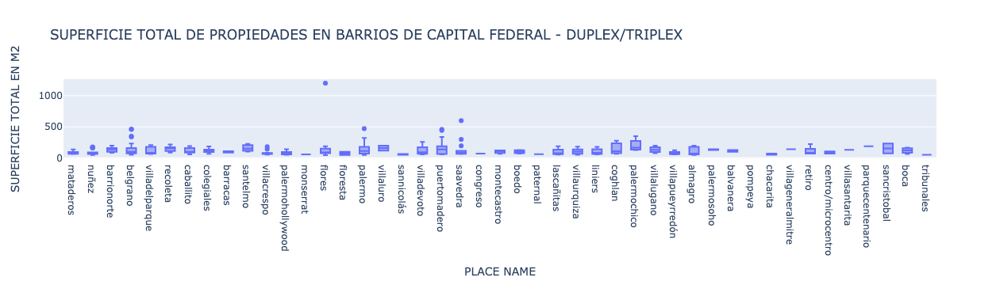

In [255]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='duplex/triplex')], y = "SUPERFICIE TOTAL EN M2", x='PLACE NAME', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - DUPLEX/TRIPLEX')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q3(75) + 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [256]:
duplex_outliers = ['nuñez','belgrano','villacrespo','palermo','puertomadero','saavedra']

df_duplex= df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='duplex/triplex')]

for outliers in duplex_outliers:
    q1 = df_duplex[df_duplex['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.25)
    q3 = df_duplex[df_duplex['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_duplex_sup_max = df_duplex[np.logical_and(df_duplex['PLACE NAME']==outliers, df_duplex['SUPERFICIE TOTAL EN M2'] > q3 + 1.5 * RIC)].index
    
    df = df.drop(index_outlier_duplex_sup_max)


In [257]:
df_duplex=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='duplex/triplex')]
df_duplex.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,47.000,268.000,83.000,407.000,322.000,308.000,424.000,424.000
mean,5.809,3.302,3931.337,101.199,117.450,2693.551,353849.167,312132.294
std,4.271,1.178,3129.851,47.413,80.680,1113.749,597809.701,270823.077
min,1.000,1.000,1.000,48.000,48.000,250.000,23000.000,23000.000
25%,2.500,2.000,1800.000,64.000,71.250,1990.476,175000.000,175000.000
50%,5.000,3.000,3000.000,85.000,98.000,2500.000,240000.000,240000.000
75%,9.000,4.000,6000.000,129.000,146.750,3017.500,365000.000,360500.000
max,15.000,8.000,17000.000,290.000,1200.000,9597.523,9435376.000,3100000.000


In [258]:
duplex_index_expenses = df_duplex.sort_values('expenses')[:4].index
df_duplex.sort_values('expenses')[['expenses','SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']][:4]



,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
66467,1.000,80.000,80.000,3020.000,241600.000,"venta-dúplex2ambientes,dormitorioensuiteennúñez"
24693,10.000,80.000,130.000,NaN,NaN,ventaduplexaestrenar
56065,300.000,62.000,102.000,1666.667,170000.000,ventadúplex4ambientesenliniersconterrazapropia
54246,300.000,150.000,150.000,1653.333,248000.000,departamentoventa3ambientesbarrionorteduplexal...


In [259]:
# Vamos a dropear el primer indice, que no nos dice , y 10 es un valor muy bajo

df = df.drop(duplex_index_expenses[:1])

In [260]:
df_duplex.sort_values('PRECIO USD', ascending = False)\
        [['expenses','SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']][:5]


,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
60618,NaN,NaN,323.000,9597.523,3100000.000,departamentoenpalermo
31708,NaN,290.000,350.000,6571.429,2300000.000,venta-impresionanteduplexconterrazayparrilla-b...
5053,NaN,252.000,252.000,6944.444,1750000.000,excelentetriplexmuyaltoconvistaaríoyalnorte
9811,NaN,265.000,NaN,NaN,1600000.000,triplexamobladodelujoenmolinosfaenabuilding
33856,NaN,239.000,339.000,4100.295,1390000.000,espectacularresidenciaenduplexconlasmejoresvis...


Segun simulaciones en zonaprop son valores logicos los de PRECIO USD y PRECIO USD POR M2

## Piso/Penthouse

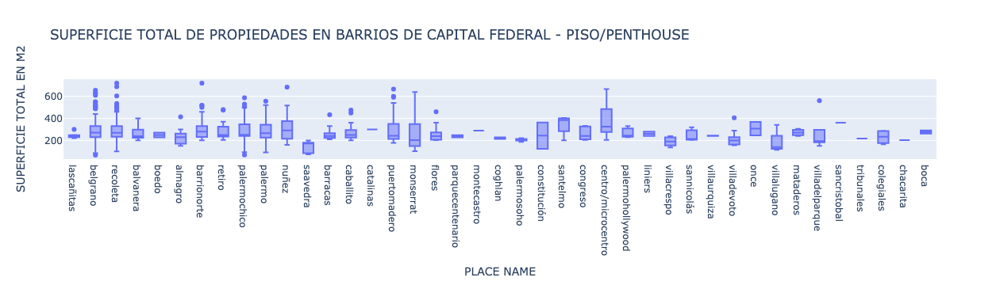

In [261]:
fig = px.box(df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')],\
             y = "SUPERFICIE TOTAL EN M2", x='PLACE NAME', title= ' SUPERFICIE TOTAL DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - PISO/PENTHOUSE')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [262]:
piso_outliers = ['lascañitas','belgrano','recoleta','almagro','barrionorte','retiro','palermochico','palermo','nuñez','barracas','caballito','puertomadero','flores',
                  'centro/microcentro','villadevoto','villadelparque']

df_piso = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')]

for outliers in store_outliers:
    q1 = df_piso[df_piso['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.25)
    q3 = df_piso[df_piso['PLACE NAME']==outliers]['SUPERFICIE TOTAL EN M2'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_piso_sup_max = df_piso[np.logical_and(df_piso['PLACE NAME']==outliers, df_piso['SUPERFICIE TOTAL EN M2'] > q3 + 1.5 * RIC)].index
    index_outlier_piso_sup_min = df_piso[np.logical_and(df_piso['PLACE NAME']==outliers, df_piso['SUPERFICIE TOTAL EN M2'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_piso_sup_max)
    df = df.drop(index_outlier_piso_sup_min)



In [263]:
df_piso_caba=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')]
df_piso_caba.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,67.000,533.000,295.000,817.000,756.000,684.000,782.000,782.000
mean,4.448,5.293,12446.203,480.928,273.688,3522.326,970355.568,968498.966
std,3.474,1.756,8213.200,6535.603,81.998,2311.348,829886.789,830230.694
min,1.000,1.000,1.000,48.000,68.000,268.470,70000.000,70000.000
25%,1.000,4.000,7000.000,200.000,220.000,2185.396,491250.000,490000.000
50%,4.000,5.000,11976.000,234.000,250.000,2935.476,744500.000,740000.000
75%,6.500,6.000,16000.000,294.000,313.250,4313.006,1200000.000,1200000.000
max,14.000,17.000,70000.000,187000.000,666.000,20731.707,8500000.000,8500000.000


In [264]:
piso_index_ambientes = df_piso_caba.sort_values('rooms', ascending = False)[:10].index
df_piso_caba.sort_values('rooms', ascending = False)[['rooms','SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','description']][:10]



,rooms,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,description
38094,17.000,359.000,NaN,NaN,1700000.000,pisodecategoríaenventaenrecoleta,corredorresponsable:laurahzarate-cucicba6602co...
13994,14.000,320.000,400.000,837.500,335000.000,"14habitaciones,5bañostodoen320mts",setratadeunapropiedaddesarrolladatodoenel3erpi...
40302,12.000,554.000,NaN,NaN,1380000.000,duplexdegrancategoríaconterraza,corredorresponsable:cristianarnalponti-cucicba...
33332,12.000,320.000,320.000,2171.875,695000.000,mtdealvear-libertad320m2enimpactanteedificiofr...,plazalibertaddeptounicoenedificioestilofrancés...
8881,12.000,200.000,200.000,1245.000,249000.000,pisode200m2-carloscalvoal800-santelmo-,ventadepisotipoph(1ºpiso)u$s249000“conexcelent...
9966,12.000,363.000,366.000,3278.689,1200000.000,arroyoyesmeralda:oficina/viviendafrancesunico!...,-excelentepisode375menedificiofrancésdegrancat...
26809,12.000,417.000,417.000,2997.602,1250000.000,arenales2100increíbleduplexestilofránces,impecableedificiofrancéssondospisoscomunicados...
40786,12.000,329.000,329.000,2844.985,936000.000,arenalesal1800-edificiofrancesrecicladoensutot...,recicladoensutotalidadubicadoenexclusivoedific...
30092,11.000,273.000,273.000,915.751,250000.000,ventahosteloviviendaensantelmo,setratadeundepartamentoamplioquefuncionaactual...
28269,11.000,300.000,400.000,925.000,370000.000,pisode300m2cubiertoscon100m2deterrazapropia,pisoúnicorestauradoconaberturasoriginalespisos...


In [265]:
# El primer index, no podemos comprobar si realmente tiene 17 ambientes, asi que vamos a dropearlo, ya que no nos dice mucho

df = df.drop(piso_index_ambientes[:1])

df.loc[piso_index_ambientes[6],'TIPO DE PROPIEDAD']='duplex/triplex'

# Se trata de un hotel y no un piso
df = df.drop(piso_index_ambientes[9])


In [266]:
piso_index_expensas = df_piso_caba.sort_values('expenses')[:10].index
df_piso_caba.sort_values('expenses')[['expenses','SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','description']][:10]


,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,description
48952,1.000,364.000,364.000,9615.385,3500000.000,torremirabilia-5ambientes-palermo,torremirabiliapalermopalierprivadoydeservicioh...
55810,1.000,230.000,280.000,1000.000,280000.000,piso5ambientes-mataderos,ventapiso5ambientesavemiliocastroliniersbarrio...
59031,1.000,380.000,400.000,1000.000,400000.000,oficinaenventasantelmo,excelentepropiedadde400m2en3plantasidealusocom...
59466,1.000,290.000,380.000,NaN,NaN,unicodepartamentoconterrazaenchateaulibertador,espectaculardepartamentoentorrechateaulibertad...
63570,1.000,214.000,214.000,7476.636,1600000.000,renoiriisolpisoaltocondoscocheras,renoiriiexcelentedto4ambdeppisoaltovistapanora...
62067,1.000,214.000,214.000,6542.056,1400000.000,renoirii-pisoaltosolcondoscocheras,renoirii-solpisoalto-condoscocherastresdormito...
62077,1.000,214.000,214.000,7009.346,1500000.000,renoiriisolcondoscocherasaestrenar,renoirii-sol-pisoalto-doscocherasexcelentedto4...
29496,5.000,NaN,209.000,1866.029,390000.000,departamentoenventa,"departamento7ambientesomasenbarracas,capitalfe..."
80361,850.000,165.000,165.000,1878.788,310000.000,departamentoenventa,pisotipocasa4ambientesfrenteycontrafrente165m2...
54425,1100.000,123.000,202.000,891.089,180000.000,jbjusto4200dptoconjardinaptocomercial,"excelentepropiedad,edificiode2pisos,lamismasee..."


In [267]:
# Los 8 primeros valores de expensas estan mal imputados, vamos a cargarles NaN values.

df.loc[piso_index_expensas[:8],'expenses']=np.NaN

In [268]:
piso_index_sup_cubierta = df_piso_caba.sort_values('SUPERFICIE CUBIERTA EN M2', ascending = False)[:10].index
df_piso_caba.sort_values('SUPERFICIE CUBIERTA EN M2', ascending = False)[['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','description']][:10]


,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,description
56640,187000.000,NaN,NaN,600000.000,excelentepisoenbarrionorte,barrionorteexcelentesemipisoalfrentebalcóncorr...
33654,3330.000,NaN,NaN,70000.000,ventadepartamento2ambaptocredito-almagro-,corredorresponsable:jorgesalafia-cucicba5666co...
47598,2949.000,NaN,NaN,76900.000,monoambienteconcocinaamericanaenbelgranor,corredorresponsable:jorgesalafia-cucicba5666co...
35098,655.000,NaN,NaN,2499000.000,vendepisobarrancasbelgrano8ambpiletapropia,corredorresponsable:ricardodemichelli-cucicba1...
48788,639.000,639.000,624.413,399000.000,moreno1500,ventapetithotelenbloqueenmonserrat**areciclar*...
25754,623.000,NaN,NaN,420000.000,hotel/pensionenbalvaneraaptocredito,corredorresponsable:luisromangarcia-cucicba404...
43686,611.000,666.000,NaN,NaN,eylepetrona300,edificioalephdique2partners+fosterpuertomadero...
34969,600.000,NaN,NaN,NaN,departamentoenventaenrecoleta,codigo:4008-carlosjose-4ubicadoen:avalvear1900...
11434,600.000,600.000,7500.000,4500000.000,torrerenoirii-pisode600m²vistaalrio7ambcon4coc...,contactoleonel15renoirtorreiipisoenterovista36...
4369,587.000,587.000,5110.733,3000000.000,importantepenthouseeninmejorablezona,"supervistaabiertaarioyciudadúnico,conjardìnenl..."


In [269]:
df.loc[piso_index_sup_cubierta[:1],['SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2']]=187

df = df.drop(piso_index_sup_cubierta[1])


In [270]:
df_piso_caba.sort_values('PRECIO USD POR M2', ascending = False)\
[['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','description']][:10]


,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,description
33329,410.000,410.000,20731.707,8500000.000,leparcalcorta-pisomuyaltode410m2con2cocheras,contacto:martinpinus15-excelentisimapropiedadd...
19196,200.000,220.000,20000.000,4400000.000,excelentepiso220m2c/dep2cocherasfijas,excelentepiso220m2palierprivadolivingycomedors...
33328,410.000,410.000,19512.195,8000000.000,leparcalcorta-pisomuyaltode410m2con2cocheras,contacto:martinpinus15-excelentisimapropiedadd...
33326,300.000,320.000,17187.500,5500000.000,leparcalcorta-pisode320m2con2cocheras,contacto:martinpinus15-excelentisimapropiedadd...
10176,200.000,211.000,12796.209,2700000.000,leparcalcorta-pisode211m²con2cocheras,contacto:rominataccari15contacto:martinpinus15...
41537,250.000,250.000,12000.000,3000000.000,venta:semipisodegrancategoríaeimportantestermi...,"livingycomedoryestaroescritorio,balcón,toilett..."
40008,400.000,400.000,11000.000,4400000.000,leparcdemaria4500-pisoaltisimorecicladovistaal...,contactoleonelmoiguer15***torreleparcpalermo**...
36734,377.000,377.000,10875.332,4100000.000,leparcdemaria4500-pisoaltisimorecicladovistaal...,***torreleparcpalermo******excelentisimopisoal...
39444,456.000,516.000,10658.915,5500000.000,espectacularpenthouseenforumalcorta!,espectacularpenthouseenforumalcorta!trilpexenp...
42993,456.000,516.000,10658.915,5500000.000,forumalcortatriplex,"triplexenforumalcorta!vistaespectacularario,ci..."


Los precios son logicos, al simularlos en Zona Prop.

## Price

#### APARTAMENTOS - USD

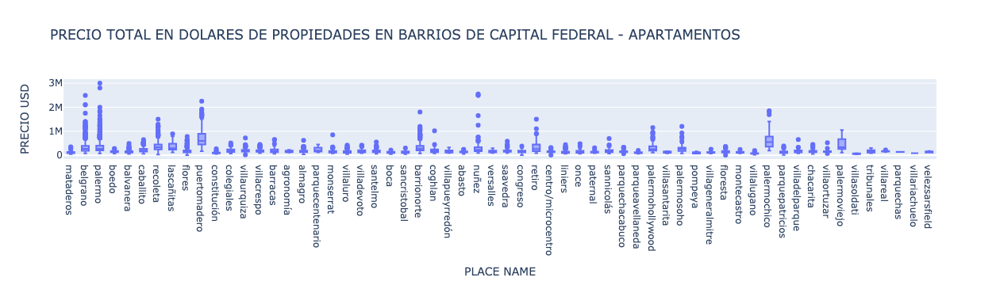

In [271]:
df_departamento_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='apartment')]

fig = px.box(df_departamento_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - APARTAMENTOS')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [272]:
precio_outliers_departamentos = ['mataderos','belgrano','palermo','boedo','balvanera','caballito','recoleta','flores','puertomadero','constitución','colegiales','villaurquiza',
                 'villacrespo','barracas','almagro','monserrat','villaluro','villadevoto','santelmo','boca','sancristobal','barrionorte','coghlan','abasto',
                 'nuñez','versalles','saavedra','congreso','retiro','centro/microcentro','liniers','once','paternal','sannicolás','parquechacabuco','parqueavellaneda',
                 'palermohollywood','palermosoho','villageneralmitre','floresta','montecastro','villalugano','palermochico','parquepatricios','villadelparque',
                 'chacarita','villaortuzar','villareal']


for outliers in precio_outliers_departamentos:
    q1 = df_departamento_capitalfederal[df_departamento_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_departamento_capitalfederal[df_departamento_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_ap_max = df_departamento_capitalfederal[np.logical_and(df_departamento_capitalfederal['PLACE NAME']==outliers, df_departamento_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_ap_min = df_departamento_capitalfederal[np.logical_and(df_departamento_capitalfederal['PLACE NAME']==outliers, df_departamento_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_ap_max)
    df = df.drop(index_outlier_ap_min)
    


In [273]:
df_departamento_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='apartment')]
df_departamento_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,1231.000,5177.000,2831.000,8097.000,7150.000,6520.000,8438.000,8409.000
mean,5.162,3.251,3640.607,84.761,91.612,2719.645,298199.162,242373.077
std,4.905,0.993,3102.936,35.724,40.092,1088.955,552699.394,161818.886
min,1.000,1.000,1.000,48.000,27.000,69.382,24300.000,6730.040
25%,2.000,3.000,1800.000,59.000,62.000,2022.059,140000.000,139500.000
50%,4.000,3.000,2900.000,74.000,80.000,2500.000,195000.000,190000.000
75%,7.000,4.000,4500.000,100.000,111.000,3105.784,297000.000,290000.000
max,55.000,9.000,54240.000,419.000,419.000,9750.000,14756597.000,1500000.000


In [274]:
df_departamento_capitalfederal.sort_values('SUPERFICIE TOTAL EN M2')\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']][:5]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
83724,NaN,27.000,2851.852,77000.000,departamento-belgrano
73155,NaN,27.000,2218.519,59900.000,local30mt2/aestrenar!!
73481,NaN,27.000,2218.519,59900.000,departamento-flores
67361,NaN,27.000,1600.000,43200.000,departamento-scristobal
54501,NaN,27.000,2740.741,74000.000,dto1ambfrentevtatodoluzysol


In [275]:

df_departamento_capitalfederal.sort_values('PRECIO USD')\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']][:10]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
41732,67.000,97.000,69.382,6730.040,3ambientesampliosenimpecableestadoconpatio1ºpo...
85315,60.000,60.000,126.188,7571.290,departamentoenventaenbalvanera3ambientes60m2–j...
11214,76.000,82.000,122.426,10038.970,excelentedptode4ambcoch/baulera/parquepatricio...
19084,60.000,60.000,405.000,24300.000,sevendedpto4ambbarriopiedrabuena
30451,NaN,154.000,187.498,28874.750,departamentoventa
42789,49.000,NaN,NaN,39000.000,ventadpto3ambenvillasoldati
19340,NaN,NaN,NaN,40000.000,excelente2ambienteconmuybuenprecio!!!
67361,NaN,27.000,1600.000,43200.000,departamento-scristobal
19334,50.000,50.000,900.000,45000.000,dpto3ambsavio
21103,70.000,70.000,642.857,45000.000,departamentoventa


In [276]:
# De simulacion en la pagina ZonaProps, tomamos un precio minimo de 42.000 usd para un departamento en caba.

index_mal_precio_usd_m2 = df_departamento_capitalfederal[df_departamento_capitalfederal['PRECIO USD'] < 42000].index


df = df.drop(index_mal_precio_usd_m2)

In [277]:
# Sobre el valor de las expensas, dropeamos los valores inferiores al quantil del 5%

q_expensas_caba=df_departamento_capitalfederal.expenses.quantile(0.05)

index_expensas_mal_cargadas=df_departamento_capitalfederal[df_departamento_capitalfederal.expenses < q_expensas_caba].index

df = df.drop(index_expensas_mal_cargadas)

#### Houses - usd

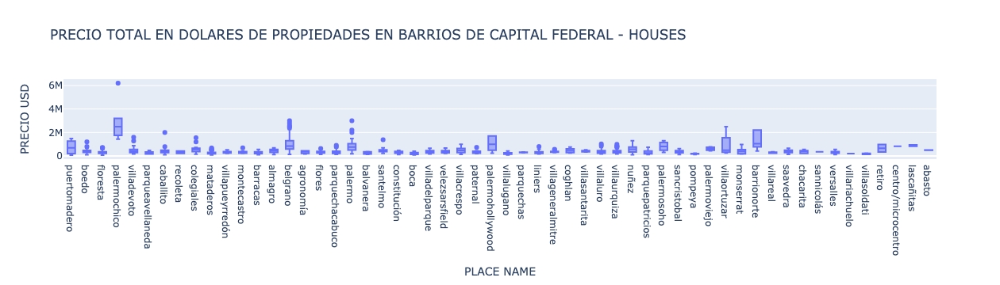

In [278]:
df_houses_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='house')]
fig = px.box(df_houses_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - HOUSES')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [279]:
precio_outliers_casas_caba = ['boedo','floresta','villadevoto','parqueavellaneda','caballito','colegiales','montecastro','belgrano','flores','parquechacabuco',
                         'palermo','mataderos','paternal','liniers','villageneralmitre','villaluro','villaurquiza','parquepatricios','sancristobal']


for outliers in precio_outliers_casas_caba:
    q1 = df_houses_capitalfederal[df_houses_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_houses_capitalfederal[df_houses_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_h_max = df_houses_capitalfederal[np.logical_and(df_houses_capitalfederal['PLACE NAME']==outliers, df_houses_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_h_min = df_houses_capitalfederal[np.logical_and(df_houses_capitalfederal['PLACE NAME']==outliers, df_houses_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_h_max)
    df = df.drop(index_outlier_h_min)
    


In [280]:
df_houses_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='house')]
df_houses_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,1.000,439.000,3.000,1118.000,917.000,788.000,1147.000,1145.000
mean,2.000,4.738,5367.000,234.482,299.373,1556.171,440334.612,439764.891
std,NaN,1.657,5039.640,131.270,162.882,805.782,400965.607,400462.968
min,2.000,1.000,1.000,48.000,48.000,288.889,70000.000,70000.000
25%,2.000,4.000,3050.500,141.000,185.000,1040.467,240000.000,240000.000
50%,2.000,5.000,6100.000,200.500,260.000,1391.616,345000.000,345000.000
75%,2.000,5.000,8050.000,295.000,385.000,1893.327,490000.000,490000.000
max,2.000,18.000,10000.000,1030.000,1159.000,6072.106,6200000.000,6200000.000


nota : El valor minimo de pisos en casas es 2, debido a los NaN

In [281]:
index_precio_mal_ingresad=df_houses_capitalfederal.sort_values('PRECIO USD',ascending = False)[:4].index

df_houses_capitalfederal.sort_values('PRECIO USD',ascending = False)[:4]\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','description','PLACE NAME']]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,description,PLACE NAME
43305,970.000,NaN,NaN,6200000.000,juezestrada2800,edificiodeestiloanglo-americanoconladrilloalav...,palermochico
20420,527.000,527.000,6072.106,3200000.000,ombu2900,"excelentecasadeestiloclásicoconpileta,jardínyp...",palermochico
53101,530.000,530.000,6037.736,3200000.000,importantecasaenbarrioparque,"casaenbarrioparqueconjardín,parrillaypileta,to...",palermochico
15621,500.000,600.000,5333.333,3200000.000,barrioparque:espectacularcasaconpiletasobreombú,espectacularcasaenunadelascallesmáslindasdebar...,palermochico


In [282]:
# El primer index, tiene un valor un 50% mas elevado a las simulaciones en zonaprop, vamos a droppearlo.

df = df.drop(index_precio_mal_ingresad[0])


### PH - usd

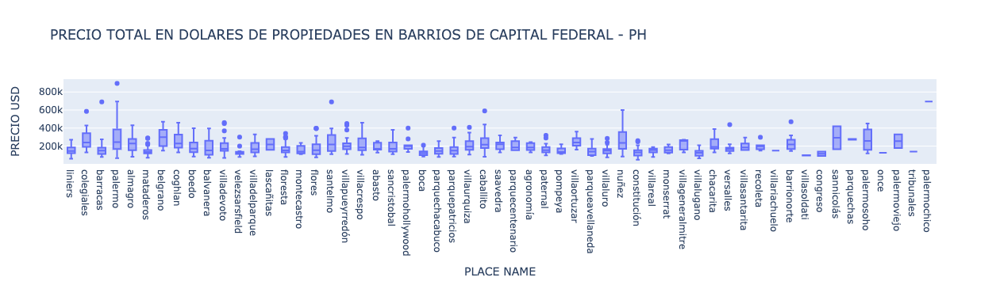

In [283]:
df_ph_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='ph')]
fig = px.box(df_ph_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - PH')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [284]:
precio_outliers_ph_caba = ['colegiales','barracas','palermo','mataderos','villadevoto','velezsarsfield','floresta','flores','villapueyrredón','palermohollywood',
                           'boca','parquechacabuco','parquepatricios','villaurquiza','caballito','paternal','villaluro','nuñez','constitución','versalles','barrionorte']


for outliers in precio_outliers_ph_caba:
    q1 = df_ph_capitalfederal[df_ph_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_ph_capitalfederal[df_ph_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_ph_max = df_ph_capitalfederal[np.logical_and(df_ph_capitalfederal['PLACE NAME']==outliers, df_ph_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_ph_min = df_ph_capitalfederal[np.logical_and(df_ph_capitalfederal['PLACE NAME']==outliers, df_ph_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_ph_max)
    df = df.drop(index_outlier_ph_min)
    


In [285]:
df_ph_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='ph')]
df_ph_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,85.000,750.000,116.000,1114.000,926.000,892.000,1185.000,1184.000
mean,1.871,3.749,1065.379,99.435,131.760,1627.430,193538.397,192657.482
std,1.261,1.163,1157.697,46.416,69.466,571.576,95506.311,91138.805
min,1.000,1.000,1.000,48.000,23.000,500.000,50000.000,50000.000
25%,1.000,3.000,400.000,65.000,79.000,1179.811,132000.000,132000.000
50%,1.000,4.000,725.000,87.000,114.000,1539.580,168000.000,168000.000
75%,2.000,4.000,1500.000,120.000,164.000,2000.000,230000.000,230000.000
max,6.000,11.000,9000.000,400.000,550.000,3630.435,1185000.000,695000.000


In [286]:
# Sobre el valor de las expensas, dropeamos los valores inferiores al quantil del 10%

q_expensas_caba=df_ph_capitalfederal.expenses.quantile(0.10)

index_expensas_mal_cargadas=df_ph_capitalfederal[df_ph_capitalfederal.expenses < q_expensas_caba].index

df = df.drop(index_expensas_mal_cargadas)

#### Stores - usd

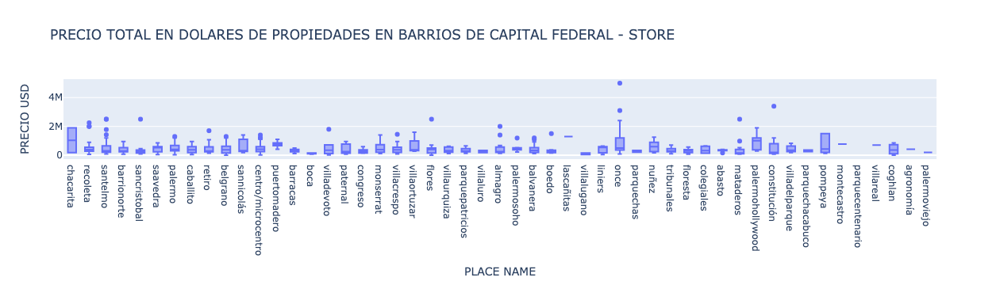

In [287]:
df_stores_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')]

fig = px.box(df_stores_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - STORE')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [288]:
precio_outliers_store_caba = ['recoleta','santelmo','sancristobal','palermo','retiro','sannicolás','centro/microcentro','paternal','villacrespo','flores',
                              'almagro','palermosoho','balvanera','boedo','once','mataderos','constitución']


for outliers in precio_outliers_store_caba:
    q1 = df_stores_capitalfederal[df_stores_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_stores_capitalfederal[df_stores_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_store_max = df_stores_capitalfederal[np.logical_and(df_stores_capitalfederal['PLACE NAME']==outliers, df_stores_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_store_min = df_stores_capitalfederal[np.logical_and(df_stores_capitalfederal['PLACE NAME']==outliers, df_stores_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_store_max)
    df = df.drop(index_outlier_store_min)
    


In [289]:
df_stores_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')]
df_stores_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,3.000,21.000,89.000,562.000,580.000,502.000,580.000,576.000
mean,2.667,2.286,3800.573,213.319,199.407,2624.501,473386.003,416182.099
std,1.155,2.901,3558.342,263.899,156.282,1976.848,758146.320,305547.964
min,2.000,1.000,400.000,48.000,30.000,39.950,19900.000,5608.360
25%,2.000,1.000,1250.000,90.000,90.000,1400.000,210000.000,209750.000
50%,2.000,1.000,3000.000,144.000,149.000,2142.857,334000.000,330000.000
75%,3.000,1.000,5000.000,247.000,248.500,3201.119,550000.000,550000.000
max,4.000,10.000,19000.000,3250.000,894.000,22000.000,12581296.000,1900000.000


In [290]:
df_stores_capitalfederal.sort_values('PRECIO USD')[:10]\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
47971,58.000,58.000,96.696,5608.360,excelentelocalenventaconrentaenflores
71811,70.000,70.000,128.191,8973.380,ventafondodecomercioenbelgrano
71824,70.000,70.000,128.191,8973.380,ventafondodecomercioencoghlan
21649,365.000,365.000,39.950,14581.750,importantelocalensubsueloconentradaindependien...
71449,NaN,NaN,NaN,19900.000,fondodecomercio-villadevoto
76111,230.000,270.000,105.556,28500.000,ventafondodecomercioenlascañitas
4789,300.000,300.000,116.667,35000.000,localenventa
49509,NaN,NaN,NaN,45000.000,fondodecomercio-saavedra
69244,NaN,30.000,1500.000,45000.000,localenzonacomercial1rajunta
13043,NaN,NaN,NaN,48000.000,localc/fondodecomercioenlugano1y2


In [291]:
# Precio minimo de store, 45000 usd

index_precio_usd_mal=df_stores_capitalfederal[df_stores_capitalfederal['PRECIO USD'] < 45000].index 

df = df.drop(index_precio_usd_mal)

In [292]:
index_precio_usd=df_stores_capitalfederal.sort_values('PRECIO USD', ascending = False)[:20].index

df_stores_capitalfederal.sort_values('PRECIO USD', ascending = False)[:20]\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','PLACE NAME','description']]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,PLACE NAME,description
76392,NaN,NaN,NaN,1900000.000,localenventaenpalermohollywood,palermohollywood,"localenventa,desarrolladoen2plantasconterrazal..."
50155,1190.000,NaN,NaN,1900000.000,excelentedepósitode1200m2conoficinas,chacarita,capitalfederal-chacarita-código0296ivrdepósito...
48297,480.000,480.000,3750.000,1800000.000,ventadelocalenesquinaenpreconstrucciónenlaentr...,villadevoto,excelentelocalendoblealturaubicadoenlaesquinad...
50064,750.000,750.000,2133.333,1600000.000,depósitode750m2amtsavtriunvirato,villaortuzar,"capitalfederal,villaortúzar-código0296depósito..."
50331,3250.000,NaN,NaN,1500000.000,edificio3250m2c/oficinas+depósitosenpolotecnol...,pompeya,capitalfederal-pompeya-código0047lvedificiodeo...
50323,3250.000,NaN,NaN,1500000.000,edificio3250m2c/oficinas+depósitosenpolotecnol...,pompeya,capitalfederal-pompeya-código0047eedificiodeof...
75958,289.000,334.000,4491.018,1500000.000,local-palermohollywood,palermohollywood,excelentelocalgastronómicoenventaconrentaentre...
38792,450.000,450.000,3111.111,1400000.000,exentidadbancaria-localcon20mdefrente(tienebov...,monserrat,frentealhotelinternacionalydelatorredeirsayrod...
33818,273.000,287.000,4878.049,1400000.000,"¨localenventasobrecarlospellegrinial100,caba¨",sannicolás,"¨localenventasobrecarlospellegrinial100,caba¨u..."
45950,NaN,450.000,3111.111,1400000.000,localenventa,monserrat,localfrentealhotelinternacionalydelatorredeirs...


In [293]:
# El 3er index, se trata de un valor muy elevado segun zonaprops.
# El 4er index, se trata de un local sin terminar de construir.
# El 8vo index, aun esta en construccion
# Los indices 11 y 12, son duplicados, y tienen un precio superior a su zona.
# El indice 7050, son 2 locales juntos.

df = df.drop(index_precio_usd[2])
df = df.drop(index_precio_usd[3])
df = df.drop(index_precio_usd[4])
df = df.drop(index_precio_usd[5])
df = df.drop(index_precio_usd[7])
df = df.drop(index_precio_usd[10])
df = df.drop(index_precio_usd[11])
df = df.drop(index_precio_usd[14])
df = df.drop(index_precio_usd[15])

In [294]:
index_sup_grande = df_stores_capitalfederal.sort_values('SUPERFICIE TOTAL EN M2', ascending = False)[:7].index

df_stores_capitalfederal.sort_values('SUPERFICIE TOTAL EN M2', ascending = False)[:7]\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','PLACE NAME','description']]
   

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,PLACE NAME,description
38794,894.000,894.000,1454.139,1300000.000,esquinahipolitoyrigoyen--excelentesvidrieras,monserrat,amtsdeavdademayo(sevemuybiendesdelaavenidayaqu...
45951,894.000,894.000,1454.139,1300000.000,localenventa,monserrat,localamtsdeavdademayo(sevemuybiendesdelaavenid...
46676,890.000,890.000,1292.135,1150000.000,local450m2+subsenplenofocotradicionaldelcentro...,monserrat,"¨localenventa,callepiedrasal100,caba¨ubicacion..."
78226,820.000,820.000,1463.415,1200000.000,"propiedadcomercialenblockoseparado,doblefrente...",constitución,propiedadcomercialenventacompuestapordosunidad...
33269,811.000,811.000,1171.393,950000.000,localde811m2zonificación:aph1,monserrat,estapropiedadhasidodiseñadaporelarquitectoalej...
56115,800.000,800.000,975.000,780000.000,edificiocomercial-balvanera,balvanera,"excelentephen2plantas,18habitaciones-5baños-en..."
45955,800.000,800.000,625.000,500000.000,negocioenventa,once,hotelconpropiedad--600m2aproximadosson3pisos--...


#### Duplex/Triplex - usd

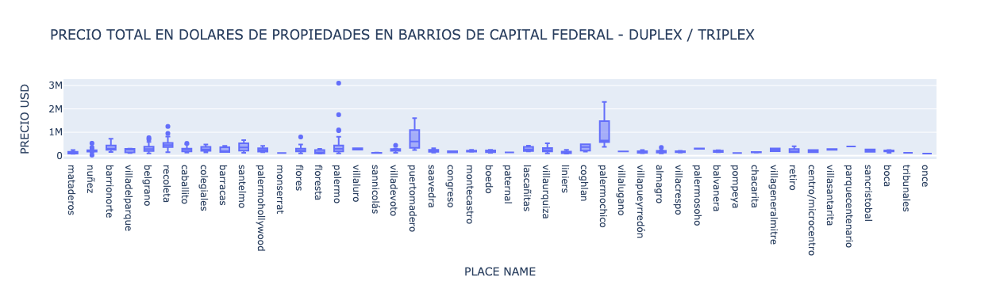

In [295]:
df_duplex_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='duplex/triplex')]
fig = px.box(df_duplex_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - DUPLEX / TRIPLEX')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [296]:
precio_outliers_duplex_caba = ['nuñez','recoleta','caballito','flores','palermo','villadevoto','liniers','almagro']


for outliers in precio_outliers_duplex_caba:
    q1 = df_duplex_capitalfederal[df_duplex_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_duplex_capitalfederal[df_duplex_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_duplex_max = df_duplex_capitalfederal[np.logical_and(df_duplex_capitalfederal['PLACE NAME']==outliers, df_duplex_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_duplex_min = df_duplex_capitalfederal[np.logical_and(df_duplex_capitalfederal['PLACE NAME']==outliers, df_duplex_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_duplex_max)
    df = df.drop(index_outlier_duplex_min)
    


In [297]:
df_duplex_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='duplex/triplex')]
df_duplex_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,47.000,262.000,81.000,392.000,305.000,292.000,406.000,406.000
mean,5.809,3.271,3995.062,98.719,110.626,2647.902,336579.919,293013.528
std,4.271,1.171,3134.439,44.834,50.277,979.290,586763.220,214585.542
min,1.000,1.000,10.000,48.000,48.000,900.000,82000.000,82000.000
25%,2.500,2.000,1800.000,63.000,70.000,1990.476,171250.000,171250.000
50%,5.000,3.000,3000.000,84.000,95.000,2478.932,237000.000,237000.000
75%,9.000,4.000,6000.000,129.000,142.000,3000.000,340000.000,339000.000
max,15.000,8.000,17000.000,290.000,350.000,6611.111,9435376.000,2300000.000


#### Piso/Penthouses - usd

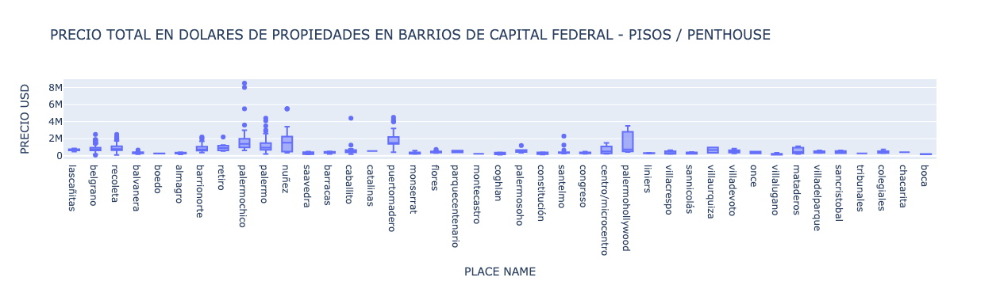

In [298]:
df_pisos_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')]
fig = px.box(df_pisos_capitalfederal, y = "PRECIO USD", x='PLACE NAME'\
             ,title= ' PRECIO TOTAL EN DOLARES DE PROPIEDADES EN BARRIOS DE CAPITAL FEDERAL - PISOS / PENTHOUSE')

fig.show()

Vamos a optar por dropear los valores de superficie mayores a q(75) + 1.5 RIC y menores a q(25) - 1.5 RIC, para los barrios de caba donde haya outliers, dado que son valores muy extremos de superficie, y son casos excepcionales, poco comunes y poco representativos para darnos informacion sobre el PRECIO USD POR M2 de un inmueble en esa zona.


In [299]:
precio_outliers_pisos_caba = ['belgrano','recoleta','barrionorte','retiro','palermochico','palermo','nuñez','caballito','puertomadero','palermosoho','centro/microcentro',
                              'santelmo']


for outliers in precio_outliers_pisos_caba:
    q1 = df_pisos_capitalfederal[df_pisos_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.25)
    q3 = df_pisos_capitalfederal[df_pisos_capitalfederal['PLACE NAME']==outliers]['PRECIO USD'].quantile(.75)
    RIC = q3-q1
    
    index_outlier_pisos_max = df_pisos_capitalfederal[np.logical_and(df_pisos_capitalfederal['PLACE NAME']==outliers, df_pisos_capitalfederal['PRECIO USD'] > q3 + 1.5 * RIC)].index    
    index_outlier_pisos_min = df_pisos_capitalfederal[np.logical_and(df_pisos_capitalfederal['PLACE NAME']==outliers, df_pisos_capitalfederal['PRECIO USD'] < q1 - 1.5 * RIC)].index
    
    df = df.drop(index_outlier_pisos_max)
    df = df.drop(index_outlier_pisos_min)
    


In [300]:
df_pisos_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')]
df_pisos_capitalfederal.describe().iloc[:,10:]

,floor,rooms,expenses,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,PRECIO USD
count,65.000,488.000,275.000,762.000,707.000,634.000,725.000,725.000
mean,4.369,5.240,12375.884,237.772,266.438,3213.051,840556.074,838553.506
std,3.426,1.639,7618.136,79.694,76.500,1740.467,522997.788,523088.600
min,1.000,2.000,850.000,48.000,68.000,268.470,110000.000,89937.580
25%,1.000,4.000,7000.000,193.000,220.000,2117.324,488000.000,480000.000
50%,4.000,5.000,11800.000,227.000,245.000,2846.911,705000.000,700000.000
75%,6.000,6.000,16000.000,280.750,304.000,3875.000,1057000.000,1050000.000
max,14.000,14.000,70000.000,639.000,666.000,12796.209,3500000.000,3500000.000


In [301]:
index_sup_cuv = df_pisos_capitalfederal.sort_values('SUPERFICIE CUBIERTA EN M2',ascending = False)[:5].index
df_pisos_capitalfederal.sort_values('SUPERFICIE CUBIERTA EN M2',ascending = False)[:5]\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title']]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title
48788,639.000,639.000,624.413,399000.000,moreno1500
25754,623.000,NaN,NaN,420000.000,hotel/pensionenbalvaneraaptocredito
43686,611.000,666.000,NaN,NaN,eylepetrona300
34969,600.000,NaN,NaN,NaN,departamentoenventaenrecoleta
4369,587.000,587.000,5110.733,3000000.000,importantepenthouseeninmejorablezona


In [302]:
# Dropeo el primer indice, ya que el valor de sup cuv esta mal ingresado.

df = df.drop(index_sup_cuv[0])

In [303]:
index_precio_usd = df_pisos_capitalfederal.sort_values('PRECIO USD',ascending = False)[:5].index
df_pisos_capitalfederal.sort_values('PRECIO USD',ascending = False)[:5]\
    [['SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRECIO USD','title','PLACE NAME']]

,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRECIO USD,title,PLACE NAME
52955,300.000,330.000,10606.061,3500000.000,departamento-palermohollywood,palermohollywood
52313,NaN,455.000,7472.527,3400000.000,excelentepiso450m2entorrechateau,nuñez
52721,NaN,455.000,7472.527,3400000.000,espectacularpisoaltoentorrechteaulibertadorde4...,nuñez
44871,369.000,369.000,8672.087,3200000.000,venta5ambientesforumalcorta,nuñez
41537,250.000,250.000,12000.000,3000000.000,venta:semipisodegrancategoríaeimportantestermi...,palermochico


### Correlacion entre variables

**Vamos a seguir trabajando solo con capital federal y sus barrios**

##### CORRELACION EN APARTAMENTOS UBICADOS EN CAPITAL FEDERAL

In [304]:
corrientes = df[np.logical_and(df['place_name']=='capitalfederal',df['PLACE NAME']=='corrientes')].index
df.loc[corrientes,'PLACE NAME']='sannicolás'

In [305]:
sanjose=df[np.logical_and(df['place_name']=='capitalfederal',df['PLACE NAME']=='sanjose')].index
df.loc[sanjose,'place_name']='sanjose'


In [306]:
once=df[np.logical_and(df['state_name']=='capitalfederal',df['PLACE NAME']=='once')].index
df.loc[once,'PLACE NAME']='balvanera'

In [307]:
suipacha=df[np.logical_and(df['place_name']=='capitalfederal',df['PLACE NAME']=='suipacha')].index
df.loc[suipacha,'PLACE NAME']='monserrat'

In [308]:
lima=df[np.logical_and(df['place_name']=='capitalfederal',df['PLACE NAME']=='lima')].index
df.loc[lima,'PLACE NAME']='santarita'

In [309]:
florida=df[np.logical_and(df['place_name']=='capitalfederal',df['PLACE NAME']=='florida')].index
df.loc[florida,'state_name']='bsasgbazonanorte'


In [310]:
sanjos=df[np.logical_and(df['place_name']=='sanjose',df['PLACE NAME']=='sanjose')].index
df.loc[sanjos[:2],'state_name']='bsasgbazonasur'

### Variables Cuantitativas y Categoricas

Creamos la variable ZONAS COMUNALES, donde vamos a categorizar los distintos barrios de capital por las comunas donde se encuentran

In [311]:
comunas_dict={
'constitucion':'ZONA ESTE COMUNAL',
'catalinas':'ZONA ESTE COMUNAL',
'libertad':'ZONA ESTE COMUNAL',
'retiro':'ZONA ESTE COMUNAL',
'sannicolás':'ZONA ESTE COMUNAL',
'puertomadero':'ZONA ESTE COMUNAL',
'santelmo':'ZONA ESTE COMUNAL',
'montserrat':'ZONA ESTE COMUNAL',
'monserrat':'ZONA ESTE COMUNAL',
'constitución':'ZONA ESTE COMUNAL',
'centro/microcentro':'ZONA ESTE COMUNAL',
'centro':'ZONA ESTE COMUNAL',
'tribunales':'ZONA ESTE COMUNAL',
'sannicolás':'ZONA ESTE COMUNAL',
'recoleta':'ZONA ESTE COMUNAL',
'barrionorte':'ZONA ESTE COMUNAL',
'billinghurst':'ZONA ESTE COMUNAL',
'balvanera':'ZONA ESTE COMUNAL',
'sancristobal':'ZONA ESTE COMUNAL',
'abasto':'ZONA ESTE COMUNAL',
'congreso':'ZONA ESTE COMUNAL',
'sarmiento':'ZONA ESTE COMUNAL',
'once':'ZONA ESTE COMUNAL',
'corrientes':'ZONA ESTE COMUNAL',
'boca':"ZONA SUR COMUNAL",
'barracas':"ZONA SUR COMUNAL",
'parquepatricios':"ZONA SUR COMUNAL",
'pompeya':"ZONA SUR COMUNAL",
'catalinas':"ZONA SUR COMUNAL",
'almagro':"ZONA CENTRO COMUNAL",
'boedo':"ZONA CENTRO COMUNAL",
'donbosco':"ZONA CENTRO COMUNAL",
'caballito':"ZONA CENTRO COMUNAL",
'parquecentenario':"ZONA CENTRO COMUNAL",
'flores':"ZONA CENTRO COMUNAL",
'parquechacabuco':"ZONA CENTRO COMUNAL",
'rivadavia':"ZONA CENTRO COMUNAL",
'villasoldati':"ZONA SUR COMUNAL",
'villariachuelo':"ZONA SUR COMUNAL",
'villalugano':"ZONA SUR COMUNAL",
'liniers':"ZONA OESTE COMUNAL",
'mataderos':"ZONA OESTE COMUNAL",
'parqueavellaneda':"ZONA OESTE COMUNAL",
'villareal':"ZONA OESTE COMUNAL",
'montecastro':"ZONA OESTE COMUNAL", 
'versalles':"ZONA OESTE COMUNAL", 
'floresta':"ZONA OESTE COMUNAL", 
'velezsarsfield':"ZONA OESTE COMUNAL",
'villaluro':"ZONA OESTE COMUNAL",
'villageneralmitre':"ZONA OESTE COMUNAL", 
'villadevoto':"ZONA OESTE COMUNAL", 
'villadelparque':"ZONA OESTE COMUNAL",
'villasantarita':"ZONA OESTE COMUNAL",
'santarita':"ZONA OESTE COMUNAL",
'coghlan':"ZONA NORTE COMUNAL",
'saavedra':"ZONA NORTE COMUNAL",
'villaurquiza':"ZONA NORTE COMUNAL",
'villapueyrredón':"ZONA NORTE COMUNAL",
'nuñez':"ZONA NORTE COMUNAL",
'belgrano':"ZONA NORTE COMUNAL",
'colegiales':"ZONA NORTE COMUNAL",
'palermo':"ZONA NORTE COMUNAL",
'lasheras':"ZONA NORTE COMUNAL",
'palermochico':"ZONA NORTE COMUNAL",
'palermohollywood':"ZONA NORTE COMUNAL",
'palermoviejo':"ZONA NORTE COMUNAL",
'palermosoho':"ZONA NORTE COMUNAL",
'lascañitas':"ZONA NORTE COMUNAL",
'chacarita':"ZONA NORTE COMUNAL",
'villacrespo':"ZONA NORTE COMUNAL",
'paternal':"ZONA NORTE COMUNAL",
'villaortuzar':"ZONA NORTE COMUNAL",
'agronomía':"ZONA NORTE COMUNAL",
'parquechas':"ZONA NORTE COMUNAL",
}


# comunas 12 13 14 15 grupo norte
# comunas 9, 10 y 11 grupo oeste
# comunas 8 y 4 grupo sur
# comunas 1, 2 y 3 grupo este
# comunas 5,6 y 7 grupo centro


df_capitalfederal = df.loc[df.state_name=='capitalfederal']
zonas_comunas_serie = df_capitalfederal['PLACE NAME'].replace(comunas_dict)
df['ZONAS COMUNALES']=zonas_comunas_serie
df['AMBIENTES']=df['rooms']

In [312]:
def correlation_plotter(data_to_plot,cols_to_plot):
    g = sns.PairGrid(data_to_plot, vars=cols_to_plot, hue='ZONAS COMUNALES' ,palette='bright')
    g.map(plt.scatter, alpha=0.6)
    g.add_legend();
    plt.show()

In [313]:
df_corr_capitalfederal_apartment = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='apartment')][['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','floor','rooms','expenses','PLACE NAME','ZONAS COMUNALES']]
df_corr_capitalfederal_apartment.corr()

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,SUPERFICIE CUBIERTA EN M2,floor,rooms,expenses
PRECIO USD POR M2,1.000,0.706,0.082,0.164,0.219,-0.106,0.394
PRECIO USD,0.706,1.000,0.695,0.696,0.182,0.323,0.718
SUPERFICIE TOTAL EN M2,0.082,0.695,1.000,0.916,0.062,0.606,0.591
SUPERFICIE CUBIERTA EN M2,0.164,0.696,0.916,1.000,0.026,0.639,0.615
floor,0.219,0.182,0.062,0.026,1.000,-0.018,0.191
rooms,-0.106,0.323,0.606,0.639,-0.018,1.000,0.380
expenses,0.394,0.718,0.591,0.615,0.191,0.380,1.000


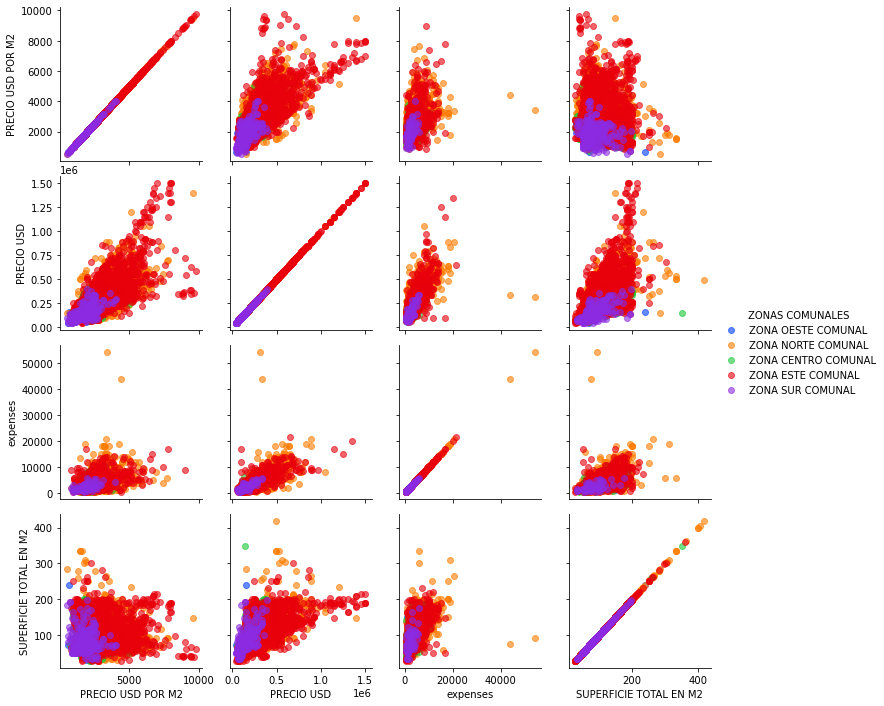

In [314]:
correlation_plotter(df_corr_capitalfederal_apartment,['PRECIO USD POR M2','PRECIO USD','expenses','SUPERFICIE TOTAL EN M2'])

Queremos observar que variables guardan una relacion lineal, con nuestra variable objetivo PRECIO USD POR M2

Conclusiones DEPARTAMENTOS:
  
   * Las zonas comunales Norte y Este son las que presentan los departamentos mas caros, mientras que la Zona comunal Sur, es la que presenta los mas                economicos.
   
   * Las Zona comunales Norte y Este, tambien son los que presentan los departamentos con mas SUPERFICIE TOTAL EN M2.

   * Podemos ver que logicamente hay una correlacion `POSITIVA` con el PRECIO USD.
   
   * Podemos ver que hay una correlacion `POSITIVA` con el valor de las EXPENSAS del departamento, departamentos ubicados en zonas mas costosas o que tienen        mas amenities, suelen tener un PRECIO USD POR M2 mayor.
   
   * Podemos ver que hay una correlacion `POSITIVA` con el valor de SUPERFICIE del departamento.

##### CORRELACION EN CASAS UBICADAS EN CAPITAL FEDERAL

In [315]:
df_corr_capitalfederal_houses = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='house')][['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','rooms','expenses','PLACE NAME','ZONAS COMUNALES']]
df_corr_capitalfederal_houses.corr()

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,SUPERFICIE CUBIERTA EN M2,rooms,expenses
PRECIO USD POR M2,1.000,0.691,-0.089,0.105,0.008,0.439
PRECIO USD,0.691,1.000,0.574,0.658,0.396,-0.963
SUPERFICIE TOTAL EN M2,-0.089,0.574,1.000,0.842,0.375,-0.528
SUPERFICIE CUBIERTA EN M2,0.105,0.658,0.842,1.000,0.549,-0.951
rooms,0.008,0.396,0.375,0.549,1.000,NaN
expenses,0.439,-0.963,-0.528,-0.951,NaN,1.000


In [316]:
drop=df_corr_capitalfederal_houses[df_corr_capitalfederal_houses['PLACE NAME']=='sanjose'].index
df=df.drop(drop)

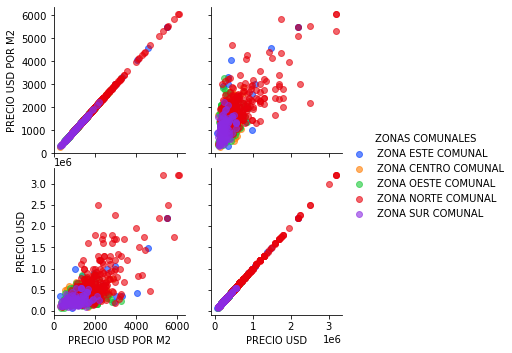

In [317]:
correlation_plotter(df_corr_capitalfederal_houses,['PRECIO USD POR M2','PRECIO USD'])

Queremos observar que variables guardan una relacion lineal, con nuestra variable objetivo PRECIO USD POR M2

Conclusiones CASAS:

   * Al igual que con los departamentos, las casas mas caras, las encontramos en la Zona Comunal Norte.

   * Podemos ver que logicamente hay una correlacion `POSITIVA` con el PRECIO USD.
   

##### CORRELACION EN PHs UBICADOS EN CAPITAL FEDERAL

In [318]:
df_corr_capitalfederal_ph = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='ph')][['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','rooms','expenses','PLACE NAME','ZONAS COMUNALES']]
df_corr_capitalfederal_ph.corr()

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,SUPERFICIE CUBIERTA EN M2,rooms,expenses
PRECIO USD POR M2,1.000,0.219,-0.473,-0.343,-0.275,0.102
PRECIO USD,0.219,1.000,0.691,0.660,0.487,0.255
SUPERFICIE TOTAL EN M2,-0.473,0.691,1.000,0.853,0.618,0.202
SUPERFICIE CUBIERTA EN M2,-0.343,0.660,0.853,1.000,0.626,0.315
rooms,-0.275,0.487,0.618,0.626,1.000,0.097
expenses,0.102,0.255,0.202,0.315,0.097,1.000


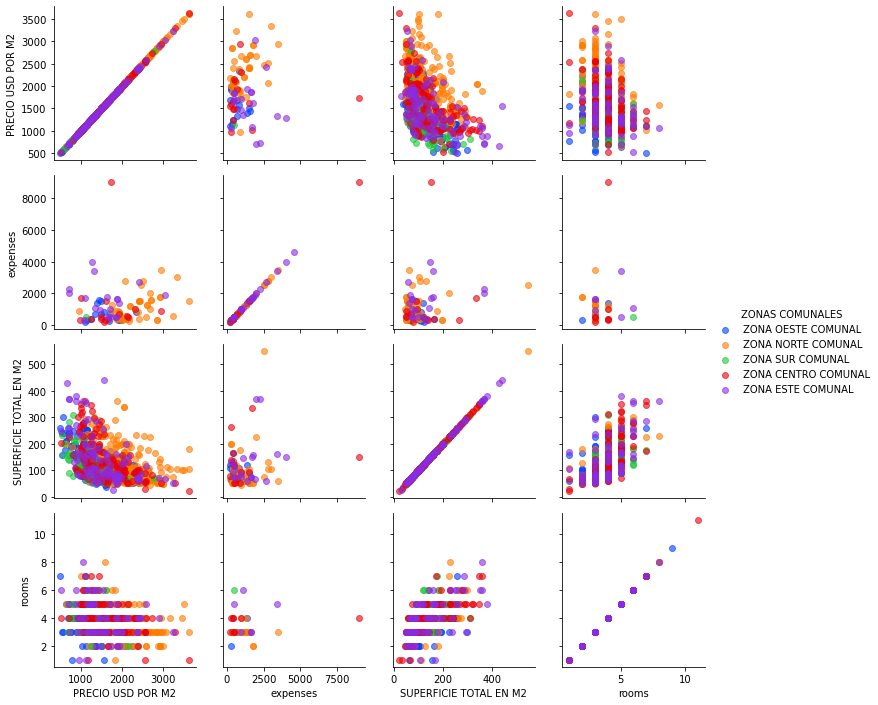

In [319]:
correlation_plotter(df_corr_capitalfederal_ph,['PRECIO USD POR M2','expenses','SUPERFICIE TOTAL EN M2','rooms'])

Queremos observar que variables guardan una relacion lineal, con nuestra variable objetivo PRECIO USD POR M2

Conclusiones PHs:
   
   * Los PH que mayores EXPENSAS pagan, se encuentran en la ZONA ESTE COMUNAL y la ZONA NORTE COMUNAL.
   
   * Los PH de mayores dimensiones los encontramos en la ZONA ESTE COMUNAL y la ZONA NORTE COMUNAL.
   
   * Podemos ver que hay una correlacion `NEGATIVA` entre el PRECIO USD POR M2 y las SUPERFICIES que ocupa el PH, a medida que aumentan las dimensiones de los      PH, el PRECIO USD POR M2, va disminuyendo.
    
   * Podemos ver que hay una correlacion `NEGATIVA` entre el PRECIO USD POR M2 y la cantidad de ambientes del PH, lo cual esta relacionado con la conclusion        anterior sobre las dimensiones del PH.
   
   * Podemos ver que hay una correlacion `POSITIVA` entre el PRECIO USD POR M2 y las EXPENSAS que paga el PH, esto se debe probablemente, porque                    PHs ubicados en zonas mas costosas pagan mayores expensas.

##### CORRELACION EN STORES UBICADOS EN CAPITAL FEDERAL

In [320]:
df_corr_capitalfederal_stores = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='store')][['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','rooms','expenses','PLACE NAME','ZONAS COMUNALES']]
df_corr_capitalfederal_stores.corr()

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,SUPERFICIE CUBIERTA EN M2,rooms,expenses
PRECIO USD POR M2,1.000,0.415,-0.358,-0.355,-0.403,-0.086
PRECIO USD,0.415,1.000,0.532,0.537,-0.067,0.218
SUPERFICIE TOTAL EN M2,-0.358,0.532,1.000,0.985,0.538,0.554
SUPERFICIE CUBIERTA EN M2,-0.355,0.537,0.985,1.000,0.489,0.550
rooms,-0.403,-0.067,0.538,0.489,1.000,1.000
expenses,-0.086,0.218,0.554,0.550,1.000,1.000


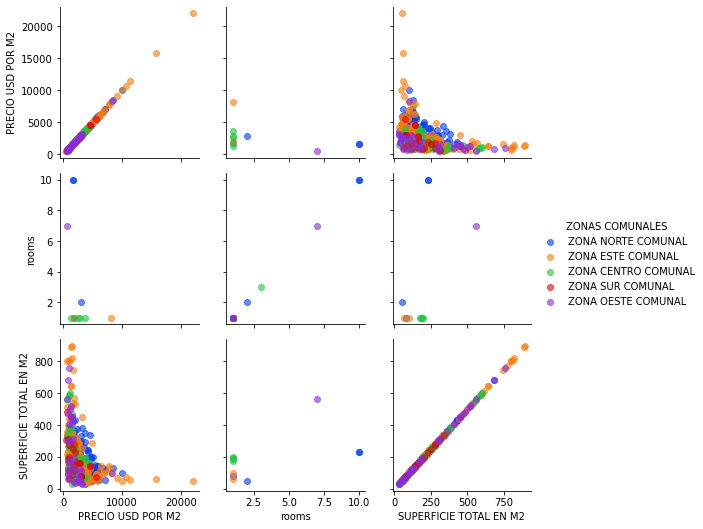

In [321]:
correlation_plotter(df_corr_capitalfederal_stores,['PRECIO USD POR M2','rooms','SUPERFICIE TOTAL EN M2'])

Queremos observar que variables guardan una relacion lineal, con nuestra variable objetivo PRECIO USD POR M2

Conclusiones STORES:

   * Pareciera haber una correlacion `NEGATIVA` entre el PRECIO USD POR M2 y la SUPERFICIE, Stores de mayores superficies, su PRECIO USD POR M2 va                  disminuyendo.
   
   * Pareciera haber una correlacion `NEGATIVA` entre el PRECIO USD POR M2 y la cantidad de AMBIENTES del STORE, pero al ser una cantidad pequeña de datos, hay      que tener cuidado con esta conclusion, puede no ser representativa.

##### CORRELACION EN PISOS/SEMI-PISOS/PENTHOUSES UBICADOS EN CAPITAL FEDERAL

In [322]:
df_corr_capitalfederal_pisos = df[np.logical_and(df.state_name=='capitalfederal',df['TIPO DE PROPIEDAD']=='piso/penthouse')][['PRECIO USD POR M2','PRECIO USD','SUPERFICIE TOTAL EN M2','SUPERFICIE CUBIERTA EN M2','rooms','expenses','PLACE NAME','ZONAS COMUNALES']]
df_corr_capitalfederal_pisos.corr()

,PRECIO USD POR M2,PRECIO USD,SUPERFICIE TOTAL EN M2,SUPERFICIE CUBIERTA EN M2,rooms,expenses
PRECIO USD POR M2,1.000,0.882,0.044,0.225,-0.147,0.463
PRECIO USD,0.882,1.000,0.444,0.477,0.001,0.525
SUPERFICIE TOTAL EN M2,0.044,0.444,1.000,0.799,0.294,0.267
SUPERFICIE CUBIERTA EN M2,0.225,0.477,0.799,1.000,0.431,0.423
rooms,-0.147,0.001,0.294,0.431,1.000,0.078
expenses,0.463,0.525,0.267,0.423,0.078,1.000


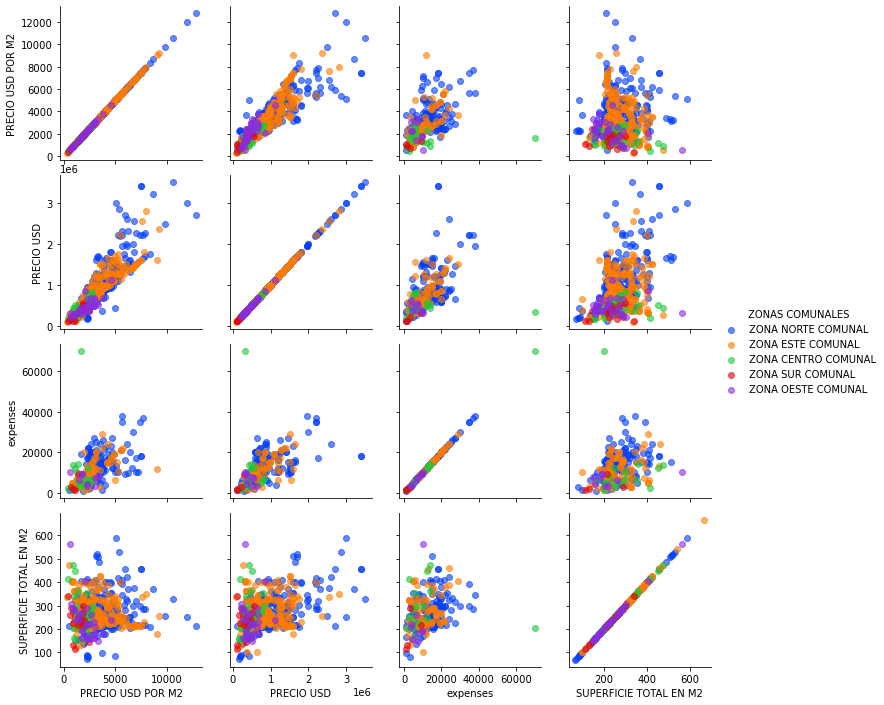

In [323]:
correlation_plotter(df_corr_capitalfederal_pisos,['PRECIO USD POR M2','PRECIO USD','expenses','SUPERFICIE TOTAL EN M2'])

Queremos observar que variables guardan una relacion lineal, con nuestra variable objetivo PRECIO USD POR M2

Conclusiones PISOS/SEMI-PISOS/PENTHOUSES:

   * Los PISOS mas costosos, se encuentran en la ZONA NORTE COMUNAL
   
   * Los PISOS que mayor costos de expensas tienen, se encuentran en la ZONA NORTE COMUNAL.
   
   * Los PISOS de mayores dimensiones se encuentran en la ZONA ESTE COMUNAL.

   * Podemos ver que hay una correlacion `POSITIVA` con el PRECIO USD.
   
   * Podemos ver que hay una correlacion `POSITIVA` con el valor de las EXPENSAS del PISO, inmuebles ubicados en zonas mas costosas o que tienen mas amenities,      suelen tener un PRECIO USD POR M2 mayor.
   
   * A diferencia de otras propiedades, donde el PRECIO USD POR M2, disminuia conforme aumentaban las dimensiones de la propiedad, en este caso, podemos ver        que hay una correlacion `POSITIVA` entre las SUPERFICIES y el PRECIO USD POR M2, similar a lo que ocurre con los apartamentos, al aumentar la superficie        del inmueble, el PRECIO USD POR M2, tiene a aumentar.


<a id="8"></a> 
## 8) Analisis y Operacion Sobre Datos Faltantes
[Ir a índice](#indice)

Seguimos trabajando solamente sobre los inmuebles ubicados en capital federal

In [324]:
df_sin_imputar = df[df.state_name=='capitalfederal']

In [325]:
df[df.state_name=='capitalfederal'][['PLACE NAME','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRICE','CURRENCY','PRECIO USD','TIPO DE PROPIEDAD']]\
.isnull().sum()/df[df.state_name=='capitalfederal'].shape[0]*100


PLACE NAME                0.000
SUPERFICIE TOTAL EN M2   21.151
PRECIO USD POR M2        28.058
PRICE                     6.566
CURRENCY                  6.566
PRECIO USD                6.839
TIPO DE PROPIEDAD         0.000
dtype: float64

En primer lugar, vemos si podemos imputar algunos valores de PRECIO USD POR M2, a partir de SUPERFICIE TOTAL EN M2 y PRECIO USD, vamos a seguir la siguiente logica de operacion.

1 PRECIO USD = PRECIO USD POR M2 * SUPERFICIE TOTAL EN M2

2 SUPERFICIE TOTAL EN M2 = PRECIO USD / PRECIO USD POR M2

3 PRECIO USD POR M2 = PRECIO USD / SUPERFICIE TOTAL EN M2

In [326]:
df_PRECIO_USD_NULL_CAPITAL_FED_mask=np.logical_and(df.state_name=='capitalfederal',df['PRECIO USD'].isnull())

df.loc[df_PRECIO_USD_NULL_CAPITAL_FED_mask,'PRECIO USD'] = df[['PRECIO USD POR M2','SUPERFICIE TOTAL EN M2']].apply(lambda x: x['PRECIO USD POR M2']* x['SUPERFICIE TOTAL EN M2'], axis=1)


In [327]:
df_SUPERFICIE_TOTAL_EN_M2_NULL_CAPITAL_FED_mask=np.logical_and(df.state_name=='capitalfederal',df['SUPERFICIE TOTAL EN M2'].isnull())

df.loc[df_SUPERFICIE_TOTAL_EN_M2_NULL_CAPITAL_FED_mask,'SUPERFICIE TOTAL EN M2'] = df[['PRECIO USD','PRECIO USD POR M2']].apply(lambda x: x['PRECIO USD']* x['PRECIO USD POR M2'], axis=1)

In [328]:
df_PRECIO_USD_POR_M2_NULL_CAPITAL_FED_mask=np.logical_and(df.state_name=='capitalfederal',df['PRECIO USD POR M2'].isnull())

df.loc[df_PRECIO_USD_POR_M2_NULL_CAPITAL_FED_mask,'PRECIO USD POR M2'] = df[['PRECIO USD','SUPERFICIE TOTAL EN M2']].apply(lambda x: x['PRECIO USD']/x['SUPERFICIE TOTAL EN M2'], axis=1)

In [329]:
df[df.state_name=='capitalfederal'][['PLACE NAME','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRICE','CURRENCY','PRECIO USD','TIPO DE PROPIEDAD']]\
.isnull().sum()/df[df.state_name=='capitalfederal'].shape[0]*100

PLACE NAME                0.000
SUPERFICIE TOTAL EN M2   21.151
PRECIO USD POR M2        26.704
PRICE                     6.566
CURRENCY                  6.566
PRECIO USD                6.839
TIPO DE PROPIEDAD         0.000
dtype: float64

Logramos bajar un 1.3% aproximadamente la cantidad de NaN values en PRECIO USD POR M2

Ahora vamos a buscar imputar SUPERFICIE TOTAL EN M2, a partir de las medianas de las superficies agrupando por tipo de propiedad y zona.

### IMPUTACION DE SUPERFICIE TOTAL EN M2 - DEPARTAMENTOS

In [330]:
df_departamentos_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal', df['TIPO DE PROPIEDAD']=='apartment')]

superficie_total_departamentos_groupby_place_name_mean=df_departamentos_capitalfederal.groupby('PLACE NAME').mean()['SUPERFICIE TOTAL EN M2']
superficie_total_departamentos_groupby_place_name_mean

PLACE NAME
abasto                77.526
agronomía             66.222
almagro               78.131
balvanera             82.841
barracas              90.304
barrionorte          102.479
belgrano             101.896
boca                  77.800
boedo                 85.737
caballito             90.027
centro/microcentro    82.778
chacarita             71.351
coghlan               82.767
colegiales            74.212
congreso              93.185
constitución          65.706
flores                80.590
floresta              75.797
lascañitas           106.116
liniers               65.058
mataderos             78.692
monserrat             71.444
montecastro           58.500
nuñez                 84.233
palermo               96.203
palermochico         128.402
palermohollywood      81.479
palermosoho           84.106
palermoviejo         126.611
parqueavellaneda      62.875
parquecentenario      99.611
parquechacabuco       71.875
parquechas            75.000
parquepatricios       75.644
pat

Vemos que hay 1 valor de superficie con NaN value VILLARIACHUELO

In [331]:
index_riachuelo = df_departamentos_capitalfederal[df_departamentos_capitalfederal['PLACE NAME']=='villariachuelo'].index
df_departamentos_capitalfederal[df_departamentos_capitalfederal['PLACE NAME']=='villariachuelo']


,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,ZONAS COMUNALES,AMBIENTES
37502,sell,apartment,villariachuelo,|argentina|capitalfederal|villariachuelo|,argentina,capitalfederal,3427379.000,"-34698136,-58470461",-34.698,-58.470,85000.000,usd,1499782.500,85000.000,NaN,60.000,NaN,1416.667,12.000,3.000,NaN,http://wwwproperaticomar/19e48_venta_departame...,corredorresponsable:soniaelvirawunderlich-csi5...,ventadepartamento3ambientesvillacelina,https://thumbs4properaticom/5/lj1l7nvhaaxghfnj...,villariachuelo,60.000,NaN,NaN,85000.000,usd,85000.000,apartment,ZONA SUR COMUNAL,3.000


Observamos que se debe a que no tiene valor de SUPERFICIE TOTAL en el unico registro que existe de esa zona.

Debido a que se trata de un apartamento y las dimensiones cubiertas no suelen ser muy distintas a las totales, vamos a utilizar el valor de la SUPERFICE CUBIERTA

In [332]:
df.loc[index_riachuelo, 'SUPERFICIE TOTAL EN M2'] = df.loc[index_riachuelo, 'SUPERFICIE CUBIERTA EN M2']

In [333]:
df_departamentos_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal', df['TIPO DE PROPIEDAD']=='apartment')]

superficie_total_departamentos_groupby_place_name_mean=df_departamentos_capitalfederal.groupby('PLACE NAME').mean()['SUPERFICIE TOTAL EN M2']

In [334]:
df_departamentos_capital_SUP_TOTAL_null=df_departamentos_capitalfederal[df_departamentos_capitalfederal['SUPERFICIE TOTAL EN M2'].isnull()]
index_departamentos_capital_SUP_TOTAL_null = df_departamentos_capital_SUP_TOTAL_null.index
barrios_deptos_caba=df_departamentos_capitalfederal['PLACE NAME'].unique()

def imputador(PLACE_NAME):
    for barrios in barrios_deptos_caba:
        if barrios == PLACE_NAME:
            return superficie_total_departamentos_groupby_place_name_mean.loc[barrios]

df.loc[index_departamentos_capital_SUP_TOTAL_null,'SUPERFICIE TOTAL EN M2']=df_departamentos_capital_SUP_TOTAL_null['PLACE NAME'].apply(lambda x: imputador(x))

### IMPUTACION DE SUPERFICIE TOTAL EN M2 - CASAS

In [335]:
df_house_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal', df['TIPO DE PROPIEDAD']=='house')]

superficie_total_house_groupby_place_name_mean=df_house_capitalfederal.groupby('PLACE NAME').mean()['SUPERFICIE TOTAL EN M2']
superficie_total_house_groupby_place_name_mean

PLACE NAME
abasto                371.500
agronomía             295.667
almagro               347.192
balvanera             233.000
barracas              260.914
barrionorte           396.000
belgrano              439.674
boca                  359.750
boedo                 290.267
caballito             258.245
centro/microcentro    600.000
chacarita             192.600
coghlan               226.750
colegiales            268.071
constitución          236.250
flores                253.193
floresta              273.250
lascañitas            304.000
liniers               244.893
mataderos             261.725
monserrat             460.700
montecastro           156.600
nuñez                 318.577
palermo               373.500
palermochico          461.462
palermohollywood      504.400
palermosoho           318.375
palermoviejo          260.000
parqueavellaneda      248.429
parquechacabuco       293.765
parquechas            140.000
parquepatricios       258.615
paternal              237.545

Observamos que tenemos un NaN en parque chas, debido a que no tenemos valores de Superficie total, solo de superficie cubierta.

In [336]:
df_house_capitalfederal[df_house_capitalfederal['PLACE NAME']=='parquechas']

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,ZONAS COMUNALES,AMBIENTES
5509,sell,house,parquechas,|argentina|capitalfederal|parquechas|,argentina,capitalfederal,3430115.000,"-345850775,-584730493",-34.585,-58.473,310000.000,usd,5469795.000,310000.000,140.000,120.000,2214.286,2583.333,NaN,NaN,NaN,http://wwwproperaticomar/15xrj_venta_casa_parq...,"a2cuadrasavlosincas,avtriunviratoysubtelineabe...",lotepropio-idealparaedificio;fábrica;galpón-2c...,https://thumbs4properaticom/2/gxnrzmtmcr2oxapp...,parquechas,120.000,140.000,2214.286,310000.000,usd,310000.000,house,ZONA NORTE COMUNAL,NaN
16904,sell,house,parquechas,|argentina|capitalfederal|parquechas|,argentina,capitalfederal,3430115.000,"-34581357,-58478851",-34.581,-58.479,330000.000,usd,5822685.000,330000.000,NaN,180.000,NaN,1833.333,NaN,5.000,NaN,http://wwwproperaticomar/17h9g_venta_casa_parq...,corredorresponsable:marianoaufseher-cucicba425...,casaen3plantas3dormplayroomterrazaparrilla,https://thumbs4properaticom/0/7u5emcseuyoksd_l...,parquechas,180.000,NaN,NaN,330000.000,usd,330000.000,house,ZONA NORTE COMUNAL,5.000
30612,sell,house,parquechas,|argentina|capitalfederal|parquechas|,argentina,capitalfederal,3430115.000,"-34587768,-58480246",-34.588,-58.480,310000.000,usd,5469795.000,310000.000,NaN,138.000,NaN,2246.377,NaN,4.000,NaN,http://wwwproperaticomar/18t5z_venta_casa_parq...,corredorresponsable:unobienesraicessrl-cucicba...,casaventa,https://thumbs4properaticom/6/pgznuy8cjt3ilq_x...,parquechas,138.000,NaN,NaN,310000.000,usd,310000.000,house,ZONA NORTE COMUNAL,4.000
79578,sell,house,parquechas,|argentina|capitalfederal|parquechas|,argentina,capitalfederal,3430115.000,"-34589122,-58480973",-34.589,-58.481,269000.000,usd,4746370.500,269000.000,NaN,141.000,NaN,1907.801,NaN,6.000,NaN,http://wwwproperaticomar/1c5yq_venta_casa_parq...,corredorresponsable:martinmanias-cucicba6277co...,"casaenventa,parquechaslotepropio",https://thumbs4properaticom/2/sqzbdb7i0t7wmzs0...,parquechas,141.000,NaN,NaN,269000.000,usd,269000.000,house,ZONA NORTE COMUNAL,6.000


In [337]:
df_houses_capital_SUP_TOTAL_null=df_house_capitalfederal[df_house_capitalfederal['SUPERFICIE TOTAL EN M2'].isnull()]
index_houses_capital_SUP_TOTAL_null = df_houses_capital_SUP_TOTAL_null.index
barrios_houses_caba=df_house_capitalfederal['PLACE NAME'].unique()

def imputador(PLACE_NAME):
    for barrios in barrios_houses_caba:
        if barrios == PLACE_NAME:
            return superficie_total_house_groupby_place_name_mean.loc[barrios]

df.loc[index_houses_capital_SUP_TOTAL_null,'SUPERFICIE TOTAL EN M2']=df_houses_capital_SUP_TOTAL_null['PLACE NAME'].apply(lambda x: imputador(x))

### IMPUTACION DE SUPERFICIE TOTAL EN M2 - PHs

In [338]:
df_ph_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal', df['TIPO DE PROPIEDAD']=='ph')]

superficie_total_ph_groupby_place_name_mean=df_ph_capitalfederal.groupby('PLACE NAME').mean()['SUPERFICIE TOTAL EN M2']

superficie_total_ph_groupby_place_name_mean

PLACE NAME
abasto              121.500
agronomía           123.333
almagro             153.122
balvanera           140.238
barracas            136.067
barrionorte          88.500
belgrano            142.111
boca                104.875
boedo               172.650
caballito           146.689
chacarita           122.500
coghlan             137.100
colegiales          139.118
congreso             67.500
constitución        106.444
flores              124.140
floresta            121.211
lascañitas           82.500
liniers             124.833
mataderos           121.942
monserrat           121.500
montecastro         105.500
nuñez               133.533
palermo             154.981
palermohollywood    143.556
palermosoho         120.286
palermoviejo        131.500
parqueavellaneda    150.750
parquecentenario    127.500
parquechacabuco     131.727
parquechas          150.000
parquepatricios     113.842
paternal            101.000
pompeya             152.714
recoleta             85.600
saavedra 

Observamos que tenemos un NaN en sarmiento y villa soldati, debido a que no tenemos valores de Superficie total.

In [339]:
df_ph_capitalfederal[df_ph_capitalfederal['PLACE NAME']=='sarmiento']

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,ZONAS COMUNALES,AMBIENTES


In [340]:
df_ph_capitalfederal[df_ph_capitalfederal['PLACE NAME']=='villasoldati']

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,ZONAS COMUNALES,AMBIENTES
22229,sell,ph,villasoldati,|argentina|capitalfederal|villasoldati|,argentina,capitalfederal,3427366.000,"-3466244,-58448424",-34.662,-58.448,95000.000,usd,1676227.500,95000.000,NaN,78.000,NaN,1217.949,2.000,3.000,NaN,http://wwwproperaticomar/180kv_venta_ph_villa-...,corredorresponsable:martinmanias-cucicba6277co...,"departartamphp/pasillo,3ambsc/patioyterraza",https://thumbs4properaticom/2/tlcdhpek41-ji03h...,villasoldati,78.000,NaN,NaN,95000.000,usd,95000.000,ph,ZONA SUR COMUNAL,3.000
22445,sell,ph,villasoldati,|argentina|capitalfederal|villasoldati|,argentina,capitalfederal,3427366.000,"-346629128,-584439783",-34.663,-58.444,100000.000,usd,1764450.000,100000.000,138.000,100.000,724.638,1000.000,NaN,5.000,NaN,http://wwwproperaticomar/181f1_venta_ph_villa-...,"ultimopreciou$100000,noseescuchaofertapergamin...","pergamino3200pb,vsoldatiph5ambfondou$100000",https://thumbs4properaticom/1/twkhcncwh48sxywo...,villasoldati,100.000,138.000,724.638,100000.000,usd,100000.000,ph,ZONA SUR COMUNAL,5.000


In [341]:
df_ph_capital_SUP_TOTAL_null=df_ph_capitalfederal[df_ph_capitalfederal['SUPERFICIE TOTAL EN M2'].isnull()]
index_ph_capital_SUP_TOTAL_null = df_ph_capital_SUP_TOTAL_null.index
barrios_ph_caba=df_ph_capitalfederal['PLACE NAME'].unique()

def imputador(PLACE_NAME):
    for barrios in barrios_ph_caba:
        if barrios == PLACE_NAME:
            return superficie_total_ph_groupby_place_name_mean.loc[barrios]

df.loc[index_ph_capital_SUP_TOTAL_null,'SUPERFICIE TOTAL EN M2']=df_ph_capital_SUP_TOTAL_null['PLACE NAME'].apply(lambda x: imputador(x))

### IMPUTACION DE SUPERFICIE TOTAL EN M2 - STORES

In [342]:
df_store_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal', df['TIPO DE PROPIEDAD']=='store')]

superficie_total_store_groupby_place_name_mean=df_store_capitalfederal.groupby('PLACE NAME').mean()['SUPERFICIE TOTAL EN M2']
superficie_total_store_groupby_place_name_mean

PLACE NAME
abasto               165.800
agronomía            350.000
almagro              213.000
balvanera            234.469
barracas             181.571
barrionorte          101.500
belgrano             195.375
boca                 187.500
boedo                178.000
caballito            247.400
centro/microcentro   210.194
chacarita             80.000
coghlan              234.667
colegiales           162.167
congreso             190.545
constitución         244.143
flores               168.235
floresta             228.800
lascañitas           350.000
liniers              282.833
mataderos            182.667
monserrat            316.143
montecastro          755.000
nuñez                208.769
palermo              156.940
palermohollywood     219.444
palermosoho          176.571
palermoviejo             NaN
parquecentenario     100.000
parquechacabuco      450.500
parquechas           180.000
parquepatricios      179.333
paternal             178.200
pompeya              256.667
pue

Observamos que tenemos un NaN en palermo viejo, villa lugano y villa luro.

In [343]:
df_store_capitalfederal[df_store_capitalfederal['PLACE NAME']=='palermoviejo']

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,ZONAS COMUNALES,AMBIENTES
61870,sell,store,palermoviejo,|argentina|capitalfederal|palermo|palermoviejo|,argentina,capitalfederal,NaN,"-345981559056,-58408105003",-34.598,-58.408,198000.000,usd,3493611.000,198000.000,NaN,104.000,NaN,1903.846,NaN,NaN,NaN,http://wwwproperaticomar/1b0mr_venta_local_pal...,"ventaopermutadelocalaestrenar,enplantabaja,alf...",local-palermoviejo,https://thumbs4properaticom/6/bstjfl0o6fcvnfpa...,palermoviejo,104.000,NaN,NaN,198000.000,usd,198000.000,store,ZONA NORTE COMUNAL,NaN


In [344]:
df_store_capitalfederal[df_store_capitalfederal['PLACE NAME']=='villalugano']

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,ZONAS COMUNALES,AMBIENTES
13043,sell,store,villalugano,|argentina|capitalfederal|villalugano|,argentina,capitalfederal,3427408.000,"-34670624,-584801284",-34.671,-58.480,48000.000,usd,846936.000,48000.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/16zyk_venta_local_vil...,"ventadelocalconfondodecomercio,totalmenteequip...",localc/fondodecomercioenlugano1y2,https://thumbs4properaticom/6/ornmcl1axyuxq_jr...,villalugano,NaN,NaN,NaN,48000.000,usd,48000.000,store,ZONA SUR COMUNAL,NaN
35537,sell,store,villalugano,|argentina|capitalfederal|villalugano|,argentina,capitalfederal,3427408.000,"-34677563,-58475941",-34.678,-58.476,150000.000,usd,2646675.000,150000.000,187.000,180.000,802.139,833.333,NaN,NaN,NaN,http://wwwproperaticomar/198ro_venta_local_vil...,localventadelocalenvillaluganoenplenocentrocom...,localenventa,https://thumbs4properaticom/0/jkpwfjnp_yjdzphe...,villalugano,180.000,187.000,802.139,150000.000,usd,150000.000,store,ZONA SUR COMUNAL,NaN


In [345]:
df_store_capitalfederal[df_store_capitalfederal['PLACE NAME']=='villaluro']

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,ZONAS COMUNALES,AMBIENTES
7091,sell,store,villaluro,|argentina|capitalfederal|villaluro|,argentina,capitalfederal,3427407.000,"-346393236,-585165276",-34.639,-58.517,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/164qp_venta_local_vil...,codigo:1019-v295ubicadoen:avrivadavia10832-pub...,"localsobreavrivadaviade866x32,conentrepiso,ser...",https://thumbs4properaticom/0/xwd270o3ocmturwx...,villaluro,NaN,NaN,NaN,NaN,NaN,NaN,store,ZONA OESTE COMUNAL,NaN
15373,sell,store,villaluro,|argentina|capitalfederal|villaluro|,argentina,capitalfederal,3427407.000,"-346324906921,-585010054934",-34.632,-58.501,185000.000,usd,3264232.500,185000.000,170.000,170.000,1088.235,1088.235,NaN,NaN,NaN,http://wwwproperaticomar/17bdf_venta_local_vil...,"exclusivapropiedad,consalidaadoscalles,todohor...",ventagalpónp/depositootallermecanico-villaluro,https://thumbs4properaticom/8/id5sgeqt5wahyvq5...,villaluro,170.000,170.000,1088.235,185000.000,usd,185000.000,store,ZONA OESTE COMUNAL,NaN
54182,sell,store,villaluro,|argentina|capitalfederal|villaluro|,argentina,capitalfederal,3427407.000,NaN,NaN,NaN,330000.000,usd,5822685.000,330000.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,http://wwwproperaticomar/1amaj_venta_local_vil...,capitalbrokerspropiedadeso15-localcomercialcon...,venta,https://thumbs4properaticom/1/juydcegjgshlmd-u...,villaluro,NaN,NaN,NaN,330000.000,usd,330000.000,store,ZONA OESTE COMUNAL,NaN


In [346]:
df_store_capital_SUP_TOTAL_null=df_store_capitalfederal[df_store_capitalfederal['SUPERFICIE TOTAL EN M2'].isnull()]
index_store_capital_SUP_TOTAL_null = df_store_capital_SUP_TOTAL_null.index
barrios_store_caba=df_store_capitalfederal['PLACE NAME'].unique()

def imputador(PLACE_NAME):
    for barrios in barrios_store_caba:
        if barrios == PLACE_NAME:
            return superficie_total_store_groupby_place_name_mean.loc[barrios]

df.loc[index_store_capital_SUP_TOTAL_null,'SUPERFICIE TOTAL EN M2']=df_store_capital_SUP_TOTAL_null['PLACE NAME'].apply(lambda x: imputador(x))

### IMPUTACION DE SUPERFICIE TOTAL EN M2 - DUPLEX/TRIPLEX

In [347]:
df_duplex_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal', df['TIPO DE PROPIEDAD']=='duplex/triplex')]

superficie_total_duplex_groupby_place_name_mean=df_duplex_capitalfederal.groupby('PLACE NAME').mean()['SUPERFICIE TOTAL EN M2']
superficie_total_duplex_groupby_place_name_mean

PLACE NAME
almagro               85.800
balvanera            116.000
barracas              99.000
barrionorte          135.500
belgrano             108.972
boca                 120.750
boedo                103.250
caballito            104.727
centro/microcentro    91.000
chacarita             64.000
coghlan              153.333
colegiales           122.667
congreso              73.000
flores                93.571
floresta              75.000
lascañitas           100.500
liniers               77.333
mataderos             89.000
monserrat             60.000
montecastro          104.667
nuñez                 72.824
palermo              111.927
palermochico         204.500
palermohollywood      84.800
palermosoho          137.000
parquecentenario     190.000
paternal              63.000
pompeya                  NaN
puertomadero         133.429
recoleta             147.792
retiro               111.000
saavedra              85.417
sancristobal         155.500
sannicolás            60.000
san

Observamos que tenemos un NaN en pompeya.

In [348]:
df_duplex_capitalfederal[df_duplex_capitalfederal['PLACE NAME']=='pompeya']

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2,PRECIO USD POR M2,PRICE,CURRENCY,PRECIO USD,TIPO DE PROPIEDAD,ZONAS COMUNALES,AMBIENTES
25171,sell,ph,pompeya,|argentina|capitalfederal|pompeya|,argentina,capitalfederal,3430387.000,"-34646048,-58414174",-34.646,-58.414,115000.000,usd,2029117.500,115000.000,NaN,66.000,NaN,1742.424,NaN,4.000,NaN,http://wwwproperaticomar/18azx_venta_ph_pompey...,corredorresponsable:arielchampanier-cucicba433...,venta4ambduplexhospitaleslineah,https://thumbs4properaticom/0/svuvuriuxgmfnkx9...,pompeya,66.000,NaN,NaN,115000.000,usd,115000.000,duplex/triplex,ZONA SUR COMUNAL,4.000


In [349]:
df_duplex_capital_SUP_TOTAL_null=df_duplex_capitalfederal[df_duplex_capitalfederal['SUPERFICIE TOTAL EN M2'].isnull()]
index_duplex_capital_SUP_TOTAL_null = df_duplex_capital_SUP_TOTAL_null.index
barrios_duplex_caba=df_duplex_capitalfederal['PLACE NAME'].unique()

def imputador(PLACE_NAME):
    for barrios in barrios_duplex_caba:
        if barrios == PLACE_NAME:
            return superficie_total_duplex_groupby_place_name_mean.loc[barrios]

df.loc[index_duplex_capital_SUP_TOTAL_null,'SUPERFICIE TOTAL EN M2']=df_duplex_capital_SUP_TOTAL_null['PLACE NAME'].apply(lambda x: imputador(x))

### IMPUTACION DE SUPERFICIE TOTAL EN M2 - PISOS/PENTHOUSES

In [350]:
df_pisos_capitalfederal=df[np.logical_and(df.state_name=='capitalfederal', df['TIPO DE PROPIEDAD']=='piso/penthouse')]

superficie_total_pisos_groupby_place_name_mean=df_pisos_capitalfederal.groupby('PLACE NAME').mean()['SUPERFICIE TOTAL EN M2']
superficie_total_pisos_groupby_place_name_mean

PLACE NAME
almagro              234.923
balvanera            260.364
barracas             233.444
barrionorte          278.271
belgrano             266.438
boca                 276.000
boedo                249.500
caballito            276.882
catalinas            300.000
centro/microcentro   313.750
chacarita            202.000
coghlan              220.500
colegiales           229.800
congreso             262.400
constitución         243.500
flores               250.500
lascañitas           240.300
liniers              260.000
mataderos            271.667
monserrat            226.636
montecastro          289.000
nuñez                277.179
palermo              279.957
palermochico         282.000
palermohollywood     267.667
palermosoho          203.000
parquecentenario     237.000
puertomadero         275.900
recoleta             272.885
retiro               256.526
saavedra             139.143
sancristobal         360.000
sannicolás           243.667
santelmo             335.700
tri

In [351]:
df_pisos_capital_SUP_TOTAL_null=df_pisos_capitalfederal[df_pisos_capitalfederal['SUPERFICIE TOTAL EN M2'].isnull()]
index_pisos_capital_SUP_TOTAL_null = df_pisos_capital_SUP_TOTAL_null.index
barrios_pisos_caba=df_pisos_capitalfederal['PLACE NAME'].unique()

def imputador(PLACE_NAME):
    for barrios in barrios_pisos_caba:
        if barrios == PLACE_NAME:
            return superficie_total_pisos_groupby_place_name_mean.loc[barrios]

df.loc[index_pisos_capital_SUP_TOTAL_null,'SUPERFICIE TOTAL EN M2']=df_pisos_capital_SUP_TOTAL_null['PLACE NAME'].apply(lambda x: imputador(x))

Vamos a revisar como quedo nuestra columna SUPERFICIE TOTAL EN M2

In [352]:
df[df.state_name=='capitalfederal'][['PLACE NAME','SUPERFICIE TOTAL EN M2','PRECIO USD POR M2','PRICE','CURRENCY','PRECIO USD','TIPO DE PROPIEDAD']]\
.isnull().sum()/df[df.state_name=='capitalfederal'].shape[0]*100

PLACE NAME                0.000
SUPERFICIE TOTAL EN M2    0.015
PRECIO USD POR M2        26.704
PRICE                     6.566
CURRENCY                  6.566
PRECIO USD                6.839
TIPO DE PROPIEDAD         0.000
dtype: float64

In [353]:
df[np.logical_and(df.state_name=='capitalfederal',df['SUPERFICIE TOTAL EN M2'].isnull())]\
        [['TIPO DE PROPIEDAD','PLACE NAME','SUPERFICIE CUBIERTA EN M2','SUPERFICIE TOTAL EN M2']]

,TIPO DE PROPIEDAD,PLACE NAME,SUPERFICIE CUBIERTA EN M2,SUPERFICIE TOTAL EN M2
25171,duplex/triplex,pompeya,66.000,NaN
61870,store,palermoviejo,104.000,NaN


Los valores que quedaron sin imputar, son aquellos donde no tenemos registros, para poder sacar su valor de imputacion.

#### Ahora imputamos el PRECIO USD POR M2 con PRICE USD y SUPERFICIE TOTAL EN M2

In [354]:
df_PRECIO_USD_POR_M2_NULL_CAPITAL_FED_mask=np.logical_and(df.state_name=='capitalfederal',df['PRECIO USD POR M2'].isnull())

df.loc[df_PRECIO_USD_POR_M2_NULL_CAPITAL_FED_mask,'PRECIO USD POR M2'] = df[['PRECIO USD','SUPERFICIE TOTAL EN M2']].apply(lambda x: x['PRECIO USD']/x['SUPERFICIE TOTAL EN M2'], axis=1)

In [355]:
df[df.state_name=='capitalfederal'].isnull().sum()/df[df.state_name=='capitalfederal'].shape[0]*100

operation                     0.000
property_type                 0.000
place_name                    0.000
place_with_parent_names       0.000
country_name                  0.000
state_name                    0.000
geonames_id                   4.645
lat-lon                      15.621
lat                          15.621
lon                          15.621
price                         6.899
currency                      6.899
price_aprox_local_currency    6.899
price_aprox_usd               6.899
surface_total_in_m2          22.279
surface_covered_in_m2        10.023
price_usd_per_m2             28.058
price_per_m2                 15.304
floor                        89.228
rooms                        46.161
expenses                     75.475
properati_url                 0.000
description                   0.000
title                         0.000
image_thumbnail               0.000
PLACE NAME                    0.000
SUPERFICIE CUBIERTA EN M2    10.023
SUPERFICIE TOTAL EN M2      

### Vamos a ver como se afecto el PRECIO USD POR M2 con un scatterplot antes y despues de la imputacion.

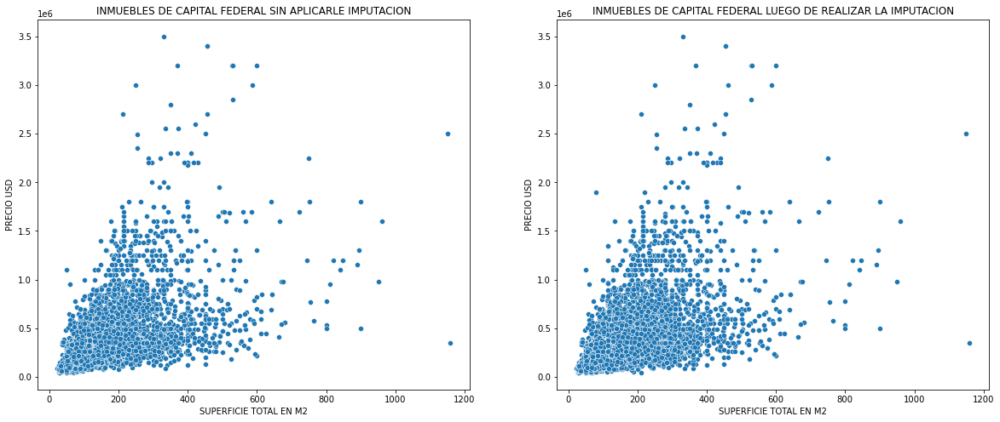

In [356]:
fig,ax = plt.subplots(ncols=2, figsize=(20,8))

g1 =sns.scatterplot(data = df[df.state_name=='capitalfederal'], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD',ax = ax[1])
g2 = sns.scatterplot(data = df_sin_imputar, x='SUPERFICIE TOTAL EN M2', y='PRECIO USD', ax=ax[0])

g1.set_title("INMUEBLES DE CAPITAL FEDERAL LUEGO DE REALIZAR LA IMPUTACION")
g2.set_title("INMUEBLES DE CAPITAL FEDERAL SIN APLICARLE IMPUTACION")

plt.show()

### Vamos a separar por zonas comunales a los inmuebles, a ver como afecto la imputacion.

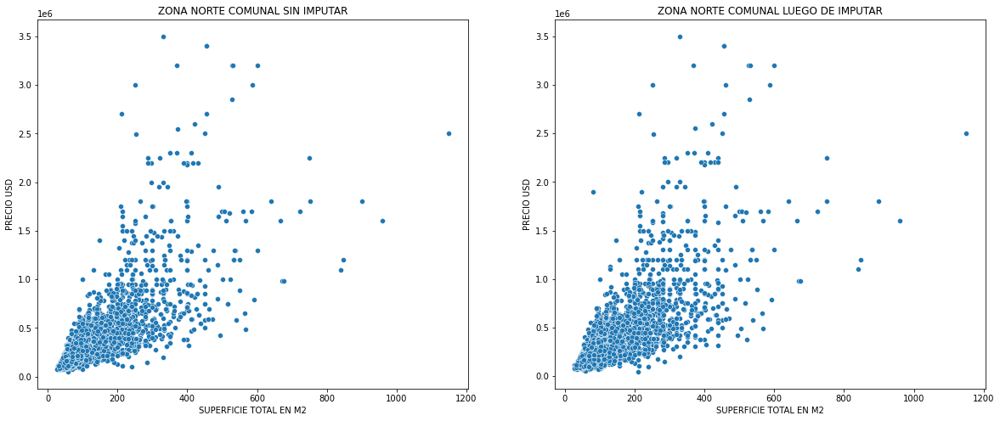

In [357]:
fig,ax = plt.subplots(ncols=2, figsize=(20,8))

g1 = sns.scatterplot(data = df[np.logical_and(df.state_name=='capitalfederal',df['ZONAS COMUNALES']=='ZONA NORTE COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD',ax = ax[1])
g2 = sns.scatterplot(data = df_sin_imputar[np.logical_and(df_sin_imputar.state_name=='capitalfederal',df_sin_imputar['ZONAS COMUNALES']=='ZONA NORTE COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD', ax=ax[0])

g1.set_title("ZONA NORTE COMUNAL LUEGO DE IMPUTAR")
g2.set_title("ZONA NORTE COMUNAL SIN IMPUTAR")

plt.show()

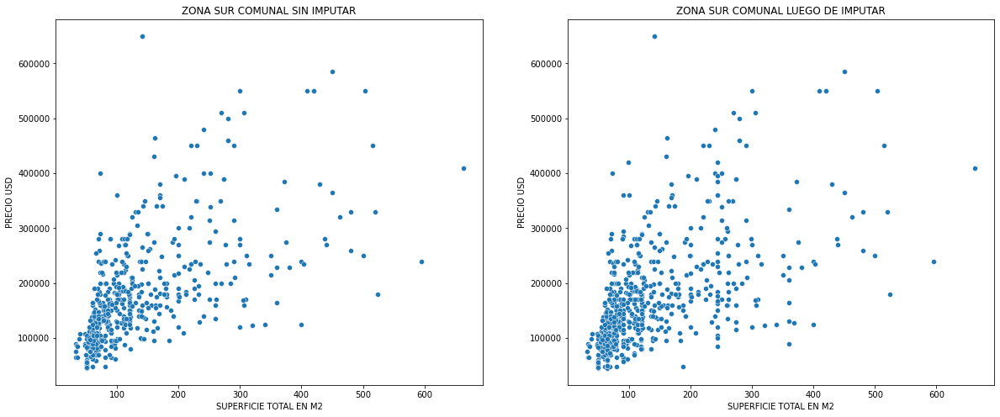

In [358]:
fig,ax = plt.subplots(ncols=2, figsize=(20,8))

g1 = sns.scatterplot(data = df[np.logical_and(df.state_name=='capitalfederal',df['ZONAS COMUNALES']=='ZONA SUR COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD',ax = ax[1])
g2 = sns.scatterplot(data = df_sin_imputar[np.logical_and(df_sin_imputar.state_name=='capitalfederal',df_sin_imputar['ZONAS COMUNALES']=='ZONA SUR COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD', ax=ax[0])

g1.set_title("ZONA SUR COMUNAL LUEGO DE IMPUTAR")
g2.set_title("ZONA SUR COMUNAL SIN IMPUTAR")

plt.show()

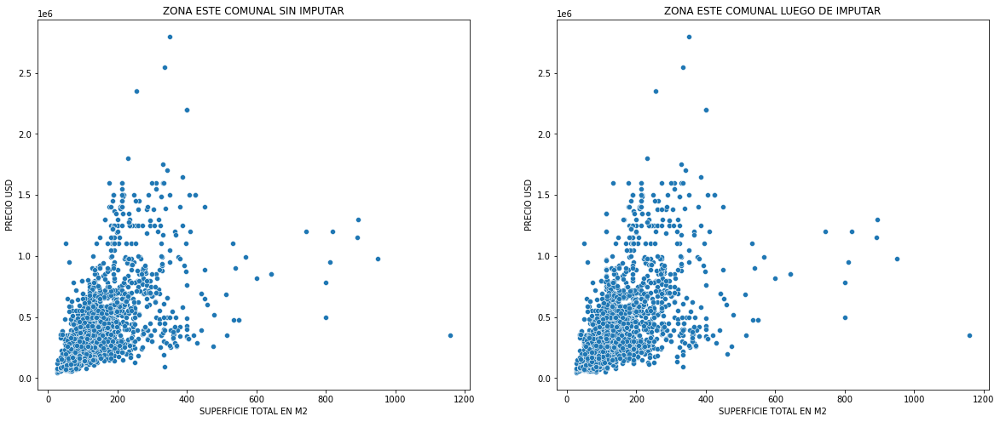

In [359]:
fig,ax = plt.subplots(ncols=2, figsize=(20,8))

g1 = sns.scatterplot(data = df[np.logical_and(df.state_name=='capitalfederal',df['ZONAS COMUNALES']=='ZONA ESTE COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD',ax = ax[1])
g2 = sns.scatterplot(data = df_sin_imputar[np.logical_and(df_sin_imputar.state_name=='capitalfederal',df_sin_imputar['ZONAS COMUNALES']=='ZONA ESTE COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD', ax=ax[0])

g1.set_title("ZONA ESTE COMUNAL LUEGO DE IMPUTAR")
g2.set_title("ZONA ESTE COMUNAL SIN IMPUTAR")

plt.show()

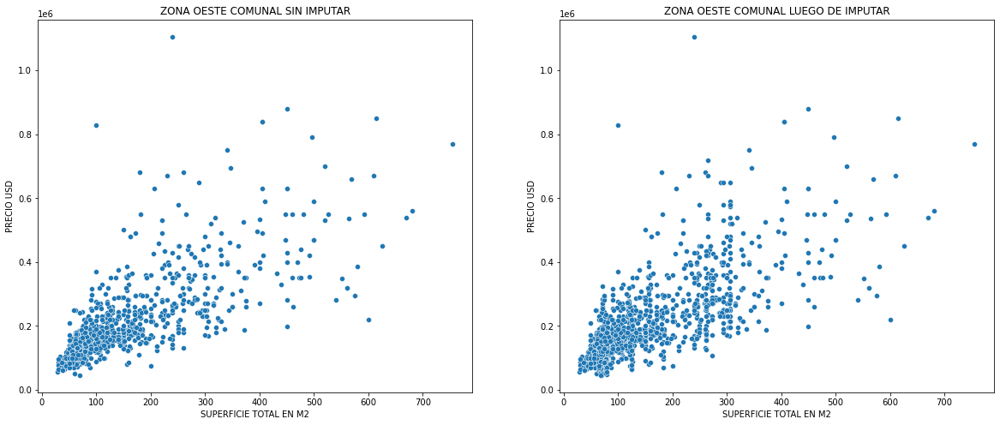

In [360]:
fig,ax = plt.subplots(ncols=2, figsize=(20,8))

g1 = sns.scatterplot(data = df[np.logical_and(df.state_name=='capitalfederal',df['ZONAS COMUNALES']=='ZONA OESTE COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD',ax = ax[1])
g2 = sns.scatterplot(data = df_sin_imputar[np.logical_and(df_sin_imputar.state_name=='capitalfederal',df_sin_imputar['ZONAS COMUNALES']=='ZONA OESTE COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD', ax=ax[0])

g1.set_title("ZONA OESTE COMUNAL LUEGO DE IMPUTAR")
g2.set_title("ZONA OESTE COMUNAL SIN IMPUTAR")

plt.show()

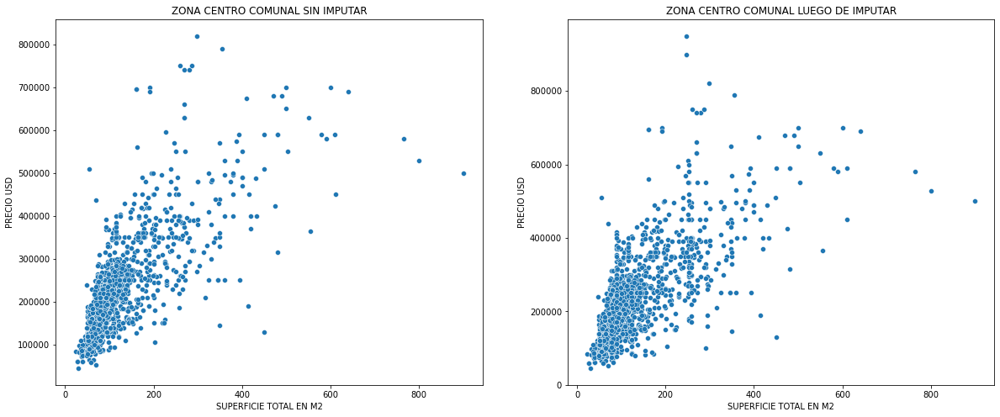

In [361]:
fig,ax = plt.subplots(ncols=2, figsize=(20,8))

g1 = sns.scatterplot(data = df[np.logical_and(df.state_name=='capitalfederal',df['ZONAS COMUNALES']=='ZONA CENTRO COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD',ax = ax[1])
g2 = sns.scatterplot(data = df_sin_imputar[np.logical_and(df_sin_imputar.state_name=='capitalfederal',df_sin_imputar['ZONAS COMUNALES']=='ZONA CENTRO COMUNAL')], x='SUPERFICIE TOTAL EN M2', y='PRECIO USD', ax=ax[0])

g1.set_title("ZONA CENTRO COMUNAL LUEGO DE IMPUTAR")
g2.set_title("ZONA CENTRO COMUNAL SIN IMPUTAR")

plt.show()

#### **No parece haber grandes cambios luego de la imputacion, por lo que vamos a adoptar esta imputacion**